#SPMPY data loading platform (2D.sxm, Atomic resolution) 

> Authors: Dr. Jewook Park(IBS-CALDES)
, Hyoungkug Kim (Prof. Taehwan Kim's group, POSTECH), Taemin Ahn (Prof. Taehwan Kim group's, POSTECH) 

> * *IBS-CALDES (Inistitute for Basic Science,Center for Artificial Low Dimensional Electronic Systems), South Korea*
* *Professor Taehwan Kim' group POSTECH (Pohang University of Science and Technology)*

> email:  jewookpark@ibs.re.kr


>> SPMPY aims for a python package for code-based scanning probe microscopy data analysis. Scanning probe microscopy(SPM), such as scanning tunneling microscopy and spectroscopy (STM/S) and atomic force microscopy (AFM), generate an inherently multidimensional dataset, which possesses scientific information in nanoscale. SPMPY exploits recent image processing techniques, a.k.a. computer vision technology, to the multidimensional dataset. Automated data processing with computational power will extract scientific information from experimental data and accelerate cutting-edge research in nanoscience.

* SPMPY provides data loading platform for the Nanonis data set (* .dat, *.sxm, *.3ds) to convert the multidimensional SPM data as PANDAS DataFrames. To take advantage of SPMPY, other types of SPM data are supposed to be converted as DataFrame in advance. 

## **Nanonis** 2D data (*.sxm) file loading 
sxm data file to ** PANDAS** DataFrame
> This notebook is intended as an example of **SPMPY** project usage.
 **SPMPY** is an open source project. 
Github : https://github.com/Jewook-Park/SPMPY

Data flow chart will be added sooner or later.

Contributions, comments, ideas, error reports are always welcome.  Please use the Github page.
Comments & remarks sholud be Korean or English. 

### **Part1**  Import necessary packages

In [26]:
##################
# Introduction   # 
##################
'''
SPMPY data loading platform
Authors: Dr. Jewook Park(IBS-CALDES),
        Hyoungkug Kim (Prof. Taehwan Kim's group, POSTECH), 
        Taemin Ahn (Prof. Taehwan Kim group's, POSTECH)

IBS-CALDES (Inistitute for Basic Science,
Center for Artificial Low Dimensional Electronic Systems), South Korea
Professor Taehwan Kim' group,
POSTECH (Pohang University of Science and Technology)

email: jewookpark@ibs.re.kr


Nanonis 2D data (*.sxm) file loading
sxm data file to ** PANDAS** DataFrame

This notebook is intended as an example of SPMPY project usage. 
SPMPY is an open source project. 
Github : https://github.com/Jewook-Park/SPMPY 
Data flow chart will be added sooner or later.

Contributions, comments, ideas, error reports are always welcome. 
please use the Github page.
comments & remarks sholud be Korean or English. 
'''
#############################
# Part1
#############################


!pwd
!ls
# some times... the isns package is not properly imported. 
# I.D.K.W....
# try runtime  re-connection. 

#############################
# Import necessary packages #
#############################


import os
import glob
import numpy as np
import numpy.fft as npf
import xarray as xr
import pandas as pd
import scipy as sp
import sklearn
from scipy import optimize
from scipy import integrate as it
from scipy import ndimage as ndi
from scipy.spatial import distance
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter
import skimage
from skimage import data
from skimage import transform
from skimage.morphology import disk
from skimage import (color, feature, filters,
                     measure, morphology, segmentation, util)
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Circle
from matplotlib import cm 
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
import math
from math import sqrt
import cv2
import itertools
from warnings import warn
from skimage import transform
from skimage.transform import warp
from skimage.feature import peak_local_max
from skimage import data, img_as_float
#from skimage.filters import butterworth
# skimage 0.19dev 이후 추가된 function임. 
# colab에서는 사용안됨. 


# some packages are not included in google-colab
try:
     from pptx import Presentation
except ModuleNotFoundError:
    warn('ModuleNotFoundError: No module named pptx')
    !pip install python-pptx  
    from pptx import Presentation
    from pptx.util import Inches, Pt





try:
    import nanonispy as nap
except ModuleNotFoundError:
    warn('ModuleNotFoundError: No module named nanonispy')
    !pip install nanonispy
    import nanonispy as nap

try:
    import xrft
except ModuleNotFoundError:
    warn('ModuleNotFoundError: No module named xrft')
    !pip install xrft 
    import xrft

try:
    import seaborn_image as isns
except ModuleNotFoundError:
    warn('ModuleNotFoundError: No module named seaborn-image')
    #!pip install --upgrade scikit-image == 0.19.0.dev0
    !pip install --upgrade seaborn-image    
    import seaborn_image as isns
# try,  restart run time & update skimage
!pip install scikit-image==0.18.3
from skimage.filters import difference_of_gaussians, window
!pip list

/content/drive/My Drive/Colab Notebooks/Au(111) set2
'Au(111)_LN2T_Wtip4_4009.sxm'  'Grid Spectroscopy001.3ds'
'Au(111)_Wtip3_LN2T_0031.sxm'
Package                       Version
----------------------------- --------------
absl-py                       0.12.0
alabaster                     0.7.12
albumentations                0.1.12
altair                        4.1.0
appdirs                       1.4.4
argcomplete                   1.12.3
argon2-cffi                   21.1.0
arviz                         0.11.4
astor                         0.8.1
astropy                       4.3.1
astunparse                    1.6.3
atari-py                      0.2.9
atomicwrites                  1.4.0
attrs                         21.2.0
audioread                     2.1.9
autograd                      1.3
Babel                         2.9.1
backcall                      0.2.0
beautifulsoup4                4.6.3
bleach                        4.1.0
blis                          0.4.1
bokeh          




# Installing Jewook's functions 


* 가능하면 이후 필요한함수들은 초반에 미리 불러둔다. 
* 함수들의 기능을 좀더 친철하게 describe 해둔다. 
* 나중에 class 도입하여 module화 하면 좀더 간편해지겠지만, 당장은 현재상태 유지. 
* 현재 기능이 겹치는 function들 존재 정리필요. 


In [27]:

##################################      
#   Jewook-defined Functions     # 
##################################

###################################################
# y fit
def plane_y_fit(image2D):
    '''
    Parameters
    ----------
    image2D : np.array
        2D scan data  Y (slow scan direction) direction avg move
        
    Returns
    -------
    image_2D_y_fit : np.array
        y plane fit  np results 
    '''
    image_2D_y_fit = (image2D.T- image2D.mean(axis=1)).T
    #image_2D_y_fit = (image2D- image2D.mean(axis=0))
    # 원래  image를 transpose 후 axis=1 방향으로 평균을 빼낸 결과
    return image_2D_y_fit



# x fit 
def plane_x_fit(image2D):
    '''
    
    Parameters
    ----------
    image2D :  np.array
        2D scan data  X (fast scan direction) direction plane fit
    Returns
    -------
    image2D_x_fit : np.array
        x plane fit  np results 
    '''
    image2D_x_fit = image2D -  image2D.mean(axis=0)
    # Y 방향 평균을  X 마다 전부 뺐음. 
    return image2D_x_fit
##################################################

##################################################
# pandas 의 경우 
##################################################
#			 df in & df out 	 #
##################################

# y fit
def plane_y_fit_df(image2D_df):
    '''
    Parameters
    ----------
    image2D_df : pd.DataFrame input 
        2D scan data  Y (slow scan direction) direction avg move
    Returns
    -------
    image_2D_y_fit_df :pd.DataFrame output
        y plane fit.
    '''
    image2D = image2D_df.to_numpy() 
    # numpy  로 바꿈
    image_2D_y_fit = (image2D.T- image2D.mean(axis=1)).T
    #image_2D_y_fit = (image2D- image2D.mean(axis=0))
    # 원래  image를 transpose 후 axis=1 방향으로 평균을 빼낸 결과
    image_2D_y_fit_df = pd.DataFrame(
        image_2D_y_fit,
        index = image2D_df.index,
        columns = image2D_df.columns)
    return image_2D_y_fit_df
# x fit 
def plane_x_fit_df(image2D_df):
    '''
    Parameters
    ----------
    image2D_df : pd.DataFrame input 
                2D scan data  X (fast scan direction) direction plane fit
                
    Returns
    -------
    image2D_x_fit_df : pd.DataFrame output
        x plane fit.
    '''
    
    image2D = image2D_df.to_numpy() 
    # numpy  로 바꿈
    image2D_x_fit = image2D -  image2D.mean(axis=0)
    # Y 방향 평균을  X 마다 전부 뺐음. 
    image2D_x_fit_df = pd.DataFrame(
        image2D_x_fit,
        index = image2D_df.index, 
        columns = image2D_df.columns)
    # df 로 재변환 
    return image2D_x_fit_df
###################################################
#isns.imshow(plane_x_fit(plane_y_fit(z_fwd)))


###############
# 2D FFT 구하기 #
###############
# numpy 
def two_d_FFT(image):
    '''
    
    Parameters
    ----------
    image : 2D numpy input 
        Calcuate Fast Fourier Transform.
    Returns
    -------
    image_fft :  2D numpy output
        To avoid negative value, 
        (add 1 (+1) to fft result) & log.
    '''
    fft=np.fft.fft2(image) ### fft only
    fft_shift=np.fft.fftshift(fft)   # 2d fft를 위한 image shift
    #image_fft=np.log(np.abs(fft_shift)) 
    image_fft=np.log(np.abs(fft_shift)+1) #음수가나오지않도록+1
    return image_fft
# PANDAS 
def two_d_FFT_df(image_df):
    """
    
    Parameters
    ----------
    image_df :  pd.DataFrame input 
        Calcuate Fast Fourier Transform of DataFrame format.

    Returns
    -------
    image_fft_df : pd.DataFrame output 
        (add 1 (+1) to fft result) & log.

    """
    
    image = image_df.to_numpy()
    fft=np.fft.fft2(image) ### fft only
    fft_shift=np.fft.fftshift(fft)   # 2d fft를 위한 image shift
    #image_fft=np.log(np.abs(fft_shift))
    image_fft=np.log(np.abs(fft_shift)+1)  #음수가나오지않도록+1
    image_fft_df = pd.DataFrame(image_fft)
    
    return image_fft_df
#####################
# FFT를 하고 나면 전체 크기는 짝수, 가운데  라인은 -1,+1을 합쳐야 의미가 있다. 
# 0 가 들어가서 inf 가 존재하기 때문에 error 
# FFT 결과의 size는  image의 최소 pixel의 역수 
# topo( 10nm, 512px ) 
# ==> # fft ( 512/10  px/nm : 전체 크기, 한 pixel size 가 1/10)
######################################
#size_x  image size
#step_dx pixel size 
######################################
#FFT의 전체크기 
#Grid_3D_xr_nm.X.shape[0]/size_x
#Grid_3D_xr_nm.Y.shape[0]/size_y
######################################
# FFT 의 nX 
# Grid_3D_xr_nm.X/step_dx  # pixel을 정수화
######################################
#Grid_3D_xr_nm.X/step_dx*(1/size_x)
#Grid_3D_xr_nm.Y/step_dy*(1/size_y)
# 정수 pixel을 만들어서 다시 FF step 단위(1/size_x)로 곱함 
# 


##################################      
#    plane fitted topography     # 
#		 - Numpy based 			 #
##################################
def plane_sub_surface (topography,order=2):
    """

    Parameters
    ----------
    topography : 2D numpy data
        DESCRIPTION.
    order : integer , optional
        # 1: linear, 2: quadratic. The default is 2.

    Returns
    -------
    plane_topography : 2D numpy data
        Substract the 2D polyfitted plane.

    """
    # regular grid covering the domain of the data
    X,Y = np.meshgrid(nX,nY)
    XX = X.flatten()
    YY = Y.flatten()
    
    data_t=np.array([X.ravel(),Y.ravel(), topography.ravel()])
    data=np.transpose(data_t) # 각각의 point 위치와 topo를 이용한 2차원 array
    
    #order = 2     # 1: linear, 2: quadratic
    if order == 1:
        # best-fit linear plane
        A = np.c_[data[:,0], data[:,1], np.ones(data.shape[0])]
        C,_,_,_ = scipy.linalg.lstsq(A, data[:,2])    # coefficients
        
        # evaluate it on grid
        Z = C[0]*X + C[1]*Y + C[2]
        
        # or expressed using matrix/vector product
        #Z = np.dot(np.c_[XX, YY, np.ones(XX.shape)], C).reshape(X.shape)
    
    elif order == 2:
        # best-fit quadratic curve
        A = np.c_[np.ones(data.shape[0]), data[:,:2], 
                  np.prod(data[:,:2], axis=1), data[:,:2]**2]
        C,_,_,_ = scipy.linalg.lstsq(A, data[:,2])
        
        # evaluate it on a grid
        Z = np.dot(np.c_[np.ones(XX.shape), XX, YY, XX*YY,
                         XX**2, YY**2], C).reshape(X.shape)
        plane_topography = topography-Z  
        return plane_topography
########################################################################
'''
#########################################   
# X 방향 avg # y polyfit 을 substract	#
# y 방향 avg #  x 방향을 fitting			# 
# - Numpy based 						#
#########################################

def y_poly_fit_sub(topography,pf_order): # polyfit order  
    topo_pln_temp_xavg=np.array([np.average(topo_x) 
                                 for topo_x in topography])
    x_polyfit_order=pf_order
    topo_pln_temp_x_polyfit = np.polyfit(x,
                                         topo_pln_temp_xavg,x_polyfit_order) 
    topo_pln_temp_x_avg_fit = np.polyval(topo_pln_temp_x_polyfit,x)
    #plt.plot(topo_pln_temp_xavg,'b-',topo_pln_temp_x_avg_fit,'k--')
    #plt.legend(( 'avg(x)','avg(x) fit 1'),loc='upper right')
    topo_pln_xavg_plyft = np.array([topo_x-topo_pln_temp_x_avg_fit 
                                    for topo_x in topography])
    pf_sub_topography = topo_pln_xavg_plyft
    return pf_sub_topography

def x_poly_fit_sub(topography,pf_order):
    topo_x_raw_pf_results = topography - np.array([np.polyval( 
        np.polyfit(x, topo_x,pf_order),x) for topo_x in topography])
    return topo_x_raw_pf_results
#############################################################
# 불필요한 function.
'''

#####################################
# Area plane fit # df in & df out   #  
#####################################


#############################################
# Square area (x1,y1),(x2,y2) selection     # 
# find plane fit ==> apply to total image 	#
#############################################
def df_plane_fit_area (image2D, col_a1,row_b1,col_a2,row_b2):
    """
    

    Parameters
    ----------
    image2D : pd.DataFrame
        input 2D data.
    col_a1 : integer,  ref point (cx1)
    row_b1 : integer,  ref point (ry1)
    
    col_a2 : integer,  ref point (cx2)
    row_b2 : integer,  ref point (ry2)

    Returns
    -------
    plane_fit_area_substraction_df :  pd.DataFrame
        output 2D data

    """
        
    from skspatial.objects import Points, Plane
    from skspatial.plotting import plot_3d
    # point list 
    image2D = image2D.to_numpy()
    # image_2D.shape = (80,40) = (row_yj,col_xi)
    # col_x, row_y =>  (a1,b1) 과 (a2,b2) z 를 불러오려면 
    # image2D[rowy,col_x] 대입해야함.. 
    
    area_points = np.array([[row_j,col_i, image2D[row_j,col_i]] 
                            for row_j in  np.arange(row_b1,row_b2)  
                            for col_i in  np.arange(col_a1,col_a2)])
    # x,y,z 의 순서임. z 는 image에서 위치에 해당하는값을 반환.
    area_plane_fit = Plane.best_fit(area_points)
    (nY, nX) = image2D.shape
    XX,YY = np.meshgrid(np.arange(0,nX), np.arange(0,nY))
    ZZ = area_plane_fit.point[2] - (
        area_plane_fit.normal[0]*(XX-area_plane_fit.point[0])
        +area_plane_fit.normal[1]*(YY-area_plane_fit.point[1])
        )/area_plane_fit.normal[2]
    plane_fit_area_substraction_df = pd.DataFrame(image2D-ZZ)
    return plane_fit_area_substraction_df
#######################################################################

###############################################
#나중 에 point  를 GUI로 받는 법 추가할것 
# colab에서는 안됨. 
# interactive plot은 (jupyter notebook ) plotly 사용가능 
# spyder 혹은 pycharm은 사용은 사용가능. 
#################################################


#####

##############################################
# 3 point plane fit substraction 		 	 #
# 3(X,Y) points  for triangle & define plane #
# df frame 기준 fucntion 						 #
##############################################
def df_plane_fit_3points (image2D, col_x1,row_y1,col_x2,row_y2,col_x3,row_y3):
    """
    input : 3 data points => define plane 

    Parameters
    ----------
    image2D : TYPE : PANDAS DataFrame 
        DESCRIPTION.: original 2D image
    col_x1 : TYPE : integer 
        DESCRIPTION.
    row_y1 : TYPE : integer 
        DESCRIPTION.
    col_x2 : TYPE : integer 
        DESCRIPTION.
    row_y2 : TYPE : integer 
        DESCRIPTION.
    col_x3 : TYPE : integer 
        DESCRIPTION.
    row_y3 : TYPE : integer 
        DESCRIPTION.

    Returns
    -------
    plane_fit_3p_substraction : TYPE : PANDAS DataFrame 
        DESCRIPTION. : 2D image after 3point fitting 

    """
  
    ##################################
    # 주어진 3점으로 plane fit을 한다.      
    from skspatial.objects import Points, Plane
    from skspatial.plotting import plot_3d
    # 세점의 x,y,에 해당하는 각각의 z 값은 
    z1 = image2D.to_numpy()[row_y1,col_x1]
    z2 = image2D.to_numpy()[row_y2,col_x2]
    z3 = image2D.to_numpy()[row_y3,col_x3]
    # plane 을 취할 points
    plane_points= Points(
        [ [col_x1,row_y1,z1],[col_x2,row_y2,z2],[col_x3,row_y3,z3]])
    ##################################
    # 주어진 점들을 이용한  plane fit 
    plane_fit = Plane.best_fit(plane_points)
    #################################
    # plane을 빼주기 위해서 평면의 방정식 a*(x-x1)+b*(y-y1)+c*(z-z1)=0 을 활용
    #  (원래 z 값 ) - 평면의 방정식으로 얻은 z0 = plane fit substraction 
    #################################
    # plane의 point 값 은 plane_fit.point 으로 불러옴 
    # plane_fit.point[0],plane_fit.point[1],plane_fit.point[2]
    #################################
    # plane의 normal vector 값 은 plane_fit.normal 로 불러옴 
    # plane_fit.normal[0],plane_fit.normal[1],plane_fit.normal[2]
    #################################
    # 찾아야 하는 z 값 
    # z = z0 - {a(x-x0)+b*(y-y0)}/c
    ##################################
    #row_Y = I_LIX_all_pd_df_004_S.z.unstack().index.T
    # 원래 z. unstack 2D image 값에서  row index를 뽑아내서 저장 
    #col_X = I_LIX_all_pd_df_004_S.z.unstack().droplevel('bias_mV', axis=1).columns
    # 원래 z 값에서 (unstack-> 2D image) bias 정보 없애고, column 정보만 따로저장
    ##################################
    # 주어진 image 의 크기에 맞는  XX,YY,ZZ 를 구현 
    # image에 맞춰서 (nX,nY) => XX,YY 를 mesh grid 로 작성 
    (nY, nX) = image2D.shape
    # nY 가 먼저 오는 점 주의
    XX,YY = np.meshgrid(np.arange(0,nX), np.arange(0,nY))
    #################################
    # mesh grid로 구성된 XX,YY 의 좌표계에서 
    # plane fit 평면의 방정식에 따라서 ZZ를 찾아냄)
    ##################################
    ZZ = plane_fit.point[2] - (
        plane_fit.normal[0]*(XX-plane_fit.point[0])
        +plane_fit.normal[1]*(YY-plane_fit.point[1])
        )/plane_fit.normal[2]
    plane_fit_3p_substraction = pd.DataFrame( image2D-ZZ )
    #결과값을 DataFrame 형태로 반환
    
    return plane_fit_3p_substraction
########################################################################
####
###############################################
#나중 에 point  를 GUI로 받는 법 추가할것 
#################################################

####################################################
# rescale image intensity #  before remove outliers#
####################################################

#########################
# rescale_intensity  # Numpy 
def rescale_intensity(img,lower_percent=2,upper_percent=98):
    """
    Parameters
    ----------
    img : TYPE : 2D np array
        DESCRIPTION.
    lower_percent : TYPE (float, percent), optional
        DESCRIPTION. The default is 2.
    upper_percent : TYPE (float, percent) , optional
        DESCRIPTION. The default is 98.
    Returns
    -------
    img_rescale : TYPE : 2D np array
        DESCRIPTION.
        equlizeed image based on percent range 
    """
    p2, p98 = np.percentile(img, (lower_percent, upper_percent))
    img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))
    return img_rescale
#########################

# image rescaling # PANDAS version 
def df_image_rescale(image2D, lower_percent =2, upper_percent = 98):
    """
    

    Parameters
    ----------
    image2D : TYPE : PANDAS (2D) DataFrame
        DESCRIPTION.
    lower_percent : TYPE (float, percent), optional
        DESCRIPTION. The default is 2.
    upper_percent : TYPE (float, percent), optional
        DESCRIPTION. The default is 98.

    Returns
    -------
    image2D_rescale : TYPE  : PANDAS (2D) DataFrame
        DESCRIPTION.equlizeed image based on percent range 

    """
    image2D = image2D.to_numpy()
    # DataFrame을 numpy로 바꾸고
    lower_p, upper_p =  np.percentile(
        image2D, (lower_percent, upper_percent))
    # 2,98 로 기본값 setting, 그러나 입력가능
    image2D_rescale = exposure.rescale_intensity(
        image2D, in_range=(lower_p, upper_p))
    # rescale 한결과
    image2D_rescale = pd.DataFrame(image2D_rescale) # df로 변환
    
    return image2D_rescale
#############################
#  intensity rescaeing 은 isns  에서 하면될것 같다. 
#############################

#########################
# Threshold_MultiOtsu	#
# df in &  df_out 		#
# imshow results 		# 

def df_threshold_multiotsu(image_2D_df, classes_number = 3):
    """
    Parameters
    ----------
    image_2D_df :  : PANDAS (2D) DataFrame
        DESCRIPTION.
    classes_number : TYPE, optional
        DESCRIPTION. The default is 3.
    Returns
    -------
    region_image_df :  : PANDAS (2D) DataFrame
        DESCRIPTION.
    TYPE : plt.show() 
        DESCRIPTION.: To adjust  figiure setting 
    """
    image_2D_np = image_2D_df.to_numpy()	# image_to_numpy
    treshold_image =  threshold_multiotsu(image_2D_np, classes = classes_number)
    region_image = np.digitize(image_2D_np, bins = treshold_image)
    region_image_df = pd.DataFrame(region_image) # df로 변환	
    fig, axes = plt.subplots(1, 3, figsize=(6, 6),sharex=True, sharey=True)
    ax = axes.ravel()
    ax[0].imshow(image_2D_np, cmap=plt.cm.gray)
    ax[0].set_title("Original")
    ax[1].imshow(region_image, cmap=plt.cm.nipy_spectral)
    ax[1].set_title("region_image")
    ax[2].hist(treshold_image)
    ax[2].set_title("treshold_image")
    for a in ax:
        a.axis('off')
    fig.tight_layout()
    return region_image_df, plt.show()


    
################################################


#################################
# skimage extrema 
#################################
def find_extreme (image,h):
    img = exposure.rescale_intensity(image)

    local_maxima = extrema.local_maxima(img)
    label_maxima = label(local_maxima)

    overlay = color.label2rgb(label_maxima, img, 
                              alpha=0.7, bg_label=0,
                              bg_color=None, colors=[(1, 0, 0)])
    h = h
    h_maxima = extrema.h_maxima(img, h)
    label_h_maxima = label(h_maxima)
    overlay_h = color.label2rgb(label_h_maxima, img, 
                                alpha=0.7, bg_label=0, 
                                bg_color=None, colors=[(1, 0, 0)])
    # a new figure with 3 subplots
    fig, ax = plt.subplots(1, 3, figsize=(9, 3))

    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Original image')
    ax[0].axis('off')
    
    ax[1].imshow(overlay)
    ax[1].set_title('Local Maxima')
    ax[1].axis('off')
    
    ax[2].imshow(overlay_h)
    ax[2].set_title('h maxima for h = %.2f' % h)
    ax[2].axis('off')
    plt.show()

    return local_maxima,label_maxima,label_h_maxima
#########################
    
##################################
##  2D image 에서 peak찾기 #######
#################################
def peak_local_max_2D(two_dimn_image,size_r)    :
    im = two_dimn_image
    # image_max is the dilation of im with a 20*20 structuring element
    # It is used within peak_local_max function
    image_max = ndi.maximum_filter(im, size=size_r, mode='constant')
    # Comparison between image_max and im to find the coordinates of local maxima
    coordinates = peak_local_max(im, min_distance=size_r)

    return image_max, coordinates

####################################################################################################################################
"""
############################   
###  ellipse fitting 타원 fitting   #
############################# 
def fit_rotated_ellipse(data):

	xs = data[:,0].reshape(-1,1) 
	ys = data[:,1].reshape(-1,1)

	J = np.mat( np.hstack(
        (xs*ys,ys**2,xs, ys, np.ones_like(xs,dtype=np.float))) )
	Y = np.mat(-1*xs**2)
	P= (J.T * J).I * J.T * Y

	a = 1.0; b= P[0,0]; c= P[1,0]; d = P[2,0]; e= P[3,0]; f=P[4,0];
        # To do implementation
        #a,b,c,d,e,f 를 통해 
        # theta, 중심(cx,cy) , 장축(major), 단축(minor) 등을 뽑아 냄

	theta = 0.5* np.arctan(b/(a-c))  
	cx = (2*c*d - b*e)/(b**2-4*a*c)
	cy = (2*a*e - b*d)/(b**2-4*a*c)
	cu = a*cx**2 + b*cx*cy + c*cy**2 -f
	w= np.sqrt(cu/(a*np.cos(theta)**2 + b* np.cos(theta)*np.sin(theta) \
                + c*np.sin(theta)**2))
	h= np.sqrt(cu/(a*np.sin(theta)**2 - b* np.cos(theta)*np.sin(theta) \
                + c*np.cos(theta)**2))

	return (cx,cy,w,h,theta) # 중심 xy, width, height, 각도 
#############################################################################


############################   
###  Hexa points based on fitting resutls 
############################# 
def hexa_points_based_on_ellipse_fit(cx,cy,w,h,theta):
    hex_ellipse_perimeter = draw.ellipse_perimeter(int(cx),int(cy),
                                                   int(w),int(h),
                                                   theta)   
    # ellipse의 line point dataset 
    # skimage.draw.ellipse_perimeter(r, c, r_radius, c_radius,
    #                                   orientation=0, shape=None)
    radius_r = (w+h)/2  # 장단축 평균 을 r
    ## radious is actually width of hexagon 
    ## point 따라 바뀜. 장축이 x일때or  장축이 y일때 
    '''
    #### vertical
    hex_6points=np.float32([[cx+radius_r,cy],
                            [cx+0.5*radius_r,cy+math.sqrt(3)*0.5*radius_r],
                            [cx+0.5*radius_r,cy-math.sqrt(3)*0.5*radius_r],
                            [cx-0.5*radius_r,cy+math.sqrt(3)*0.5*radius_r],
                            [cx-0.5*radius_r,cy-math.sqrt(3)*0.5*radius_r], 
                            [cx-radius_r,cy]])
   ''' 
    ### horizontal
    hex_6points=np.float32([[cx+math.sqrt(3)*0.5*radius_r,cy-0.5*radius_r],
                            [cx+math.sqrt(3)*0.5*radius_r,cy+0.5*radius_r],
                            [cx,cy-radius_r],
                            [cx,cy+radius_r],
                            [cx-math.sqrt(3)*0.5*radius_r,cy-0.5*radius_r],
                            [cx-math.sqrt(3)*0.5*radius_r,cy+0.5*radius_r]])
    return hex_6points
##############################################################################

"""

############################   
### gauss_function for fitting
############################# 
def gauss_function(x, A, x0, sigma):
    
    return A*np.exp(-(x-x0)**2/(2*sigma**2))

def _1gaussian(x_array, amp1,cen1,sigma1): 
    return amp1*(1/(sigma1*(np.sqrt(2*np.pi))))*(
        np.exp((-1.0/2.0)*(((x_array-cen1)/sigma1)**2)))

def _2gaussian(x_array, amp1,cen1,sigma1, amp2,cen2,sigma2):

    return amp1*(1/(sigma1*(np.sqrt(2*np.pi))))*(
        np.exp((-1.0/2.0)*(((x_array-cen1)/sigma1)**2))) +\
        amp2*(1/(sigma2*(np.sqrt(2*np.pi))))*(
            np.exp((-1.0/2.0)*(((x_array-cen2)/sigma2)**2)))
#############################################################################
# 좀더 편한 방법이 있는지 다른 module 찾아볼수 있어야함. 


############################   
### find nearest index of array for given value
############################# 
#`values` should be sorted
def get_closest(array, values):
    """
    

    Parameters
    ----------
    array : TYPE : array --> np.arrary()
        DESCRIPTION.
    values : TYPE : target value 
        DESCRIPTION.

    Returns
    -------
    TYPE original array 
        DESCRIPTION.

    """
    #make sure array is a numpy array
    array = np.array(array)
    # get insert positions
    idxs = np.searchsorted(array, values, side="left")
    # find indexes where previous index is closer
    prev_idx_is_less = ((idxs == len(array))|(np.fabs(
        values - array[np.maximum(idxs-1, 0)]) < np.fabs(
            values - array[np.minimum(idxs, len(array)-1)])))
    idxs[prev_idx_is_less] -= 1

    return array[idxs]

#################################################################
def find_nearest(array, values):
    """
    

    Parameters
    ----------
    array : TYPE : array --> np.arrary()
        DESCRIPTION.
    values : TYPE : target value 
        DESCRIPTION.

    Returns
    -------
    TYPE : original array 
        DESCRIPTION.
    indices : TYPE : index 
        DESCRIPTION.

    """
    array = np.asarray(array)
    # the last dim must be 1 to broadcast in (array - values) below.
    values = np.expand_dims(values, axis=-1) 
    indices = np.abs(array - values).argmin(axis=-1)

    return array[indices],indices
#################################################################


################################################################
# Outlier 제거 
################################################################
# 표준편차를 구해보니 이상치들이 많은경우
def remove_outlier_df(target_df):
    """
    

    Parameters
    ----------
    target_df : TYPE : PANDAS DataFrame
        DESCRIPTION.
         

    Returns
    -------
        outlier references dd.quantile 1/4 *1.5. 3/4*1.5
        
    search_outlier_df : TYPE : PANDAS DataFrame
        DESCRIPTION.  removed outliers
    filterout_df : TYPE : PANDAS DataFrame
        DESCRIPTION. filtered DataFrame

    """
    quartile_1 = target_df.quantile(0.25)# 퍼센타일 1/4분위수
    quartile_3 = target_df.quantile(0.75)# 퍼센타일 3/4분위수
    IQR = quartile_3 - quartile_1# 중앙 50% 구간 폭
    condition = (target_df < (quartile_1 - 1.5 * IQR)) | (
	target_df > (quartile_3 + 1.5 * IQR))
	# outlier 구간폭 설정 
    condition = condition.any(axis=1)
    search_outlier_df = target_df[condition]
	# outlier  찾기 
    filterout_df = target_df.drop(search_outlier_df.index, axis=0)
	# outlier 잘라내기
    return search_outlier_df,filterout_df
# 각각의 LIx_o  bias 별로 out lier들을 찾고 있으면 삭제.
# quantile 에서 1/4 - 3/4 사이 간격의 1.5 바깥에 해당하는 영역들 제외 
#################################################################################

############################################################################
## 2차원 대입하여 특정 숫자로 패딩하고 일정할 길이로 만드는 함수
#############################################################################
## 나중에  ==> xrarry padding 함수 쓸것. 
#############################################################################
def get_numpy_from_nonfixed_2d_array(aa, fixed_length, padding_value=0):    
    rows = []
    padding_value = np.nan
    for a in aa:
        rows.append(np.pad(a, (0, fixed_length), 
                           'constant', 
                           constant_values=padding_value)[:fixed_length])
    return np.concatenate(rows, axis=0).reshape(-1, fixed_length)
# 길이는 fixed_length
# 입력값은 constant _values = padding_value
# 쓰는 방법  get_numpy_from_nonfixed_2d_array(cc, fixed_length=5, padding_value=0)
#############################################################################
###############################################################################

#######################
# figure 에서 쓸 axs trime 함수 ,
#######################
# data set 갯수에 따라서 필요없는 axs 지운다. 
def trim_axs(axs, N):
    """
    Reduce *axs* to *N* Axes. All further Axes are removed from the figure.
    """
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

#######################




##############################################################

# 여기까지가 함수 loading 
# 나중에 필요한 것 있으면 더 추가할것임. 
#############################
								



# DATA Import 

## sxm file (2D image data from nanonis)  loading 

##Data Folder Location

* This notebook will handle nanonis data files in the working folder ( sxm or 3ds)
* (usually) use own <U>Google drive</U> folder where your data files were uploaded (copy & paste)


In [30]:
currentPath = os.getcwd() #get current path
print (os.getcwd()) # 현재 작업 위치 확인 

####################################
# check the file location 
####################################
# 파일이 저장되어있는 곳의 경로복사후 
# ==> os.chdir("여기") 에 붙여넣기
####################################
"""
os.chdir(
    "/content/drive/MyDrive/Colab Notebooks/SPM_Data_Analysis_Colab_ref_(collaboration mode)
    )
print (os.getcwd()) # 현재 작업 위치가 파일위치와 같은지 다시한번 확인 
"""
files_in_folder = input("copy&paste the file location:")
#google drive의 파일위치를 '경로복사'후 붙여넣기
os.chdir(files_in_folder)
print (os.getcwd()) # 현재 작업 위치가 파일위치와 같은지 다시한번 확인 

####################################


/content/drive/My Drive/Colab Notebooks/Au(111) set2
copy&paste the file location:/content/drive/MyDrive/Colab Notebooks/Au(111) set2
/content/drive/MyDrive/Colab Notebooks/Au(111) set2


# File List checkup & grouping 

* file_list → all sxm files 
    *  file_group_name  + xxx (image numbers)
* sxm_file_groups  → experimental groups 
    * list [group names]
* sxm_files_in_groups
    * dict {0:  'files in group_name ' }


In [32]:
######################################
# call all the sxm  files in path    #
######################################
path = "./*"
file_list = (glob.glob('*.sxm')) 
######################################
# glob 를 활용 *.sxm 을 모두 모았음
######################################
# Check-up sxm file groups 
# Experimental groups  + xxx(3 digit image numbers) #
######################################
# set 로 list중 겹치는것 지우고 다시 list화
sxm_file_groups = list(
    set(
        [file[:-7] for file in file_list]
        )
    )

sxm_file_groups.sort()
#파일명순서로 sorting해준다. set에는 순서가 없음
print ("sxm_file_groups: {}".format(sxm_file_groups))
# file_groups 확인 
######################################
sxm_files_in_groups= {}
for group_i, group_name  in enumerate (sxm_file_groups): 
    sxm_files_in_groups[group_i] = \
        [files 
         for files in file_list 
         if files.startswith(group_name)] 
# 그룹 순서로, group name 으로 시작하는 파일들만 모음 
######################################
# (e.g) 
# {0: ['HOPG_Wtip#12_LN2T_0037.sxm', 'HOPG_Wtip#12_LN2T_0038.sxm']}
######################################


sxm_file_groups: ['Au(111)_LN2T_Wtip4_4', 'Au(111)_Wtip3_LN2T_0']


## test file 지정 

Use the nanonispy & extract header & signal dataset

**At present** 


"test_file"  is the loaded file 

> `test_file = sxm_files_in_groups[0][0]`



* <U>Saving-using-pptx will be updaed sooner or later</U>


In [93]:
test_file = sxm_files_in_groups[0][0]
# 첫번째 그룹의 첫번째 파일을 불러옴. 

test_file
########################################
# Nanonispy로 파일 불러옴 
########################################
NF = nap.read.NanonisFile(test_file)
Scan = nap.read.Scan(NF.fname)
## Scan 으로  sxm file 1개 의 data 불러옴 
#Scan.basename # file name only *.sxm 
#Scan.fname # file with folder position
#Scan.header # heater dict 

# basic experimental data from the header
V_b = float(Scan.header['bias>bias (v)'])
I_t = float(Scan.header['z-controller>setpoint'])

rot = math.radians( float(Scan.header['scan_angle'])) 
#str --> degree to radian 

[size_x,size_y] = Scan.header['scan_range']
[cntr_x, cntr_y] = Scan.header['scan_offset']
[dim_px,dim_py] = Scan.header['scan_pixels']
[step_dx,step_dy] = [ size_x/dim_px, size_y/dim_py] # size를 pixel로 나눔
# division to check x&y step size of 1 pixel
Scan.header['scan_dir']
###   nX, nY --> x,y real scale  np array 
nX = np.array([step_dx*(i+1/2) for i in range (0,dim_px)])
nY = np.array([step_dy*(i+1/2) for i in range (0,dim_py)])
# dimesion맞춘 x, y steps # i 가 0부터 시작하니 1/2 더했음

# center position을 고려한 x,y real
x = cntr_x + nX
y = cntr_y + nY

# image가 rotation되었을 경우는 따로 표시 rot !=0 
if rot ==0 : 
    image_title = Scan.basename[:-4] + '\n' + \
        str(round(size_x* 1E9 )) + ' nm x ' + \
            str(round(size_y* 1E9 )) + ' nm '  +\
                ' V = '+ str(V_b) + ' V ' +\
                    ' I = ' + str(round(I_t *1E12)) + ' pA ' 
else: 
    image_title = Scan.basename[:-4] + '\n' + \
        str(round(size_x* 1E9 )) + ' nm x ' + \
            str(round(size_y* 1E9 )) + ' nm '  +\
                ' V = '+ str(V_b) + ' V ' +\
                    ' I = ' + str(round(I_t *1E12)) + ' pA ' +\
                        ' R = ' + str(math.degrees(rot)) + 'deg'
print(image_title)

'''
# pptx - saving procedure 

    #`````````````````````````````````````````````#
    #``` Page 3 ``````````
    #``` title``````````
    sld2_blank_slide_layout = prs.slide_layouts[6]
    slide2 = prs.slides.add_slide(sld2_blank_slide_layout)
    #``` emtpy slice 생성
    left = top = Inches(0.5)
    width  = Inches(4)
    height = Inches(1)
    #``` text box 위치 지정
    sld2_txBox = slide2.shapes.add_textbox(left, top, width, height)
    # ``` text box 추가 및 text_frame 추가 
    sld2_txBox_tf = sld2_txBox.text_frame
    sld2_txBox_tf.text = image_title
    #sld2_txBox_tf_para.font.size = Pt(18)
    #``````````````````````````````````#
    
    prs.save(pptx_file_name)
    
    ##########
'''



#Scan.signals # data dict 

Scan.signals.keys()
Scan.signals['Z'].keys()
Scan.signals['LI_Demod_1_X'].keys()
Scan.signals['Z']['forward'].shape
z_fwd = Scan.signals['Z']['forward']
z_bwd = Scan.signals['Z']['backward'][:,::-1]

LIX_fwd = Scan.signals['LI_Demod_1_X']['forward']
LIX_bwd = Scan.signals['LI_Demod_1_X']['backward'][:,::-1]

# bwd 는 x방향 순서가 반대다.  # 뒤집어 줘야 함. 


########################################
# scan 방향이 down 이면 y 방향 아래위 뒤집어준다
########################################
if Scan.header['scan_dir'] == 'down':
    z_fwd = z_fwd[::-1,:]
    z_bwd = z_bwd[::-1,:]
    LIX_fwd = LIX_fwd[::-1,:]
    LIX_bwd = LIX_bwd[::-1,:]

########################################

z_fwd_df = pd.DataFrame(z_fwd)
z_fwd_df.index.name ='row_y'
z_fwd_df.columns.name ='col_x'

z_bwd_df = pd.DataFrame(z_bwd)
z_bwd_df.index.name ='row_y'
z_bwd_df.columns.name ='col_x'

LIX_fwd_df = pd.DataFrame(LIX_fwd)
LIX_fwd_df.index.name ='row_y'
LIX_fwd_df.columns.name ='col_x'

LIX_bwd_df = pd.DataFrame(LIX_bwd)
LIX_bwd_df.index.name ='row_y'
LIX_bwd_df.columns.name ='col_x'
######  z & LIX 를 df 로 저장 
########################################
# scan 방향이 중간에 멈추었다면, 
# fillna()
z_fwd_df = z_fwd_df.fillna(0)
z_bwd_df = z_bwd_df.fillna(0)
LIX_fwd_df = LIX_fwd_df.fillna(0)   
LIX_bwd_df = LIX_bwd_df.fillna(0)


########################################
z_fwd_df_plane = plane_x_fit_df(plane_y_fit_df(z_fwd_df))
z_bwd_df_plane = plane_x_fit_df(plane_y_fit_df(z_bwd_df))

LIX_fwd_df_plane = plane_x_fit_df(plane_y_fit_df(LIX_fwd_df))
LIX_bwd_df_plane = plane_x_fit_df(plane_y_fit_df(LIX_bwd_df))

########################################
gaussian_filter_beforeFFT = True 

if gaussian_filter_beforeFFT == True :
    z_fwd_df_plane_fft = two_d_FFT(gaussian_filter(z_fwd_df_plane,sigma=1))
    z_bwd_df_plane_fft = two_d_FFT(gaussian_filter(z_bwd_df_plane,sigma=1))
else: 
    z_fwd_df_plane_fft = two_d_FFT_df(z_fwd_df_plane)
    z_bwd_df_plane_fft = two_d_FFT_df(z_bwd_df_plane)
########################################
# 2DFFT 결과 imaging 
#FFT 의 dx = 1/ 전체 image 크기 
#z_fb_2DFFT.shape[0]

#픽셀당 (1/size_x)


Au(111)_LN2T_Wtip4_4009
20 nm x 20 nm  V = -0.1 V  I = 200 pA 


# Image Visualization Test

* aspect_ratio =  ry:cx 
* seaborn-image :
    * image area 와 color bar  area  영역이 default로 구분되어 있음 
    * aspect_ratio 가 1이 아닐경우 grid subplots 비율이 어긋남. 
    * ==> color bar 를 지워서 이미지배치 비율을 맞추고 그에 맞추어 다시 color_bar를 그린다. ( 참고 
        * https://jehyunlee.github.io/2021/07/01/Python-DS-78-heatmapcolorbar/
* seaborn-image : scale-bar 활용 
* fft image scale-bar :  (1/dx : based on coordinate)
    * for better fft scaling 
     SPMPY uses xarray data format & **'xrft'** package

* 아직까지는 pandas data frame & df fft 사용 
* 이후 xr array data & xrft 사용하면 x 방향 flip이 있음. 



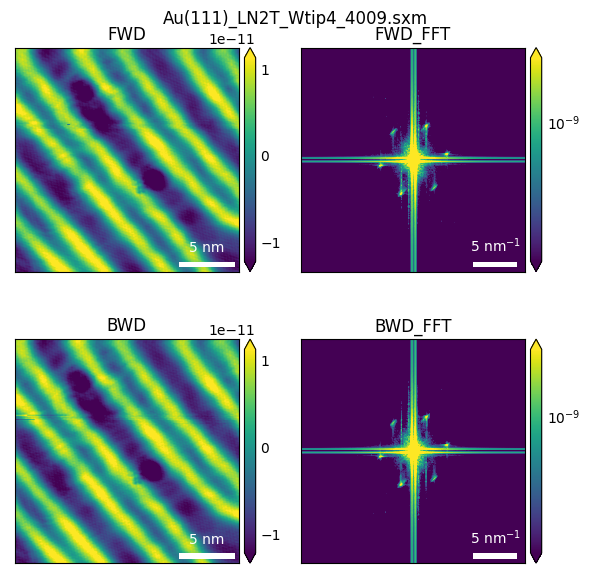

In [94]:
# scan data 의 x,y 가 1:1아닌이 경우 
scan_aspect_ratio = (size_x/dim_px)/(size_y/dim_py)
if scan_aspect_ratio == 1: 
    cbar_show = True
else:
    cbar_show = False


fig, axes = plt.subplots(2, 2, figsize = (6, 6))
axs =  axes.ravel()

im_z_fwd = isns.imshow(z_fwd_df_plane,
                       ax = axs[0],
                       cbar = cbar_show,
                       dx=step_dx*1E9,
                       units="nm",
                       robust = True)
axs[0].set_title('FWD')
axs[0].set_aspect(1/scan_aspect_ratio)
axs[0].grid('on')
    
im_z_fwd_fft = isns.imshow(z_fwd_df_plane_fft, 
                           ax = axs[1],
                           cbar = cbar_show,
                           dx=(1/size_x)*1E-9,  
                           units="1/nm",
                           dimension  = "si-reciprocal",
                           robust = True,
                           perc =  (90,99),
                           cbar_log=True)
axs[1].set_title('FWD_FFT')
axs[1].set_aspect(1/scan_aspect_ratio)
axs[1].grid('on')

im_z_bwd = isns.imshow(z_bwd_df_plane,
                       ax = axs[2], 
                       cbar = cbar_show,
                       dx=step_dx*1E9,            
                       units="nm",
                       robust = True)
axs[2].set_title('BWD')
axs[2].set_aspect(1/scan_aspect_ratio)
axs[2].grid('on')

im_z_bwd_fft = isns.imshow(z_bwd_df_plane_fft,
                           ax = axs[3], 
                           cbar = cbar_show,
                           dx=(1/size_x)*1E-9,  
                           units="1/nm",
                           dimension  = "si-reciprocal",
                           robust = True,
                           perc =  (90,99),
                           cbar_log=True)
axs[3].set_title('BWD_FFT')
axs[3].set_aspect(1/scan_aspect_ratio)
axs[3].grid('on')

    
if scan_aspect_ratio != 1: 
	fig.colorbar(im_z_fwd.get_children()[-2],  
				 fraction = 0.045, 
				 ax=axs[0]) #label='z_fwd', 
 
	fig.colorbar(im_z_fwd_fft.get_children()[-2],
				 fraction = 0.045, 
				 ax=axs[1]) # label='z_fwd_fft',
	fig.colorbar(im_z_bwd.get_children()[-2],  
				fraction = 0.045, 
				ax=axs[2]) #label='z_fwd', 
	fig.colorbar(im_z_bwd_fft.get_children()[-2],
				 fraction = 0.045, 
				 ax=axs[3]) # label='z_fwd_fft',
	# colorbar setting separately
plt.tight_layout()
fig.suptitle(Scan.fname)
plt.show()
isns.reset_defaults()



# convert to  Xarray (형식 지정)
* 단위를 다루고 plot 하는데 유리함. 
* dataframe 만큼의 자유도는 없다. 
    * PANDAS 와 유사함. 
    * check the API 
        http://xarray.pydata.org/en/stable/api.html
* xarray 마다 **coordinates** (index) type을 같게 유지 할것. 
    * 그렇지 않으면 **to_dataframe()** 사용할수 없다. 
    * fft 변환 한 후에는 별개의 xr data set으로 저장 

    *  z_fwd_df_plane 와 xarray converted data 가 row_y **flip**  
$\rightarrow$  isns figure setting : origin ="upper" 때문. 
$\rightarrow$  isns.imshow 에서 origin ="lower"로 지정 




In [105]:
###########################
# z, LIX 의 fwd, bwd 를 하나로 연결
###########################
# plane fit ( Y&X) 할것인가? 
###########################
plane_fit = True 

if plane_fit != True :
    z_LIX_fNb_df = pd.concat([z_fwd_df.stack(),
                              z_bwd_df.stack(),
                              LIX_fwd_df.stack(),
                              LIX_bwd_df.stack()], axis = 1)
else: 
    z_LIX_fNb_df = pd.concat([z_fwd_df_plane.stack(),
                              z_bwd_df_plane.stack(),
                              LIX_fwd_df_plane.stack(),
                              LIX_bwd_df_plane.stack()], axis = 1)

# stack 하는 과정에서 row_y level 이 먼저 stack 된다. 
# swaplevel로  stacking을  col_x 하는 편이 
#xr data 와 df data 의 dimension을 맞추기 쉽다. 


# df 의 colunm name 지정 
###########################
z_LIX_fNb_df.columns =['z_fwd_df','z_bwd_df', 'LIX_fwd_df','LIX_bwd_df']
z_LIX_fNb_df
# 주의 plane fit 하기 전임. 

############################
# xarray 를 도입 
############################
z_LIX_fNb_xr = z_LIX_fNb_df.to_xarray()
# coord 이름 X, Y 로바꿈
z_LIX_fNb_xr = z_LIX_fNb_xr.rename(
    {"row_y": "Y", "col_x":"X"})
# XY 를 실제 크기로 바꿈 
z_LIX_fNb_xr= z_LIX_fNb_xr.assign_coords(
    X = z_LIX_fNb_xr.X.values *step_dx, 
    Y = z_LIX_fNb_xr.Y.values *step_dy )
##################################
# df 의 경우와  xr  경우 방향이 달라보인다면
#  ==> isns. origin="lower" issue
##################################

z_LIX_fNb_xr
# data channel 고르는 법 
z_LIX_fNb_xr.z_fwd_df
# data channel 정보 확인 
z_LIX_fNb_xr.data_vars
# data channel 값 확인 
z_LIX_fNb_xr.z_fwd_df.values 
# data channel dimension확인 (coords) 
z_LIX_fNb_xr.dims
# data  channel의 좌표계 확인 
z_LIX_fNb_xr.coords
z_LIX_fNb_xr.attrs['X_spacing']= step_dx
z_LIX_fNb_xr.attrs['Y_spacing']= step_dy
z_LIX_fNb_xr.attrs['freq_X_spacing']= 1/step_dx
z_LIX_fNb_xr.attrs['freq_Y_spacing']= 1/step_dy

# data filtering functions 
### z_LIX_fNB_xr_prcssd
### filters applied to xr dataset 

* gaussain filtering 
    * eg) z_LIX_fNb_xr_gaussian = **xr_gaussian_filter**(z_LIX_fNb_xr, sigma = 3)

* median filtering 
    * eg)z_LIX_fNb_xr_median = **xr_median_filter**(z_LIX_fNb_xr)
* soble filtering 
    * eg) z_LIX_fNb_xr_sobel = **xr_sobel_filter**(z_LIX_fNb_xr)
* unsharp_mask filtering 
    * eg) z_LIX_fNb_xr_unsharp_mask = **xr_unsharp_mask_filter**(z_LIX_fNb_xr)

* difference_of_gaussian filtering 
    (similar to band pass filter) 
    * eg) z_LIX_fNb_xr_difference_of_gaussians =  **xr_difference_of_gaussians_filter**(z_LIX_fNb_xr,low_sigma = 1, high_sigma = 20)

In [106]:
##############################################################
# gaussian filtering 
##############################################################
def xr_gaussian_filter (xrdata,sigma=1):
    xrdata_prcssd=xrdata.copy()
    #새로운 data가 들어갈곳 지정
    xrdata_df = xrdata.to_dataframe()
    #원본데이터를 dataframe으로  변환하여 np로 skimage 처리
    for ch_name in  xrdata_df:
        xrdata_df_procss = pd.DataFrame(
            skimage.filters.gaussian(
                xrdata_df[ch_name].unstack().T,
                sigma=sigma)).stack()
        #마지막에 transpose안하면 ry,cx 형태로 나옴. 주의.
        xrdata_df_procss.index  = xrdata_df.index
        xrdata_prcssd[ch_name+'_gaussian'] = xrdata_df_procss.unstack()
    return xrdata_prcssd
############################
# Test 
#z_LIX_fNb_xr_gaussian = xr_gaussian_filter(z_LIX_fNb_xr, sigma = 12)
#isns.imshow(z_LIX_fNb_xr_gaussian.z_fwd_df_gauss, origin = "lower")
###############################

##############################################################
# median filtering 
##############################################################
def xr_median_filter (xrdata,sigma=1):
    xrdata_prcssd = xrdata.copy()
    #새로운 data가 들어갈곳 지정
    xrdata_df = xrdata.to_dataframe()
    #원본데이터를 dataframe으로  변환하여 np로 skimage 처리
    for ch_name in  xrdata_df:
        xrdata_df_procss = pd.DataFrame(
            skimage.filters.median(
                xrdata[ch_name].unstack())).stack()
        xrdata_df_procss.index  = xrdata_df.index
        xrdata_prcssd[ch_name+'_median'] = xrdata_df_procss.unstack()
    return xrdata_prcssd
############################
# Test 
#z_LIX_fNb_xr_median = xr_median_filter(z_LIX_fNb_xr)
#isns.imshow(z_LIX_fNb_xr_median.z_fwd_df_median, origin = "lower")
###############################

##############################################################
# sobel filtering 
##############################################################
def xr_sobel_filter (xrdata):
    xrdata_prcssd = xrdata.copy()
    #새로운 data가 들어갈곳 지정
    xrdata_df = xrdata.to_dataframe()
    #원본데이터를 dataframe으로  변환하여 np로 skimage 처리
    for ch_name in  xrdata_df:
        xrdata_df_procss = pd.DataFrame(
            skimage.filters.sobel(
                xrdata[ch_name].unstack())).stack()
        xrdata_df_procss.index  = xrdata_df.index
        xrdata_prcssd[ch_name+'_sobel'] = xrdata_df_procss.unstack()
    return xrdata_prcssd
############################
# Test 
#z_LIX_fNb_xr_sobel = xr_sobel_filter(z_LIX_fNb_xr)
#isns.imshow(z_LIX_fNb_xr_sobel.z_fwd_df_sobel, origin = "lower")
###############################

##############################################################
# unsharp_mask filtering 
##############################################################
def xr_unsharp_mask_filter (xrdata):
    xrdata_prcssd = xrdata.copy()
    #새로운 data가 들어갈곳 지정
    xrdata_df = xrdata.to_dataframe()
    #원본데이터를 dataframe으로  변환하여 np로 skimage 처리
    for ch_name in  xrdata_df:
        xrdata_df_procss = pd.DataFrame(
            skimage.filters.unsharp_mask(
                xrdata[ch_name].unstack())).stack()
        xrdata_df_procss.index  = xrdata_df.index
        xrdata_prcssd[ch_name+'_unsharp_mask'] = xrdata_df_procss.unstack()
    return xrdata_prcssd
############################
# Test 
#z_LIX_fNb_xr_unsharp_mask = xr_unsharp_mask_filter(z_LIX_fNb_xr)
#isns.imshow(z_LIX_fNb_xr_unsharp_mask.z_fwd_df_unsharp_mask, origin = "lower")
###############################


# difference_of_gaussians filtering 
def xr_difference_of_gaussians_filter (xrdata,low_sigma=5,high_sigma=12):
    xrdata_prcssd = xrdata.copy()
    #새로운 data가 들어갈곳 지정
    xrdata_df = xrdata.to_dataframe()
    #원본데이터를 dataframe으로  변환하여 np로 skimage 처리
    for ch_name in  xrdata_df:
        xrdata_df_procss = pd.DataFrame(
            skimage.filters.difference_of_gaussians(
                xrdata[ch_name].unstack(),
                low_sigma = low_sigma,
                high_sigma = 12 )).stack()
        xrdata_df_procss.index  = xrdata_df.index
        xrdata_prcssd[ch_name+'_difference_of_gaussians'] = \
        xrdata_df_procss.unstack()
    return xrdata_prcssd
############################
# Test 
#z_LIX_fNb_xr_difference_of_gaussians =\
# xr_difference_of_gaussians_filter(z_LIX_fNb_xr,low_sigma = 1, high_sigma = 20)
#isns.imshow(
#    z_LIX_fNb_xr_difference_of_gaussians.z_fwd_df_difference_of_gaussians,
#     origin = "lower")
###############################
'''
from skimage.filters import butterworth
##############################################################
# butterworth filtering 
##############################################################
def xr_butterworth_filter (xrdata,cutoff_frequency_ratio=0.005, high_pass=True):
    xrdata_prcssd = xrdata.copy()
    #새로운 data가 들어갈곳 지정
    xrdata_df = xrdata.to_dataframe()
    #원본데이터를 dataframe으로  변환하여 np로 skimage 처리
    for ch_name in  xrdata_df:        
        xrdata_df_procss = pd.DataFrame(
            skimage.filters.butterworth(
                xrdata[ch_name].unstack(), 
                cutoff_frequency_ratio = cutoff_frequency_ratio, 
                high_pass = high_pass)).stack()
        xrdata_df_procss.index  = xrdata_df.index
        xrdata_prcssd[ch_name+'_butterworth'] = xrdata_df_procss.unstack()
    return xrdata_prcssd
############################
# Test 
z_LIX_fNb_xr_butterworthk = xr_butterworth_filter(z_LIX_fNb_xr)
isns.imshow(z_LIX_fNb_xr_butterworth.z_fwd_df_butterworth, origin = "lower")
###############################
'''

'\nfrom skimage.filters import butterworth\n##############################################################\n# butterworth filtering \n##############################################################\ndef xr_butterworth_filter (xrdata,cutoff_frequency_ratio=0.005, high_pass=True):\n    xrdata_prcssd = xrdata.copy()\n    #새로운 data가 들어갈곳 지정\n    xrdata_df = xrdata.to_dataframe()\n    #원본데이터를 dataframe으로  변환하여 np로 skimage 처리\n    for ch_name in  xrdata_df:        \n        xrdata_df_procss = pd.DataFrame(\n            skimage.filters.butterworth(\n                xrdata[ch_name].unstack(), \n                cutoff_frequency_ratio = cutoff_frequency_ratio, \n                high_pass = high_pass)).stack()\n        xrdata_df_procss.index  = xrdata_df.index\n        xrdata_prcssd[ch_name+\'_butterworth\'] = xrdata_df_procss.unstack()\n    return xrdata_prcssd\n############################\n# Test \nz_LIX_fNb_xr_butterworthk = xr_butterworth_filter(z_LIX_fNb_xr)\nisns.imshow(z_LIX_fNb_xr_butterw

* In order to use rank filters (dtype : unit8)
    * new function : image_to_grayscale

* data float32 $\rightarrow$ (int16$\rightarrow$autolevel)$\rightarrow$unit8


In [118]:
#############################################
# xr data set change to gray scale (0~255)
#############################################

def xrdata_to_grayscale (xrdata): 
    xrdata_prcssd = xrdata.copy()
    #새로운 data가 들어갈곳 지정
    xrdata_df = xrdata.to_dataframe()
    #원본데이터를 dataframe으로  변환하여 np로 skimage 처리
    for ch_name in  xrdata_df:
        xrdata_df_procss = pd.DataFrame(
            skimage.img_as_ubyte(
                skimage.exposure.rescale_intensity(
                    xrdata_df[ch_name].unstack().to_numpy().T
                    )*0.5+0.5
                    )
        ).stack()
        xrdata_df_procss.index  = xrdata_df.index
        xrdata_prcssd[ch_name] = xrdata_df_procss.unstack()
    return xrdata_prcssd
#############################################
# test example
#z_LIX_fNb_xr_gs = xrdata_to_grayscale(z_LIX_fNb_xr)
#isns.imshow(z_LIX_fNb_xr.z_fwd_df,
#    origin = "lower")
############################################
# now we can do the skimage.rank.filters 
###########################################
#
###########################################
#  apply mean rank.mean to xr_gs
############################################
def xrdata_gs_mean (xrdata_gs,disk_radious=10): 
    xrdata_gs_prcssd = xrdata_gs.copy()
    #새로운 data가 들어갈곳 지정
    xrdata_gs_df = xrdata_gs.to_dataframe()
    #원본데이터를 dataframe으로  변환하여 np로 skimage 처리
    for ch_name in  xrdata_gs_df:
        xrdata_df_procss = pd.DataFrame(
            skimage.filters.rank.mean(
                xrdata_gs_df[ch_name].unstack().to_numpy(),
                disk(disk_radious)
                )
            ).stack()
        xrdata_df_procss.index  = xrdata_gs_df.index
        #print (xrdata_df_procss.unstack())
        xrdata_gs_prcssd[ch_name] = xrdata_df_procss.unstack()
    return xrdata_gs_prcssd
#############################################



/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.w

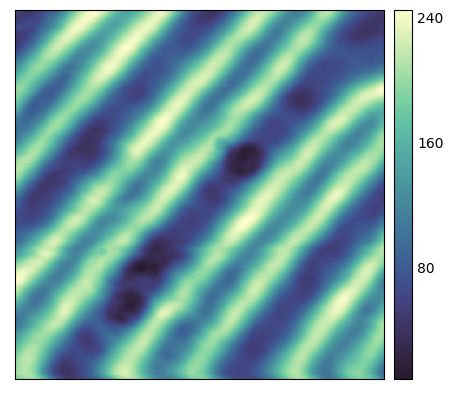

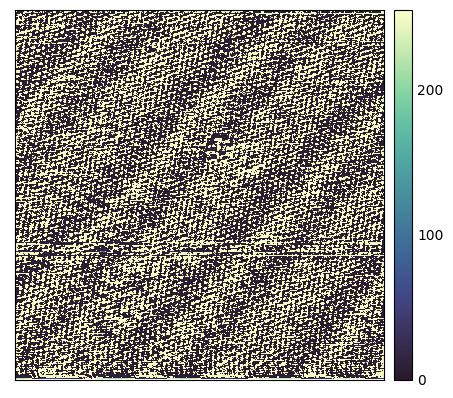

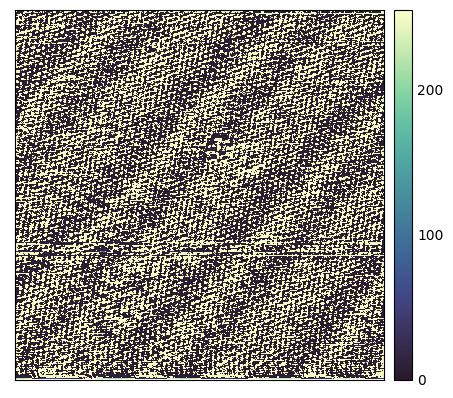

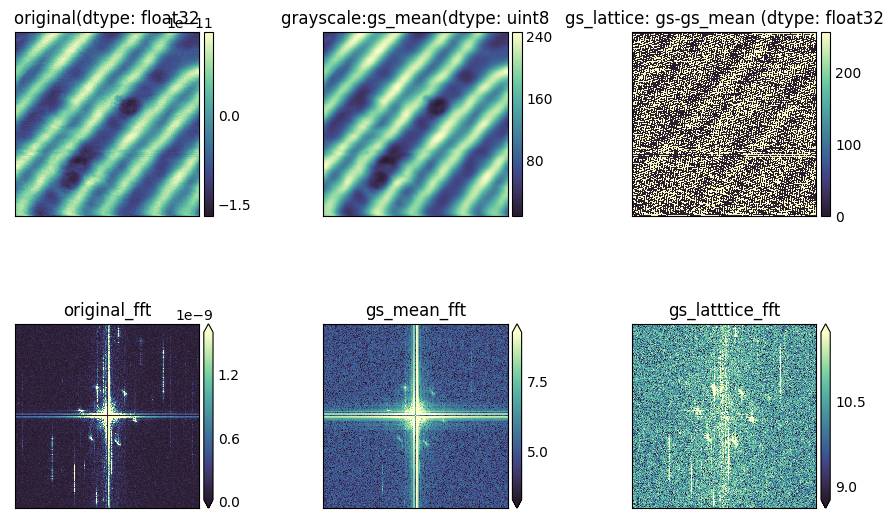

In [142]:

############################################
# mean test 
z_LIX_fNb_xr_gs_mean = xrdata_gs_mean(z_LIX_fNb_xr_gs,5)
isns.imshow(z_LIX_fNb_xr_gs_mean.z_fwd_df,
    origin = "lower")

###########################################
# subtract_mean 
###########################################
z_LIX_fNb_xr_gs_lattice = z_LIX_fNb_xr_gs -  z_LIX_fNb_xr_gs_mean
isns.imshow(z_LIX_fNb_xr_gs_lattice.z_fwd_df,
    origin = "lower")
# subtract_mean + gaussian 
z_LIX_fNb_xr_gs_lattice_g = xr_gaussian_filter(z_LIX_fNb_xr_gs_lattice)
isns.imshow(z_LIX_fNb_xr_gs_lattice_g.z_fwd_df,
    origin = "lower")
# subtract_mean + gaussian + fft
z_LIX_fNb_xr_gs_lattice_g_fft = two_d_fft_xr(z_LIX_fNb_xr_gs_lattice_g)
z_LIX_fNb_xr_gs_lattice_fft = two_d_fft_xr(z_LIX_fNb_xr_gs_lattice)


# original FFT 
z_LIX_fNb_xr_fft =  two_d_fft_xr(z_LIX_fNb_xr)
# gs_mean FFT 
z_LIX_fNb_xr_gs_mean_fft =  two_d_fft_xr(z_LIX_fNb_xr_gs_mean)

fig,axes =  plt.subplots(2,3, figsize = (9,6))
axs =  axes.ravel()
isns.set_image(origin='lower')
axs[0].set_title("original(dtype: float32")
isns.imshow(z_LIX_fNb_xr.z_fwd_df,ax = axs[0])
axs[1].set_title("grayscale:gs_mean(dtype: uint8")
isns.imshow(z_LIX_fNb_xr_gs_mean.z_fwd_df,ax = axs[1])
axs[2].set_title("gs_lattice: gs-gs_mean (dtype: float32")
isns.imshow(z_LIX_fNb_xr_gs_lattice.z_fwd_df,ax = axs[2])
axs[3].set_title("original_fft")
isns.imshow(z_LIX_fNb_xr_fft.z_fwd_df_fft,ax = axs[3],robust = True)
axs[4].set_title("gs_mean_fft")
isns.imshow(z_LIX_fNb_xr_gs_mean_fft.z_fwd_df_fft,ax = axs[4],robust = True)
axs[5].set_title("gs_latttice_fft")
isns.imshow(z_LIX_fNb_xr_gs_lattice_fft.z_fwd_df_fft,ax = axs[5],robust = True)
plt.tight_layout()
plt.show()


# Addtional JW's Functions  for figures (based on xr, xrft...)

## Xarrary data set (real-space or k-space) 
* after xrft fft 
    * channel number trimming  
    * default setting : ncols = 2, figsize =  (5,5), fig.suptitle  position=(0.5, 1.0+0.05) 
    * aspect ratio issue solved (color bar detach) 
* if fft results ( real only ) channel ends with _fft 
    * unit calc - preset ( nm or 1/nm) 


> ### isns ==> image origin adjust 
> **origin = "lower"** 
> * isns.imshow(z_LIX_fNb_xr.z_fwd_df,origin = "upper") # default
> * isns.imshow(z_LIX_fNb_xr.z_fwd_df,origin = "lower")


## New Functions (by JWP)
###  real space (r) XR data set plot
`def xr_data_set_isns_plot_r_space(xr_data, ncols = 2, figsize = (5,5)): `
$\rightarrow$ 
`return plt.show()`
  
>* (e.g.) xr_data_set_isns_plot_r_space(z_LIX_fNb_xr)
### momentum(k) space XR data set plot
`def xr_data_set_isns_plot_k_space(xr_data_fft, ncols = 4, figsize =  (8,4)): `
$\rightarrow$ 
`return plt.show()`
>*(e.g.) xr_data_set_isns_plot_k_space(z_LIX_fNb_xr_fft)


### FFT xr data set
`def two_d_fft_xr (xr_data):`
$\rightarrow$
`   return xr_data_after_fft`  
>*(e.g.) z_LIX_fNb_xr_fft = two_d_fft_xr (z_LIX_fNb_xr)


## Additional functions for better analysis. 
* gaussian filters 
* band pass filters 
* before & after fft 
* xr data set --> dataframe --> treatments --> dataframe 


In [124]:
#불러온 파일이름 확인 및 실험 조건 check 
# sxm_files_in_groups[0][0]
# image_title

##############################\
# Xarray (xr) data set isns로 그리기
# real space 와 fft의 경우에 맞춰서 
# 함수 작성 
###############\###############\
# len(z_LIX_fNb_xr_intrp.data_vars)
# xr data의 갯수 확인
 
#######################
# figure 에서 쓸 axs trime 함수 ,
#######################
# data set 갯수에 따라서 필요없는 axs 지운다. 
def trim_axs(axs, N):
    """
    Reduce *axs* to *N* Axes. All further Axes are removed from the figure.
    """
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

#######################
def xr_data_set_isns_plot_r_space(xr_data, 
                                  ncols = 2,
                                  figsize = (5,5)): 
    """ 
    # xarray data 받아서 ncol 갯수 만큼 줄지어서 그린다. 
    # isns사용 . 'nm' unit, 
    """
    # aspect ratio check 
    # scan data 의 x,y 가 1:1아닌이 경우 
    scan_aspect_ratio = (size_x/dim_px)/(size_y/dim_py)
    if scan_aspect_ratio == 1: 
        cbar_show = True
    else:
        cbar_show = False


    # image의 col 수를 정하고 
    fig,axes = plt.subplots(ncols = ncols,
                            nrows = len(xr_data.data_vars)//ncols+1,
                            figsize = figsize)
    axs = axes.ravel()
    axs = trim_axs(axs, len(xr_data.data_vars))
    # peak 수에 따라서 trime 먼저 

    #이제 하나씩 그려서 axs에 채운다. 

    for i,i_channels in enumerate(xr_data):
        isns_channels= i_channels+'isns'
        print(isns_channels)
        isns_channels = isns.imshow(xr_data[i_channels],
                                    origin = "lower", 
                                    ax =  axs[i],
                                    cbar = cbar_show,
                                    dx = step_dx*1E9,
                                    units = "nm",
                                    robust = True)
        axs[i].set_title(i_channels, loc='left', fontsize = 'small')
        #################################
        if scan_aspect_ratio != 1: 
                fig.colorbar(isns_channels.get_children()[-2],  
                            fraction = 0.045, 
                            ax = axs[i])  
        ################################
        # colorbar setting separately
        # 나중에 다시 check 해야함. 
        ############################## 
        #그림 그릴때 xy limit setting 
        x_lower_limit = xr_data.X.argmin()
        x_upper_limit = xr_data.X.argmax()
        y_lower_limit = xr_data.Y.argmin()
        y_upper_limit = xr_data.Y.argmax()
        

        axs[i].set_xlim([x_lower_limit,x_upper_limit])
        axs[i].set_ylim([y_lower_limit,y_upper_limit])


    # 4channel 2x2 
    fig.suptitle(image_title, fontsize = 'small', position=(0.5, 1.0+0.05) )
    fig.tight_layout()
    isns.reset_defaults()
    return plt.show()

# xr_data_set_isns_plot_r_space(z_LIX_fNb_xr_intrp)
# test 완료 
####################################################################
# 다만, set_xlimit, set_ylimit 을  재정비 
# 
#####################################################################

#####################
# xr 을 위한 fft 함수 지정 
#####################
# 입력은 xr data 
# 출력은 fft 한 xr data 
def two_d_fft_xr (xr_data):
    # 먼저 하나 copy 해두고 
    xr_data_after_fft = xr_data.copy()
    # form 문으로 channel 하나씩 fft 
    for ch_map in xr_data:
        xr_data_after_fft[ch_map+'_fft'] = np.log(
            np.abs(xrft.fft(xr_data[ch_map],
                            true_phase=True,
                            true_amplitude=False))+1)
    # 현재의 상황이 정상적인 2D fft
    # 'true_phase=True,true_amplitude=False'
    # 일단 true amplitude 를 false로 해야 log scale이 작동 
    # 그리리고 true phase 를 true 로 하면 2D fft가 맞게 나온다. 
    
    #########################    
    xr_data_after_fft= xr_data_after_fft.drop_dims(["X", "Y"])
    # dimension 가운데 " X","Y" 를 가진 것들은 모두 지운다. 
    return xr_data_after_fft


#####################################################################
#####################################################################
def xr_data_set_isns_plot_k_space(xr_data,
                                  ncols = 4, 
                                  figsize =  (8,4)): 
    """ 
    # xarray data 받아서 ncol 갯수 만큼 줄지어서 그린다. 
    # isns사용 . 'nm' unit, 
    """
    # aspect ratio check 
    # scan data 의 x,y 가 1:1아닌이 경우 
    scan_aspect_ratio = (size_x/dim_px)/(size_y/dim_py)
    if scan_aspect_ratio == 1: 
        cbar_show = True
    else:
        cbar_show = False

    # image의 col 수를 정하고 
    fig,axes = plt.subplots(ncols = ncols,
                            nrows = len(xr_data.data_vars)//ncols+1,
                            figsize = figsize)
    axs = axes.ravel()
    axs = trim_axs(axs, len(xr_data.data_vars))
    # peak 수에 따라서 trime 먼저 

    #이제 하나씩 그려서 axs에 채운다. 

    for i,i_channels in enumerate(xr_data):
        isns_channels= i_channels+'isns'
        if i_channels.endswith('fft'): # fft에 해당하는 channel만
            dx=(1/size_x)*1E-9
            units="1/nm"
            dimension  = "si-reciprocal"
        else : 
            dx=step_dx*1E9
            units="nm"
            dimension  = "si"

        print(isns_channels)
        isns_channels = isns.imshow(xr_data[i_channels],
                                    origin = "lower",
                                    ax =  axs[i],
                                    cbar = cbar_show,
                                    dx = dx,
                                    units= units,
                                    dimension = dimension,
                                    robust = True)
        axs[i].set_title(i_channels, loc='left', fontsize = 'small')
        #################################
        if scan_aspect_ratio != 1: 
            fig.colorbar(isns_channels.get_children()[-2],  
                        fraction = 0.045, 
                        ax=axs[i])  
        ################################
        # colorbar setting separately
        # 나중에 다시 check 해야함. 
        ################################

    # Xarray Data set isns-plot 함수 만들기 
    # 4channel 2x2 
    # xr data 는  real-space와 fft를 구 분하기로 했지만, 
    # 함께 그릴필요가 있을때를 위해서 남겨둠. 
    fig.suptitle(image_title+'(2D FFT)',
                 fontsize = 'small',
                 position=(0.5, 1.0+0.05) )
    fig.tight_layout()
    isns.reset_defaults()
    return plt.show()




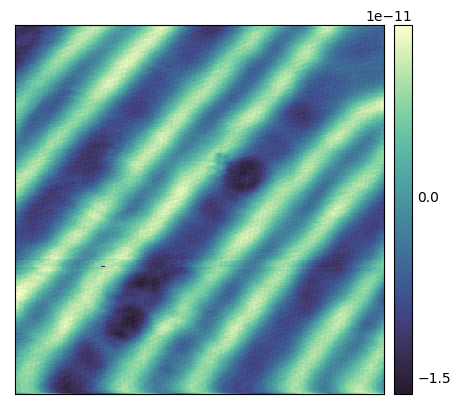

In [125]:
################
# filter test 
###################

z_LIX_fNb_xr_gaussian = xr_gaussian_filter( z_LIX_fNb_xr,60)
#z_LIX_fNb_xr_difference_of_gaussian  = xr_difference_of_gaussians_filter(z_LIX_fNb_xr,
#                                                                         low_sigma = 1,
#                                                                          high_sigma = 20) 
# modulation without atomic resolution 
#isns.imshow(z_LIX_fNb_xr_gaussian.z_fwd_df_gaussian, origin = "lower")              

isns.imshow(z_LIX_fNb_xr.z_fwd_df - z_LIX_fNb_xr_gaussian.z_fwd_df_gaussian, origin = "lower")

#z_LIX_fNb_xr['atomic_lattice'] = 
#z_LIX_fNb_xr_fft = two_d_fft_xr(z_LIX_fNb_xr)
# gaussian_difference filter를 사용해서 atomic resolutin 보다 큰 modulation 찾아내서 
# 원본 값에다 뺀다. 

#isns.imshow(z_LIX_fNb_xr.atomic_lattice, origin = "lower")

# modulation without atomic resolution 
#isns.imshow(z_LIX_fNb_xr_gaussian_difference_of_gaussian_fft.z_fwd_df_difference_of_gaussians_fft, origin = "lower")                

/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")


z_fwd_dfisns
z_bwd_dfisns
LIX_fwd_dfisns
LIX_bwd_dfisns


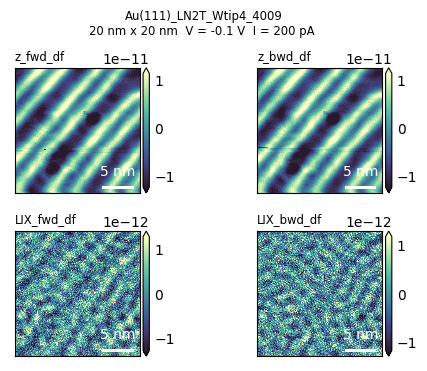

z_fwd_df_fftisns
z_bwd_df_fftisns
LIX_fwd_df_fftisns
LIX_bwd_df_fftisns


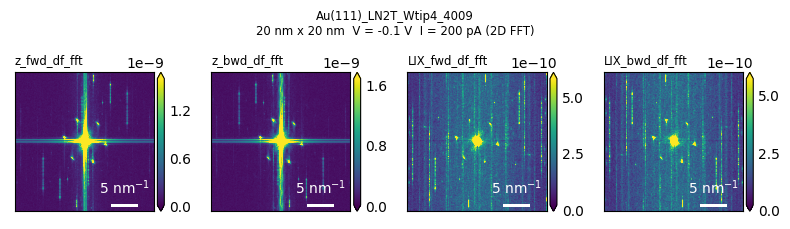

In [126]:
#########################
# xrft fft  fNb
#########################
# original fNb
z_LIX_fNb_xr_fft = two_d_fft_xr(z_LIX_fNb_xr)

####################################################
#    plot test 
#####################################################    

#########original data set plot
xr_data_set_isns_plot_r_space(z_LIX_fNb_xr)
#########original data set fft plot
xr_data_set_isns_plot_k_space(z_LIX_fNb_xr_fft)


z_fwd_dfisns
z_bwd_dfisns
LIX_fwd_dfisns
LIX_bwd_dfisns
z_fwd_df_gaussianisns
z_bwd_df_gaussianisns
LIX_fwd_df_gaussianisns
LIX_bwd_df_gaussianisns


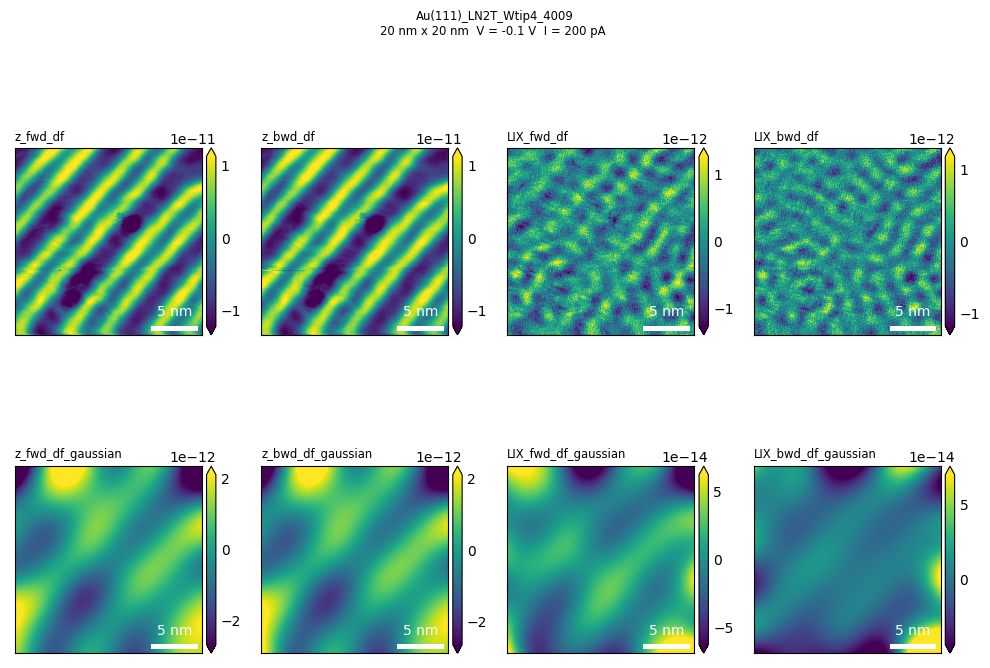

z_fwd_df_fftisns
z_bwd_df_fftisns
LIX_fwd_df_fftisns
LIX_bwd_df_fftisns
z_fwd_df_fft_unsharp_maskisns
z_bwd_df_fft_unsharp_maskisns
LIX_fwd_df_fft_unsharp_maskisns
LIX_bwd_df_fft_unsharp_maskisns


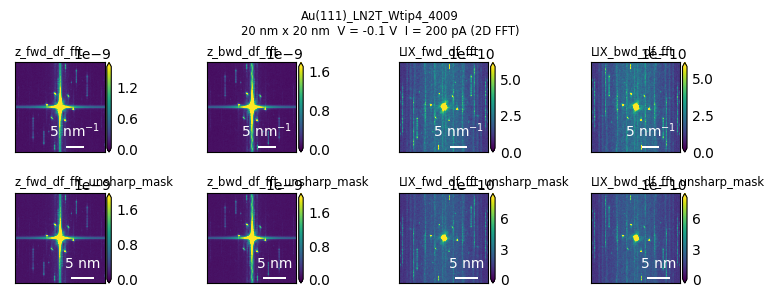

In [128]:
xr_data_set_isns_plot_r_space(
    z_LIX_fNb_xr_gaussian,ncols = 4, figsize = (10,10))

# 앞서 만든 함수들의 결과를 그려보는 test 
z_LIX_fNb_xr_fft_unsharp_mask = xr_unsharp_mask_filter(z_LIX_fNb_xr_fft)

xr_data_set_isns_plot_k_space(z_LIX_fNb_xr_fft_unsharp_mask)

# Reference for FFT & Affine
* reference spot **HOPG**  a0  = 0.246nm
* 
in k-space(3fold symmetry) $\rightarrow$ 3 points (0,0),$\frac{1}{a_{0}} \times  ( \sin \pi/3 , \cos \pi/3 )$, $\frac{1}{a_{0}}  \times  ( \sin 2\pi/3 , \cos 2\pi/3 )$

## 2D FFT results & ref (3fold symmetry) 6 points
* 'xr_input_fft' =  xr_data, fft input 
* ref points : marking circle (red)
* measured local max : marking circle (white circles)
* 6 local peaks : marking circle (blue)



## New functions (by JWP)
## find 6 peaks from fft xr data 
>* (e.g.) 측정된 6개(p6),ref_a0 로부터 계산(r6) 
>* 찾은 p6, r6 를 기반으로 fft plot 
### plot p6&r6 with fft result 
* combination as one funciton 

    **"xr_input_fft_plot_p6r6"**

* input : fft xr data &ref_a0 
* output : p6 & r6 points + plot figure 

### plot p6&r6 with fft result 
* RED : reference 6 spot 
* White circles : find local peaks (upper 20%p amplitude)
* Blue : reference 6 spot ( nearest 6 local peaks w.r.t. reference 6 points)

`def xr_input_fft_plot_p6r6(xr_data_fft,
                           ref_lattice_a0 = 0.246E-9,
                           zoom_in_fft = True, 
                           zoom_in_expand=3):`

$\rightarrow$
`return  peak6points_kspace_idxs, ref6points_kspace_idxs`
> * fft 결과+  ref_a0 를 input으로 받고 
> * 값과 그림을 출력 ( 다만 그림을 return하진 않음) 
> * 그림을 나중에 수정하려면 figure 를 return해야함.





z_fwd_df_fft
[180 269]
[332 243]
[227 334]
[285 178]
[262 251]
[250 261]
[301 321]
[211 191]
[164  50]
[348 462]
[410 430]
[102  82]
[102 190]
[410 322]
[348 413]
[164  99]
[152 347]
[360 165]
[103 283]
[409 229]
[437 152]
[ 75 360]
[391  86]
[121 426]
[467 448]
[45 64]
[1, 6, 2, 0, 7, 3]
z_bwd_df_fft
[180 269]
[332 243]
[228 333]
[284 179]
[262 251]
[250 261]
[301 321]
[211 191]
[164 462]
[348  50]
[348  99]
[164 413]
[410 191]
[102 321]
[102 430]
[410  82]
[361 166]
[151 346]
[381 304]
[131 208]
[134  40]
[ 62 215]
[450 297]
[1, 6, 2, 0, 7, 3]
LIX_fwd_df_fft
[180 269]
[332 243]
[228 333]
[284 179]
[409 322]
[103 190]
[410 430]
[102  82]
[207 195]
[305 317]
[362 314]
[150 198]
[430 230]
[ 82 282]
[396 170]
[116 342]
[192 117]
[320 395]
[307  53]
[205 459]
[256 256]
[362 384]
[150 128]
[361  95]
[151 417]
[466  95]
[ 46 417]
[422  76]
[ 90 436]
[1, 9, 2, 0, 8, 3]
LIX_bwd_df_fft
[332 243]
[180 269]
[228 333]
[284 179]
[102 321]
[410 191]
[410  82]
[102 430]
[303 319]
[209 193]
[362 198]

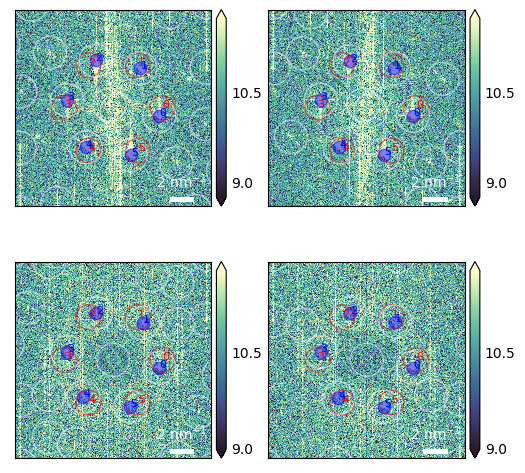

6 reference spots(dst)
[[337.3  256.  ]
 [296.65 326.41]
 [215.35 326.41]
 [174.7  256.  ]
 [215.35 185.59]
 [296.65 185.59]]
6 measured peaks(src)
[[[332. 243.]
  [301. 321.]
  [227. 334.]
  [180. 269.]
  [211. 191.]
  [285. 178.]]

 [[332. 243.]
  [301. 321.]
  [228. 333.]
  [180. 269.]
  [211. 191.]
  [284. 179.]]

 [[332. 243.]
  [305. 317.]
  [228. 333.]
  [180. 269.]
  [207. 195.]
  [284. 179.]]

 [[332. 243.]
  [303. 319.]
  [228. 333.]
  [180. 269.]
  [209. 193.]
  [284. 179.]]]


In [149]:
##################################################################
# xr_data_fft + ref_a0 를 input으로 
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
# return #  peak6points_kspace_idxs, ref_6points_kspace_idxs
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
#################################



def xr_input_fft_plot_p6r6(xr_data_fft,
                           ref_lattice_a0 = 0.246E-9,
                           zoom_in_fft = True, 
                           zoom_in_expand = 3):
    # zoom_in_fft 로 center 영역 확대가능 
    # expand 크기는 조절가능
    # 대상xr_data_fft  와  ref_a0를 input으로
    
    #~~~~~~#
    # ref_lattice_a0 (input 을 바탕으로 ref_6pts 계산)
    ref_lattice_a0 = ref_lattice_a0
    ref_lattice_k0 = 1/(ref_lattice_a0) # kspace atomic lattice_k0
    ref_6pts  = ref_lattice_k0 * np.array([[math.cos(pt_i* math.pi/3), 
                                   math.sin(pt_i* math.pi/3)]
                       for pt_i in range(6)])
    # ref_6pts 는 x,y 형태로 쓴다.
    # a0 로 부터 기본 k0 와 point list 추출 
    ref_6points_kspace_x =  (ref_6pts[:,0] 
                            - xr_data_fft.freq_X.values[0]
                            )/xr_data_fft.freq_X.spacing
    # 
    ref_6points_kspace_y =  (ref_6pts[:,1] 
                            - xr_data_fft.freq_Y.values[0]
                            )/xr_data_fft.freq_Y.spacing
    ref_6p_radious = ref_lattice_k0/xr_data_fft.freq_X.spacing
    #skimage.draw.disk 사용을위해 정수로 된 center_indx 필요함, np로 저장. 
    ref_6points_kspace_idxs = np.array([[round(x,2),round(y,2)]
            for x, y  in zip(ref_6points_kspace_x, ref_6points_kspace_y) ])
    # list comprehention x,y 에서 하나씩 뽑아서 소수점2째자리까지
    #print(ref_6points_kspace_idxs)
    # ref_6points_kspace_idxs 는 x,y format
    #~~~~~~~~~~~~~~~~~~~~~~~~~#
    # measured 6 point 를 찾는다. 
    peak_6points_kspace_idxs = np.array(
    [np.zeros_like(ref_6points_kspace_idxs) 
    for i in range (len(xr_data_fft))])
    # peak list가 들어갈 자리 먼저 지정     
   
    # ref6points_kspace_idxs : ref_a0 로 부터 3fold symmetry point찾음
    # peak6points_kspace_idxs : 각각의 image  channel에서 측정된 값 
    # ref point 는 (6,2) 
    # local peaks 는 (N, 6, 2) dimension 
    # 
   

    fig,axes = plt.subplots(2,2, figsize = (6,6))
    axs = axes.ravel()
    for i,ch_map in enumerate (xr_data_fft):
        isns_channel = ch_map+'isns'
        print(ch_map)    
        #isns_channel = z_LIX_fNb_xr_fft[ch_map].plot.imshow(ax =axs[i],robust = False)
        # 이유는 알수 없으나 xr의 기본 plot를 사용하면 circle add가 안된다. 
        isns_channel = isns.imshow(xr_data_fft[ch_map],
                                   origin = "lower", 
                                   ax = axs[i],
                                   dx = xr_data_fft.freq_X.spacing*1E-9,
                                   units= "1/nm",
                                   dimension = "si-reciprocal",
                                   robust = True)
        axs[i].set_aspect(1)
        # xr.plot.imshow로 그리면 aspect ratio다시 수정 필요함
        #################################
        # Red circle for peak positions  plot
        #################################
        for r_i, ref_6points_kspace_idx in  enumerate(ref_6points_kspace_idxs):
            ref_circles = Circle(tuple(ref_6points_kspace_idx), # center x,yidxs
                                    ref_6p_radious/4, # radius
                                    facecolor = 'none', 
                                    edgecolor = 'red',
                                    linewidth = 1,
                                    alpha = 0.5)
            axs[i].annotate(str(r_i),
                            tuple(ref_6points_kspace_idx),
                            color='r',
                            size =8) #번호넣기
            axs[i].add_patch(ref_circles)
            # circle 에 x,y 를 입력할때 xy 순서임
            #  (x, y) 인 ref_6points_kspace_idx 를 확인
        #################################
        # white circles for local peaks
        # find local peaks (it could be any number)
        #################################
        local_peaks_in_ch_rycx = skimage.feature.peak_local_max(
            gaussian_filter(
                xr_data_fft[ch_map].values, sigma=1
                ),
                min_distance=int(ref_6p_radious/2),
                threshold_rel = 0.2 )
            # channel image 별로loca peak 가운데 상위 20 % 찾음.
            # local_peaks_in_ch 결과는 peak_local_max  에서 ry,cx로 나온다
        local_peaks_in_ch = local_peaks_in_ch_rycx[:,::-1]
        # refpoint 처럼  cx,ry 순서로 바꿔준다. 

        #################
        for local_peak in  local_peaks_in_ch:
            print(local_peak)
            peak_bumps = Circle(tuple(local_peak),
                                ref_6p_radious/3, # radius
                                facecolor = 'none', 
                                edgecolor = 'white',
                                linewidth = 1,
                                alpha = 0.5) 
            axs[i].add_patch(peak_bumps)
            # circle 에 x,y 를 입력할때   local_peak은 ry, cx 순서임을확인
            # white circle을 그린다. 
        ''' # 같은 점들을 scatter로 그리기
        axs[i].scatter(local_peaks_in_ch[:,0], # cx
                       local_peaks_in_ch[:,1], # ry
                       c='w', 
                       s = ref_6p_radious/2,
                       alpha =0.5
                       )'''
        # 만약에 plot scatter로 그린다면 이렇게한다.
        #######################################
        # 측정한 local peak 가운데서 ref 와 가까운 peak들만 골라냄. 
        # local peak 은 cx, ry  형태임  (위에서 수정한결과)
        ###########################################
        find_6peaks_idx_in_peak_list = [
                                        np.array([distance.euclidean(
                                            ref_6points_kspace_idx,
                                            local_peak
                                            ) 
                                        for local_peak in local_peaks_in_ch]).argmin()
                                        for ref_6points_kspace_idx 
                                        in  ref_6points_kspace_idxs
                                        ]
        print (find_6peaks_idx_in_peak_list)
        # channel별로 찾은 임의의 local peaks 가운데 
        # ref 6 에 가장 가까운 녀석들을 순서대로 담는다. 
        # 거리를 비교할때는 x,y,를 확인하고 맞춰준다.local_peak[::-1]. 
        peak_6points_kspace_idx = local_peaks_in_ch[find_6peaks_idx_in_peak_list]
        # [i] 번째 channel 에해당하는 녀석은 
        peak_6points_kspace_idxs[i] = peak_6points_kspace_idx
        ############################################
        # peak을 다시 그리는 과정
        ############################################
        axs[i].scatter(peak_6points_kspace_idx[:,0],
                       peak_6points_kspace_idx[:,1],
                       c='b',
                       s = ref_6p_radious/1,
                       alpha =0.5)
        for pk_j, peak6points in  enumerate(peak_6points_kspace_idx):
            axs[i].annotate(str(pk_j),
                            xy = tuple(peak6points),
                            color='b',
                            size =8) #번호넣기
        # ref 에 가까운 peak 6 를 
        # 찾아서 그린다.     

        # peak_6points_kspace_idxs 은 i 개의 channel (6,2)가짐
        # channel에 에 맞는 list 불러와서 그림
        #################
        '''
        for pk_i, local_peak_in6 in  enumerate(peak_6points_kspace_idxs[i]):
            local_peak_6list = Circle(tuple(local_peak_in6),
                                ref_6p_radious/4, # radius
                                facecolor = 'none', 
                                edgecolor = 'blue',
                                linewidth = 1,
                                alpha = 0.8) 
            axs[i].add_patch(local_peak_6list)
            axs[i].annotate(str(pk_i),
                            tuple(local_peak_in6)
                            , color='blue',
                            size =8) #번호넣기
                            
                            '''
        # Circle 로 그리면 계속 에러가 나서 (정확한값이 안잡힘) 
        # 그냥 scatter로 그린다. 
        # 이부분이 왜 계속 자리가 안잡히는지 알수없음.-_-; 나중에 원인찾을것
        ######################################
        #그림 그릴때 xy limit으로  zoomin 
        if zoom_in_fft == True:
            # 기준이되는 center 값, 0,0 은 freq_X 와freq_Y 의 0,0인 index 찾는다.
            # np.abs(z_LIX_fNb_xr_fft.freq_X).argmin()
            x_lower_limit = \
             np.abs(xr_data_fft.freq_X).argmin()\
             -int(ref_6p_radious)*zoom_in_expand
            x_upper_limit = \
            np.abs(xr_data_fft.freq_Y).argmin()\
            +int(ref_6p_radious)*zoom_in_expand 
            axs[i].set_xlim([x_lower_limit,x_upper_limit])
            axs[i].set_ylim([x_lower_limit,x_upper_limit])
    plt.show()
    
    print ('6 reference spots(dst)')
    print (ref_6points_kspace_idxs)
    print ('6 measured peaks(src)')
    print (peak_6points_kspace_idxs)
    isns.reset_defaults()
    return  peak_6points_kspace_idxs, ref_6points_kspace_idxs
# ref 6point  와 peak6 를 return함 
######################
# 함수 적용 (연습)
######################
"""
z_LIX_fNb_xr_pad_rot_fft_p6, z_LIX_fNb_xr_pad_rot_fft_r6 = \
xr_input_fft_plot_p6r6(z_LIX_fNb_xr_pad_rot_fft, 
                       ref_lattice_a0 = 0.246E-9,
                       zoom_in_fft=True,
                       zoom_in_expand = 2)
z_LIX_fNb_xr_fft_p6, z_LIX_fNb_xr_fft_r6 = \
xr_input_fft_plot_p6r6(z_LIX_fNb_xr_fft, 
                       ref_lattice_a0 = 0.246E-9,
                       zoom_in_fft=True,
                       zoom_in_expand = 2)
"""
z_LIX_fNb_xr_fft_p6, z_LIX_fNb_xr_fft_r6 = \
xr_input_fft_plot_p6r6(z_LIX_fNb_xr_gs_lattice_fft,
                       ref_lattice_a0 = 0.246E-9,
                       zoom_in_fft=True,
                       zoom_in_expand = 2)



## FFT again after **Padding** 
* find slope between reference 6points & measured data
* rotating the original data set $\rightarrow$  to check up **padding** region
    * rotation test (resize (True) during rotation) 
    * Confirm the required area $\rightarrow$ **xarray padding**
* xr padding & coords re-calibration

##fft again & find affine transform 

* transform test (rotation + affine) 

## Rotating original data & get FFT & affine again 
* z_LIX_fNb_xr_fftsrc, z_LIX_fNb_xr_fft_dst = xr_input_fft_find_6points(z_LIX_fNb_xr_fft)
* rotation_angle_deg

### rotational angle check 
* based on previous 6 spot test 
* xr padding region checking (pad_x, pad_y)



In [150]:
###################################
# 함수로 얻은 src & dst point list 
#z_LIX_fNb_xr_fft_src
#z_LIX_fNb_xr_fft_dst
###################################
#두 점간의 직선의 기울기 (dy/dx)
#####################################
# ref points 가운데 (0,3번 )(가로축)
dst_slope = np.degrees(
        2*math.pi+math.atan2(
            (z_LIX_fNb_xr_fft_r6[0]-z_LIX_fNb_xr_fft_r6[3])[1],
            (z_LIX_fNb_xr_fft_r6[0]-z_LIX_fNb_xr_fft_r6[3])[0]
            )
        )

#####################################
# measured 6points 가운데  z_fwd [0]의 (0번, 3번) 
####################################
# dimension이 다름. 첫번째 항 지정
#####################################
src_slope = np.degrees(
        2*math.pi+math.atan2(
            (z_LIX_fNb_xr_fft_p6[0][0]-z_LIX_fNb_xr_fft_p6[0][3])[1],
            (z_LIX_fNb_xr_fft_p6[0][0]-z_LIX_fNb_xr_fft_p6[0][3])[0]
            )
        )
#####################################
# rotation angle adjustment ( 30 deg)
#####################################
rotation_angle_deg = 30+ dst_slope- src_slope
# rot angle = src-dst
print(rotation_angle_deg)

####################################
# Rotating original dataest 
# use the list comprehension for-loop
#####################################
padding_shape = skimage.transform.rotate(z_LIX_fNb_xr.z_fwd_df.values,
                              rotation_angle_deg, resize = True).shape

[pad_x, pad_y ] = (np.array(
    (np.array( padding_shape)-np.array(z_LIX_fNb_xr.z_fwd_df.shape))*1.1
    ).astype(int)//4)*2

#pad_x, pad_y 는 절반으로 나누었을때 항상 짝수가 되도록 
# 4로 나눈몫을  2로 곱해준다. 



39.70665240933971


### xr padding 
* x, y 에 rotation시 잘려나갈만큼 padding 하고 
* x,y coords 도 padding에 맞춰서 키움. 
* 단순 기울기 적용 + offset 

In [151]:
#### 
# xr padding 방법 
#3##
z_LIX_fNb_xr_pad =z_LIX_fNb_xr.copy()

z_LIX_fNb_xr_pad = z_LIX_fNb_xr.pad( 
    X = (int(pad_x), int(pad_x)), constant_values= 0
    ).pad(
         Y = (int(pad_y), int(pad_y)), constant_values= 0
          )
    
# 순서대로 x,y padding

# index 다루는 법  (X)
x_spacing = np.diff(z_LIX_fNb_xr.X).mean()
y_spacing = np.diff(z_LIX_fNb_xr.Y).mean()
z_LIX_fNb_xr.X[0]
z_LIX_fNb_xr.Y[0]


x_pad_dim = int(pad_x*2+z_LIX_fNb_xr.X.shape[0])
y_pad_dim = int(pad_x*2+z_LIX_fNb_xr.Y.shape[0])

x_pad_arr =  np.linspace(-1*pad_x*x_spacing, x_spacing*x_pad_dim,x_pad_dim  )
y_pad_arr =  np.linspace(-1*pad_y*y_spacing, y_spacing*y_pad_dim,y_pad_dim  )


# 0 에서 전체 크기 만큼 padding 한결과를 array 만들고 offset 은 pad_x 만큼 
x_pad_arr.shape
y_pad_arr.shape
z_LIX_fNb_xr_pad = z_LIX_fNb_xr_pad.assign_coords( {"X" :  x_pad_arr}).assign_coords({"Y" :  y_pad_arr})
    
# X, Y coords 를 pad 에 맞춰서 교체 
# x_pad, y_pad 는 각각 원래값의 증가값 (기울기) + pad_x 만큼의 offset적용한결과 



z_LIX_fNb_xr_pad


<xarray.Dataset>
Dimensions:     (X: 740, Y: 740)
Coordinates:
  * Y           (Y) float64 -4.453e-09 -4.408e-09 ... 2.886e-08 2.891e-08
  * X           (X) float64 -4.453e-09 -4.408e-09 ... 2.886e-08 2.891e-08
Data variables:
    z_fwd_df    (Y, X) float32 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    z_bwd_df    (Y, X) float32 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    LIX_fwd_df  (Y, X) float32 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    LIX_bwd_df  (Y, X) float32 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    X_spacing:       3.90625e-11
    Y_spacing:       3.90625e-11
    freq_X_spacing:  25600000000.0
    freq_Y_spacing:  25600000000.0

# FFT test after **padding &  rotation**
* ## xr $\rightarrow$ pad $\rightarrow$ rotation $\rightarrow$ fft



/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")


z_fwd_dfisns
z_bwd_dfisns
LIX_fwd_dfisns
LIX_bwd_dfisns


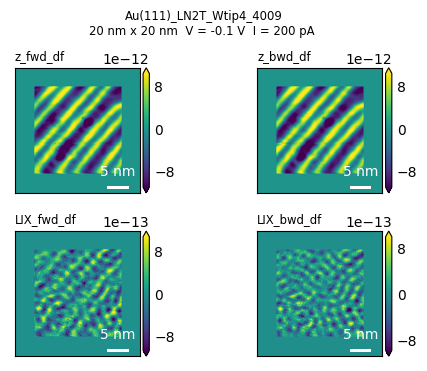

z_fwd_df_fftisns
z_bwd_df_fftisns
LIX_fwd_df_fftisns
LIX_bwd_df_fftisns


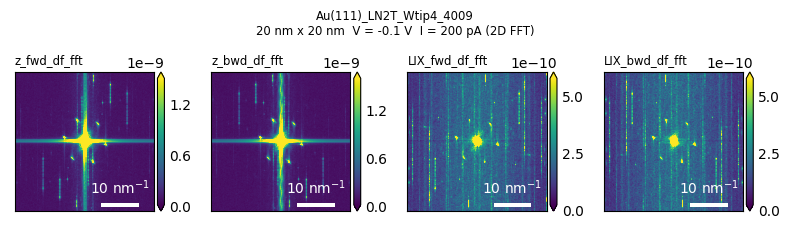

/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")


z_fwd_dfisns
z_bwd_dfisns
LIX_fwd_dfisns
LIX_bwd_dfisns


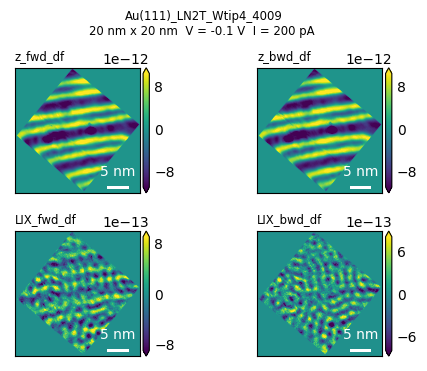

z_fwd_df_fftisns
z_bwd_df_fftisns
LIX_fwd_df_fftisns
LIX_bwd_df_fftisns


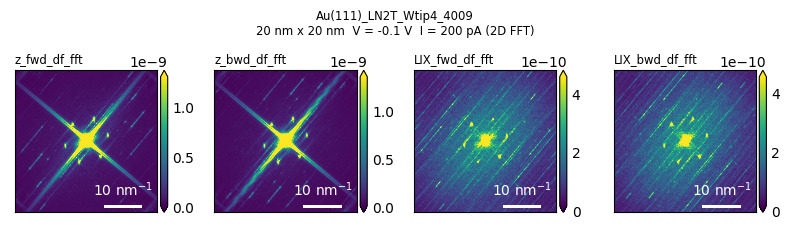

In [152]:
######################
# origina : z_LIX_fNb_xr
# pad : z_LIX_fNb_xr_pad
# rotation_angle_deg : from z_LIX_fNb_xr_fft
# rot : z_LIX_fNb_xr_pad_rot
# fft again : z_LIX_fNb_xr_pad_rot_fft
# src*dst : from z_LIX_fNb_xr_pad_rot_fft

z_LIX_fNb_xr_pad_rot = z_LIX_fNb_xr_pad.copy()

for xr_ch in ( z_LIX_fNb_xr_pad.data_vars): 
    z_LIX_fNb_xr_pad_rot[xr_ch].values = \
    skimage.transform.rotate(z_LIX_fNb_xr_pad[xr_ch].values,
                             rotation_angle_deg,
                             resize = False)
    
#z_LIX_fNb_xr_pad_rot.z_fwd_df.plot()

z_LIX_fNb_xr_pad_fft = two_d_fft_xr(z_LIX_fNb_xr_pad)
xr_data_set_isns_plot_r_space(z_LIX_fNb_xr_pad)
xr_data_set_isns_plot_k_space(z_LIX_fNb_xr_pad_fft)

z_LIX_fNb_xr_pad_rot_fft = two_d_fft_xr(z_LIX_fNb_xr_pad_rot)
xr_data_set_isns_plot_r_space(z_LIX_fNb_xr_pad_rot)
xr_data_set_isns_plot_k_space(z_LIX_fNb_xr_pad_rot_fft)
# 함수가 문제 


# xr_data_pad_rot_fft 
# find  peaks 


* use `xr_input_fft_plot_p6r6`


z_fwd_df_fft
[345 300]
[319 364]
[311 304]
[353 360]
[366 328]
[298 336]
[325 272]
[339 392]
[379 295]
[285 369]
[4, 3, 1, 5, 2, 0]
z_bwd_df_fft
[345 300]
[319 364]
[311 304]
[353 360]
[366 328]
[298 336]
[325 272]
[339 392]
[4, 3, 1, 5, 2, 0]
LIX_fwd_df_fft
[366 328]
[298 336]
[319 364]
[345 300]
[285 369]
[379 295]
[264 341]
[400 323]
[311 304]
[353 360]
[246 386]
[418 278]
[359 267]
[305 397]
[271 401]
[393 263]
[387 356]
[277 308]
[411 217]
[253 447]
[0, 9, 2, 1, 8, 3]
LIX_bwd_df_fft
[366 328]
[298 336]
[345 300]
[319 364]
[379 295]
[285 369]
[400 323]
[264 341]
[277 308]
[387 356]
[359 267]
[305 397]
[311 304]
[353 360]
[0, 13, 3, 1, 12, 2]


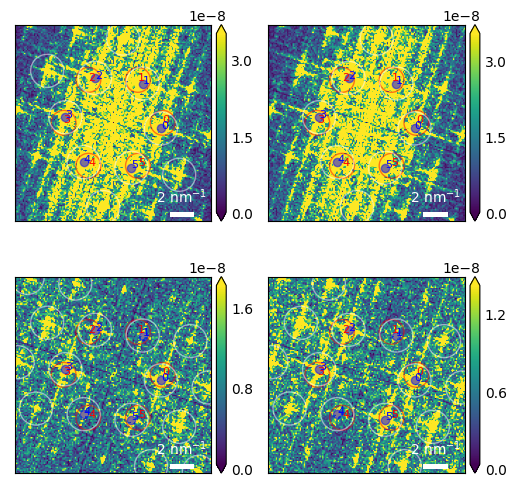

6 reference spots(dst)
[[367.3  332.  ]
 [349.65 362.57]
 [314.35 362.57]
 [296.7  332.  ]
 [314.35 301.43]
 [349.65 301.43]]
6 measured peaks(src)
[[[366. 328.]
  [353. 360.]
  [319. 364.]
  [298. 336.]
  [311. 304.]
  [345. 300.]]

 [[366. 328.]
  [353. 360.]
  [319. 364.]
  [298. 336.]
  [311. 304.]
  [345. 300.]]

 [[366. 328.]
  [353. 360.]
  [319. 364.]
  [298. 336.]
  [311. 304.]
  [345. 300.]]

 [[366. 328.]
  [353. 360.]
  [319. 364.]
  [298. 336.]
  [311. 304.]
  [345. 300.]]]


'\nz_LIX_fNb_xr_pad_fft_p6, z_LIX_fNb_xr_pad_fft_r6  = xr_input_fft_plot_p6r6(z_LIX_fNb_xr_pad_fft,\n                       ref_lattice_a0 = 0.246E-9, zoom_in_fft = False)\n'

In [ ]:
#########
#Test
#########

z_LIX_fNb_xr_pad_rot_fft_p6, z_LIX_fNb_xr_pad_rot_fft_r6  = \
xr_input_fft_plot_p6r6(z_LIX_fNb_xr_pad_rot_fft,
                       ref_lattice_a0 = 0.246E-9, zoom_in_fft = True, zoom_in_expand = 2)

### xr_input_fft_plot_p6r6 의 FFT와 
# two_d_fft_xr  의 결과를 
# xr_data_set_isns_plot_k_space fft 의 방향이 다르다. 
# 같은 데이타인데 방향이 다르게 그려진다. 
# y flip의 형태임. ==> 
# 문제 해결 isns origin issue 였음
'''
z_LIX_fNb_xr_pad_fft_p6, z_LIX_fNb_xr_pad_fft_r6  = \
xr_input_fft_plot_p6r6(z_LIX_fNb_xr_pad_fft,
                       ref_lattice_a0 = 0.246E-9, zoom_in_fft = False)
'''

# 2D FFT based Affine transform 
* use the z fwd _fft & bwd _fft as a affine reference 
* define affine transform from k-space results 
* inverse transform applied to real space image



## Affine after padding 

> _Rotation angle decides padding size_

* src & dst for affine transform 

    * src & dst 
    * __xr_data_fft_fft_src, xr_data_fft_fft_dst__ = xr_input_fft_plot_p6r6(xr_data_fft, ref_lattice_a0 )

* <U> Affine transform is defined by **FFT(k-space)** result! </U>

* We need to apply <U>affine transform function </U> to the **Topo(r-space)** image


## New Function (for AFFINE)   (by Jewook)

Apply Affine tranform (After xr_input_fft_plot_p6r6)



`def affine_xr_tform(xr_data, fft_src, fft_dst):`
$\rightarrow$
`return xr_data_affine,affine_fft_tform`






z_fwd_df_fft
[274 236]
[238 276]
[248 230]
[264 282]
[230 251]
[282 261]
[266 210]
[246 302]
[300 241]
[212 271]
[5, 3, 1, 4, 2, 0]
z_bwd_df_fft
[274 236]
[238 276]
[248 230]
[264 282]
[230 251]
[282 261]
[266 210]
[246 302]
[5, 3, 1, 4, 2, 0]
LIX_fwd_df_fft
[230 251]
[282 261]
[238 276]
[274 236]
[300 241]
[212 271]
[204 245]
[308 267]
[333 238]
[179 274]
[264 282]
[248 230]
[292 216]
[220 296]
[343 192]
[169 320]
[318 221]
[194 291]
[222 225]
[290 287]
[334 272]
[178 240]
[359 243]
[153 269]
[1, 10, 2, 0, 11, 3]
LIX_bwd_df_fft
[230 251]
[282 261]
[274 236]
[238 276]
[300 241]
[212 271]
[204 245]
[308 267]
[222 225]
[290 287]
[292 215]
[220 297]
[248 231]
[264 281]
[1, 13, 3, 0, 12, 2]


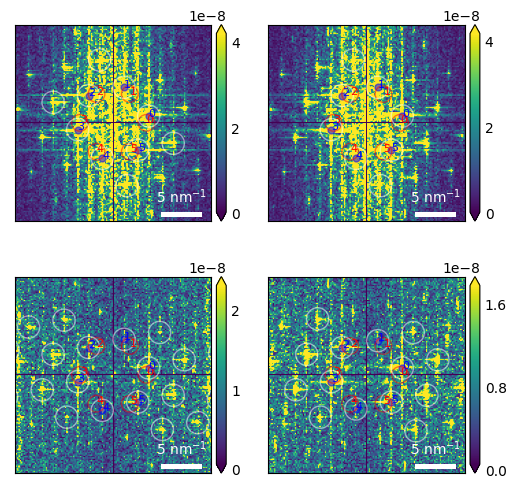

6 reference spots(dst)
[[280.39 256.  ]
 [268.2  277.12]
 [243.8  277.12]
 [231.61 256.  ]
 [243.8  234.88]
 [268.2  234.88]]
6 measured peaks(src)
[[[282. 261.]
  [264. 282.]
  [238. 276.]
  [230. 251.]
  [248. 230.]
  [274. 236.]]

 [[282. 261.]
  [264. 282.]
  [238. 276.]
  [230. 251.]
  [248. 230.]
  [274. 236.]]

 [[282. 261.]
  [264. 282.]
  [238. 276.]
  [230. 251.]
  [248. 230.]
  [274. 236.]]

 [[282. 261.]
  [264. 281.]
  [238. 276.]
  [230. 251.]
  [248. 231.]
  [274. 236.]]]


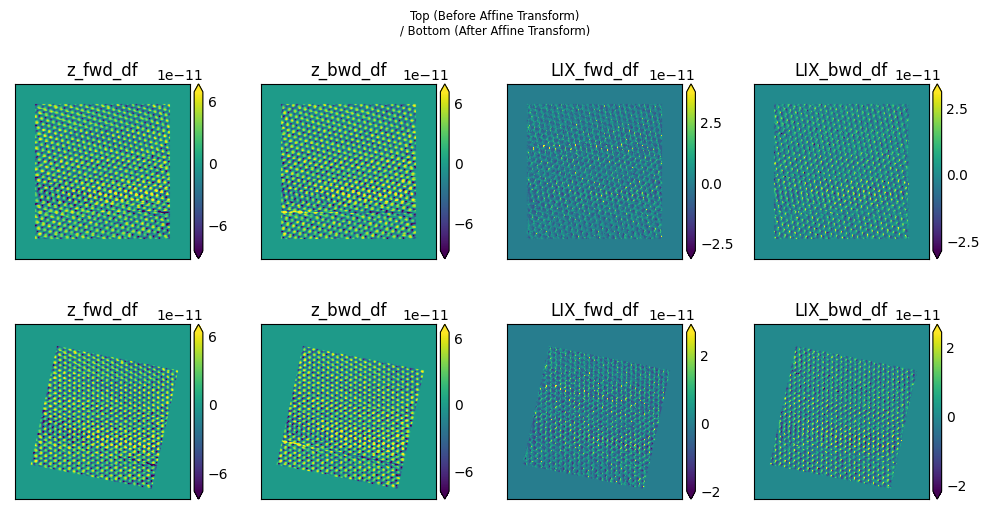

'\n###################################################\nz_LIX_fNb_xr_pad_fft_p6_src, z_LIX_fNb_xr_pad_fft_r6_dst  = xr_input_fft_plot_p6r6(z_LIX_fNb_xr_pad_fft,\n                       ref_lattice_a0 = 0.246E-9)\n###################################################\n# affine src& dst 는 fft로 \n# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#\nz_LIX_fNb_xr_pad_aff,z_LIX_fNb_xr_pad_aff_tform = affine_xr_tform(z_LIX_fNb_xr_pad,\n                 z_LIX_fNb_xr_pad_fft_p6_src[0],\n                 z_LIX_fNb_xr_pad_fft_r6_dst)       \n#변환은 real space data\n#########################################    \n'

In [ ]:
####################################################
# src & dst points 
# xr data & xr fft set 
####################################################
# USE # xr_input_fft_plot_p6r6  function 
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
# input :  xr data + ref_lattice_a0
# output : original data & affine transformed data plot
#           + estimated affine  transform matrix
#            + transformed_xr_data
###################################################
#########################################    
#affine 결과가 충분히  hexagonal 하지 않다. 
# 왜그럴까? sub pixel이 필요한가? 
# FFT 전후 guassian이부족? 
# peak position selection 에 error가 있는가?

def affine_xr_tform(xr_data, fft_src, fft_dst):
    # 처음 input data 의 channel 갯수 세어두기
    xr_data_affine = xr_data.copy()
    # 
    ########################
    # estimate affine transform matrix 
    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    affine_fft_tform = transform.estimate_transform('affine',fft_dst,fft_src)
    # apply affine_fft transform to all channels
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # channel 별로 불러와서 같은  affine transform 진행 
    for xr_i, xr_channel in enumerate (xr_data_affine.data_vars):
        target_df = xr_data_affine[xr_channel].values
        # affine 
        target_df_aff = transform.warp(target_df, 
                                       affine_fft_tform,#.inverse, 
                                       preserve_range = True)
        # channel이름 그대로 
        # values 만 바꿔서 집어 넣는다. 
        xr_data_affine[xr_channel].values = target_df_aff
        #xr_data_affine 에 새로운 channel로 대입
        '''
        xr_data_affine.assign(
            {xr_channel_affine :
             ((xr_data_affine.X,xr_data_affine.Y),target_df_aff)})

        '''
    # plot before & after 
    # xr_data 에 affine 결과가 추가로 붙었다. 
    ncols = len(xr_data.data_vars)

    fig,axes = plt.subplots (ncols = ncols,
                             nrows = len(xr_data_affine.data_vars)//ncols+1,
                             figsize = (10,5))
    # 윗줄은 원래값, 
    # 아랫줄은 affine 값 
    # 세로로 긴 이미지 세트를 만들고 싶으면 
    # ncols, nrows  와 아래쪽 axs[i] 재조정필요 
    axs =  axes.ravel()    
    for xr_i, xr_channel in enumerate (xr_data):
        xr_channel_isns = xr_channel+ 'isns'
        xr_channel_isns = isns.imshow(xr_data[xr_channel],
                                      ax =  axs[xr_i],
                                      origin = "lower",
                                      robust = True)
        # 일단은 original data 그리기
        xr_channel_isns.set_title(xr_channel)
    for xr_aff_i, xr_aff_channel in enumerate (xr_data_affine):
        xr_aff_channel_isns = xr_aff_channel+ 'isns'
        xr_aff_channel_isns = isns.imshow(xr_data_affine[xr_aff_channel],
                                          ax =  axs[xr_aff_i + ncols],
                                          origin = "lower",
                                          robust = True)
        xr_aff_channel_isns.set_title(xr_aff_channel)
        #아랫줄로 가려고 axs 숫자에 ncols 더함 
        # channel이름을 [] 로 불러내는것 확인할것. 
    fig.suptitle( 
        "Top (Before Affine Transform)\n/ Bottom (After Affine Transform)",
        fontsize = 'small',
        position=(0.5, 1.0+0.05))
    plt.tight_layout()
    
    plt.show()
    isns.reset_defaults()
    return xr_data_affine,affine_fft_tform


#########################################    
# test 
# before use the affine, 
###################################################
z_LIX_fNb_xr_fft_p6_src, z_LIX_fNb_xr_fft_r6_dst  = \
xr_input_fft_plot_p6r6(z_LIX_fNb_xr_fft,
                       ref_lattice_a0 = 0.246E-9)
###################################################
# affine src& dst 는 fft로 
# affine 결과는pad 적용 
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
z_LIX_fNb_xr_pad_aff,z_LIX_fNb_xr_pad_aff_tform =\
 affine_xr_tform(z_LIX_fNb_xr_pad,
                 z_LIX_fNb_xr_fft_p6_src[0],
                 z_LIX_fNb_xr_fft_r6_dst)       
#변환은 real space data



"""
###################################################
z_LIX_fNb_xr_pad_fft_p6_src, z_LIX_fNb_xr_pad_fft_r6_dst  = \
xr_input_fft_plot_p6r6(z_LIX_fNb_xr_pad_fft,
                       ref_lattice_a0 = 0.246E-9)
###################################################
# affine src& dst 는 fft로 
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
z_LIX_fNb_xr_pad_aff,z_LIX_fNb_xr_pad_aff_tform =\
 affine_xr_tform(z_LIX_fNb_xr_pad,
                 z_LIX_fNb_xr_pad_fft_p6_src[0],
                 z_LIX_fNb_xr_pad_fft_r6_dst)       
#변환은 real space data
#########################################    
"""

/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")


z_fwd_dfisns
z_bwd_dfisns
LIX_fwd_dfisns
LIX_bwd_dfisns


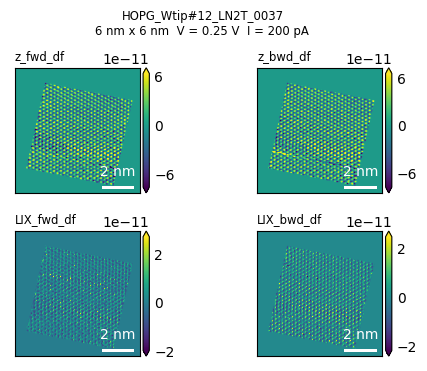

z_fwd_df_fftisns
z_bwd_df_fftisns
LIX_fwd_df_fftisns
LIX_bwd_df_fftisns


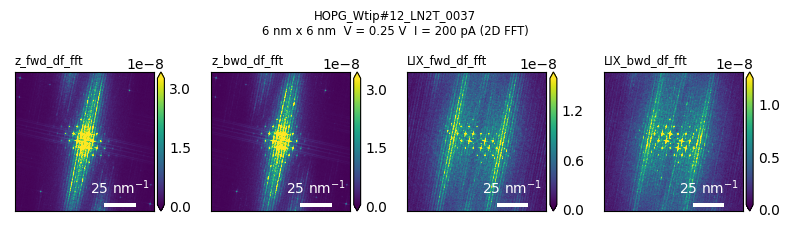

z_fwd_df_fft
[351 298]
[313 366]
[314 298]
[350 366]
[295 332]
[369 332]
[333 264]
[331 400]
[5, 3, 1, 4, 2, 0]
z_bwd_df_fft
[351 298]
[313 366]
[314 298]
[350 366]
[295 332]
[369 332]
[333 264]
[331 400]
[5, 3, 1, 4, 2, 0]
LIX_fwd_df_fft
[295 332]
[369 332]
[313 366]
[351 298]
[388 298]
[276 366]
[407 331]
[257 333]
[350 366]
[314 298]
[370 264]
[294 400]
[433 283]
[231 381]
[408 264]
[256 400]
[388 365]
[276 299]
[1, 8, 2, 0, 9, 3]
LIX_bwd_df_fft
[295 332]
[369 332]
[351 298]
[313 366]
[388 298]
[276 366]
[407 331]
[257 333]
[276 299]
[388 365]
[370 264]
[294 400]
[314 298]
[350 366]
[1, 13, 3, 0, 12, 2]


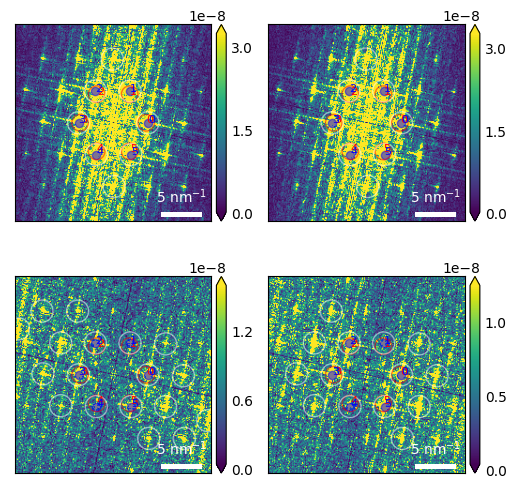

6 reference spots(dst)
[[367.3  332.  ]
 [349.65 362.57]
 [314.35 362.57]
 [296.7  332.  ]
 [314.35 301.43]
 [349.65 301.43]]
6 measured peaks(src)
[[[369. 332.]
  [350. 366.]
  [313. 366.]
  [295. 332.]
  [314. 298.]
  [351. 298.]]

 [[369. 332.]
  [350. 366.]
  [313. 366.]
  [295. 332.]
  [314. 298.]
  [351. 298.]]

 [[369. 332.]
  [350. 366.]
  [313. 366.]
  [295. 332.]
  [314. 298.]
  [351. 298.]]

 [[369. 332.]
  [350. 366.]
  [313. 366.]
  [295. 332.]
  [314. 298.]
  [351. 298.]]]


In [ ]:
############
#affine 을 xr_pad 에 적용한 결과 
#
#z_LIX_fNb_xr_pad_aff
z_LIX_fNb_xr_pad_aff_fft = two_d_fft_xr(z_LIX_fNb_xr_pad_aff)

xr_data_set_isns_plot_r_space(z_LIX_fNb_xr_pad_aff)
xr_data_set_isns_plot_k_space(z_LIX_fNb_xr_pad_aff_fft)
# affine  이후 다시 6 point check 

z_LIX_fNb_xr_pad_aff_fft_p6, z_LIX_fNb_xr_pad_aff_fft_r6 = \
xr_input_fft_plot_p6r6(z_LIX_fNb_xr_pad_aff_fft)


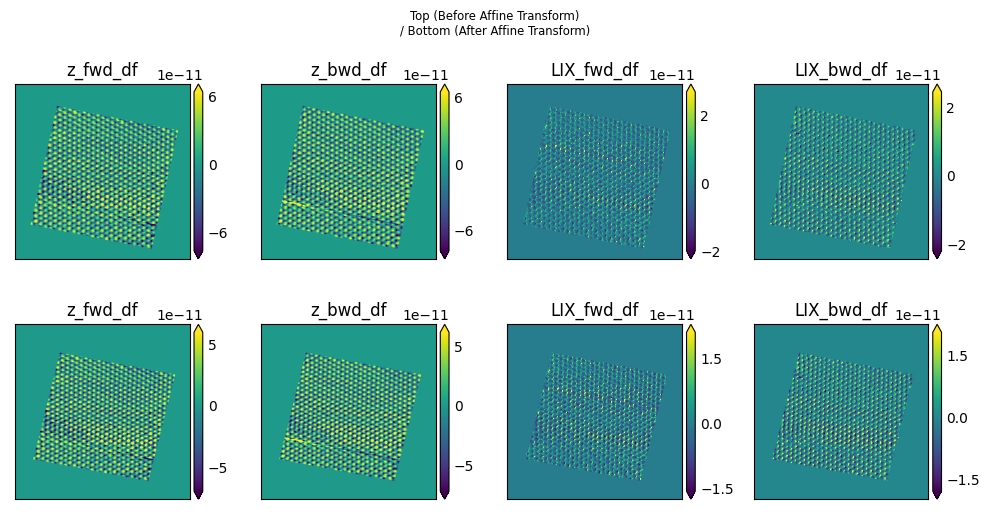

/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")
/usr/local/lib/python3.7/dist-packages/xrft/xrft.py:241: UserWarning: true_phase argument is ignored in xrft.fft
  warnings.warn("true_phase argument is ignored in xrft.fft")


z_fwd_dfisns
z_bwd_dfisns
LIX_fwd_dfisns
LIX_bwd_dfisns


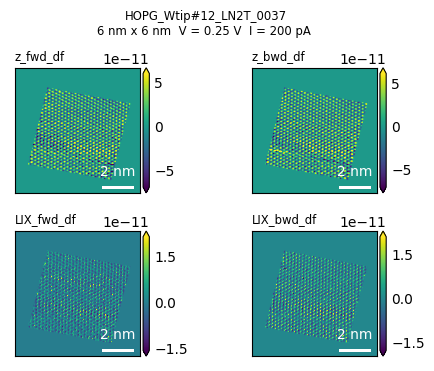

z_fwd_df_fftisns
z_bwd_df_fftisns
LIX_fwd_df_fftisns
LIX_bwd_df_fftisns


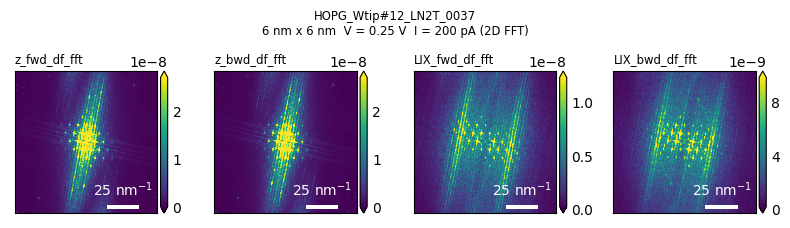

z_fwd_df_fft
[352 294]
[312 370]
[313 295]
[351 369]
[371 331]
[293 333]
[333 257]
[331 407]
[391 293]
[273 371]
[4, 3, 1, 5, 2, 0]
z_bwd_df_fft
[352 294]
[312 370]
[313 295]
[351 369]
[371 331]
[293 333]
[333 257]
[331 407]
[4, 3, 1, 5, 2, 0]
LIX_fwd_df_fft
[371 331]
[293 333]
[352 294]
[312 370]
[391 293]
[273 371]
[410 330]
[254 334]
[313 295]
[351 369]
[372 256]
[292 408]
[438 276]
[226 388]
[411 255]
[253 409]
[0, 9, 3, 1, 8, 2]
LIX_bwd_df_fft
[371 331]
[293 333]
[352 294]
[312 370]
[391 293]
[273 371]
[410 330]
[254 334]
[274 296]
[390 368]
[372 255]
[292 409]
[313 295]
[351 369]
[0, 13, 3, 1, 12, 2]


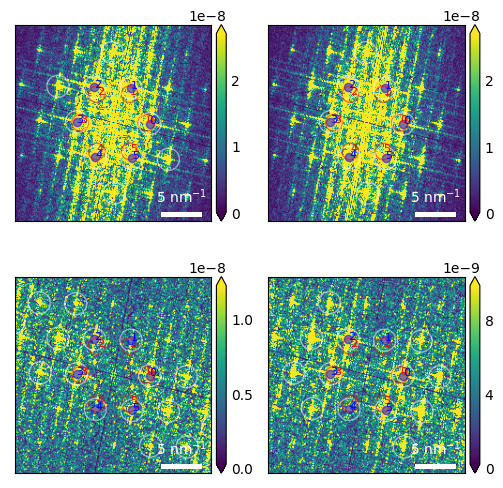

6 reference spots(dst)
[[367.3  332.  ]
 [349.65 362.57]
 [314.35 362.57]
 [296.7  332.  ]
 [314.35 301.43]
 [349.65 301.43]]
6 measured peaks(src)
[[[371. 331.]
  [351. 369.]
  [312. 370.]
  [293. 333.]
  [313. 295.]
  [352. 294.]]

 [[371. 331.]
  [351. 369.]
  [312. 370.]
  [293. 333.]
  [313. 295.]
  [352. 294.]]

 [[371. 331.]
  [351. 369.]
  [312. 370.]
  [293. 333.]
  [313. 295.]
  [352. 294.]]

 [[371. 331.]
  [351. 369.]
  [312. 370.]
  [293. 333.]
  [313. 295.]
  [352. 294.]]]


(array([[[371., 331.],
         [351., 369.],
         [312., 370.],
         [293., 333.],
         [313., 295.],
         [352., 294.]],
 
        [[371., 331.],
         [351., 369.],
         [312., 370.],
         [293., 333.],
         [313., 295.],
         [352., 294.]],
 
        [[371., 331.],
         [351., 369.],
         [312., 370.],
         [293., 333.],
         [313., 295.],
         [352., 294.]],
 
        [[371., 331.],
         [351., 369.],
         [312., 370.],
         [293., 333.],
         [313., 295.],
         [352., 294.]]]), array([[367.3 , 332.  ],
        [349.65, 362.57],
        [314.35, 362.57],
        [296.7 , 332.  ],
        [314.35, 301.43],
        [349.65, 301.43]]))

In [ ]:
z_LIX_fNb_xr_pad_aff_aff,z_LIX_fNb_xr_pad_aff_aff_tform = \
affine_xr_tform (z_LIX_fNb_xr_pad_aff, z_LIX_fNb_xr_pad_aff_fft_p6[0], z_LIX_fNb_xr_pad_aff_fft_r6)


z_LIX_fNb_xr_pad_aff_aff_fft = two_d_fft_xr(z_LIX_fNb_xr_pad_aff_aff)

xr_data_set_isns_plot_r_space(z_LIX_fNb_xr_pad_aff_aff)
xr_data_set_isns_plot_k_space(z_LIX_fNb_xr_pad_aff_aff_fft)
# affine  이후 다시 6 point check 
xr_input_fft_plot_p6r6 (z_LIX_fNb_xr_pad_aff_aff_fft)

# Affine test 
* fft, pad, affine 모두 동작함 
* affine의 방향 설정을 한번더 확인해야함. 
* 일단 순차적인  함수들이 작동한다. 
# 함수 종류 


* two_d_fft_xr
    * real space data -> fft 
* xr_input_fft_plot_p6r6
    * fft results + ref a0 -> ref point &  nearest 6peaks

**src & dst** 
* affine_xr_tform
    * realspace xr data  -> after affine  + affine transfrom  

# data 종류 

>* xr_data_(z_LIX_fNb_xr) : original data 
* xr_data + '_fft' : two_d_fft_xr (xr_data)
* xr_data + '_pad' : padding  (based on rotaional angle) results
* xr_data + '_rot' : after rotation (xr_data)
* xr_data + '_aff' : affine_xr_tform(xr_data)

>*  xr_data + _fft_p6, fft__r6 : after **xr_data_fft_find_6peaks**(xr_data + '_fft')
*  xr_data + _fft_p6_src, _fft_r6_dst  : after **xr_input_fft_plot_p6r6**(xr_data + '_fft')


# Reference Atomic Lattice (3fold-symmetry)
* **Real** space reference & **K** space reference image 
각각 구할것. 
* ref_a0 = 0.246E-9  $\rightarrow$ lattice constant
* ref_k0 = 1/(ref_a0)


##xr_data + ref lattice 
* **xr_data_w_ref_lattice_r_space** function 

`def xr_data_w_ref_lattice_r_space (xr_data, ref_lattice_a0 = 0.246E-9 )`
$\rightarrow$ `return ref_r_space_map_xr, ref_r_space_points_np`
> * input data : xr_data , ref_lattice_a0
> * output data : z_fwd_df+ ref_points, ref_r_space_points_np (ref_pts)

##xr_data_fft + ref lattice 
* **xr_data_fft_w_ref_lattice_k_space** function 

`def xr_data_fft_w_ref_lattice_k_space (xr_data_fft, ref_lattice_a0 = 0.246E-9 )`
$\rightarrow$ `return ref_k_space_map_xr, ref__k_points_np (ref_pts)`
> * input data : xr_data_fft , ref_lattice_a0
> * output data : xr_data_fft.z_fwd_df, ref__k_points_np


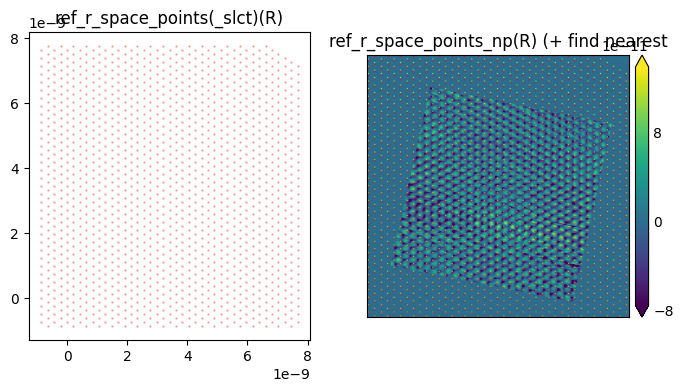

In [ ]:
######################################
# reference atomic lattice (3fold-symmetry)
#######################################
# 함수로 만들것. 
# input =  xr_data , ref_lattice_a0

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
#xr_data = z_LIX_fNb_xr_pad_aff
#ref_lattice_a0 = 0.246E-9  # lattice constant
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#

def xr_data_w_ref_lattice_r_space (xr_data, ref_lattice_a0 = 0.246E-9 ):
    ref_a_b_vect = ref_lattice_a0 * np.array([[math.cos(i* math.pi/3+math.pi/2), 
                                               math.sin(i* math.pi/3+math.pi/2)]
                                              for i in range(2)])
    # 2 reference (basis) vector for ref_lattice map
    # range ( -n, n+1,1 ) 로  point 갯수 조정 
    #r_space_point_n = 40
    r_space_point_n = int(1.5* xr_data.X.max()//ref_lattice_a0)
    # padding 고려해서 전체 필요한 크기 20%의 margin 
    ref_r_space_points = np.array(
        [n_i* ref_a_b_vect[0] + m_j* ref_a_b_vect[1]
         for n_i in range(-r_space_point_n, r_space_point_n+1, 1)
         for m_j in range(-r_space_point_n, r_space_point_n+1, 1)])
    #plt.scatter(ref_r_space_points[:,0],ref_r_space_points[:,1])
    # cx, ry 순서임
    # xr_data 의 real space  coord 내에 있는 point list     
    ref_r_space_points_slct = np.array(
            [ref_r_space_point 
             for ref_r_space_point in  ref_r_space_points
             if ref_r_space_point[0] < xr_data.X.max()
             and ref_r_space_point[0]> xr_data.X.min()
             if ref_r_space_point[1]< xr_data.Y.max()
             and ref_r_space_point[1]> xr_data.Y.min()])
    #plt.scatter(ref_r_space_points_slct[:,0],ref_r_space_points_slct[:,1])
    #전체  point list test용 
    _, ref_r_space_points_xr_X = find_nearest(
                xr_data.X,ref_r_space_points_slct[:,0])
    _, ref_r_space_points_xr_Y = find_nearest(
                xr_data.Y,ref_r_space_points_slct[:,1])
    # point list 에 가장 가까운 pixel 을 지정.   
    ref_r_space_points_np = np.stack(
            (ref_r_space_points_xr_X, 
             ref_r_space_points_xr_Y), 
                      axis = -1)
    #plt.scatter(ref_r_space_points_np[:,0],ref_r_space_points_np[:,1])

    # x,y 로 합침
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    ref_r_space_map_xr = xr_data.z_fwd_df.copy()
    # point 를 overlayer 해서 그릴 첫번째 channel 선택
    for ref_point in ref_r_space_points_np :
        r_circle_cx, r_circle_ry  = skimage.draw.disk (
            ref_point,
            radius = ref_lattice_a0/xr_data.X_spacing*0.05,
            shape =  xr_data.z_fwd_df.values.shape 
            )
        #print(r_circle_ry, r_circle_cx)
        ref_r_space_map_xr[r_circle_ry,r_circle_cx] = \
        xr_data.z_fwd_df.values.max()
        #isns.imshow(ref_r_space_map_xr,robust = True, origin= "lower")
        # ref_r_space_points_np 는 x,y

    fig,axes = plt.subplots (nrows = 1,ncols = 2, figsize = (8,4))
    axs = axes.ravel()
    axs[0].set_title("ref_r_space_points(_slct)(R)")
    axs[0].scatter(ref_r_space_points_slct[:,0],ref_r_space_points_slct[:,1],
                   s=0.2,
                   c='r',
                   alpha =0.5)
    isns.imshow(ref_r_space_map_xr,robust = True, origin= "lower",ax = axs[1])
    axs[1].scatter(ref_r_space_points_np[:,0],ref_r_space_points_np[:,1],
                   s=0.2,
                   c='r',
                   alpha =0.5)
    axs[1].set_title("ref_r_space_points_np(R) (+ find nearest")  
    isns.reset_defaults()
    # 모든 points 는 cx, ry 순서임
    plt.show()
    return ref_r_space_map_xr,ref_r_space_points_np
    


z_LIX_fNb_xr_pad_aff_r_lattice_map, z_LIX_fNb_xr_pad_aff_r_lattice = \
xr_data_w_ref_lattice_r_space(z_LIX_fNb_xr_pad_aff)
#isns.imshow(z_LIX_fNb_xr_pad_aff_r_lattice)
#xr_data.z_fwd_df.plot()

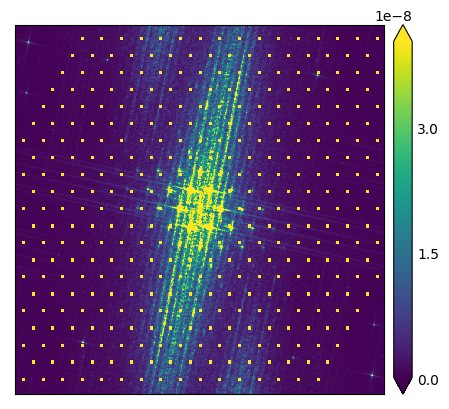

In [ ]:
######################################
# reference atomic lattice (3fold-symmetry)
#######################################
def xr_data_fft_w_ref_lattice_k_space(xr_data_fft, ref_lattice_a0 = 0.246E-9 ):
    ref_k0 = 1/(ref_lattice_a0)
    ref6points  = ref_k0 * np.array([[math.cos(i* math.pi/3), 
                                  math.sin(i* math.pi/3)]
                       for i in range(6)])
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    #z_LIX_fNb_xr_fft 를 기반으로 ref lattice를 만듬 
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # 구구단 처럼.  n,m 갯수만큼 point 숫자를 늘리고, 
    # range ( -n, n+1, 1  ) 로  point 갯수 조정 
    #ref6points[0], ref6points[1] 의 n,m  조합을 그려낸다. 
    #number_of_ref_points_n = 15
    number_of_ref_points_n = int(1.2* xr_data_fft.freq_X.max()//ref_k0)
    # padding 고려해서 전체 필요한 크기 20%의 margin
    ref_lattice_points = np.array([n_i* ref6points[0] + m_j* ref6points[1]
                                for n_i in range(
                                    -number_of_ref_points_n,
                                    number_of_ref_points_n+1,
                                    1)
                                for m_j in range(-number_of_ref_points_n,
                                                    number_of_ref_points_n+1,
                                                    1)])
    ref_lattice_points_slct = np.array([ ref_lattice_point 
            for ref_lattice_point in  ref_lattice_points  
            if ref_lattice_point[0]< xr_data_fft.freq_X.max()  
            and ref_lattice_point[0]> xr_data_fft.freq_X.min()
            if ref_lattice_point[1]< xr_data_fft.freq_Y.max()  
            and ref_lattice_point[1]> xr_data_fft.freq_Y.min()] )
    # 전체 array 가운데 freq_X,freq_Y 의 범위 안에 들어오는 값들만 남김
    # 선택된 point만 남김 

    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#

    _, ref_lattice_points_xr_freq_X = find_nearest(
            xr_data_fft.freq_X,ref_lattice_points_slct[:,0])
    _, ref_lattice_points_xr_freq_Y = find_nearest(
            xr_data_fft.freq_Y,ref_lattice_points_slct[:,1])

    ref_k_points_np = np.stack(
        (ref_lattice_points_xr_freq_X, 
        ref_lattice_points_xr_freq_Y), 
            axis = -1)
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    ref_k_space_map_xr =  xr_data_fft.z_fwd_df_fft.copy()
    # 기준값과 유사한 map을 만들고, 
    # 기준값을 filttering 
    for ref_point in ref_k_points_np :
        r6_circle_cx, r6_circle_ry = \
            skimage.draw.disk((ref_point),
                                (ref_k0/xr_data_fft.freq_X.spacing)*0.05,
                                shape =  xr_data_fft.z_fwd_df_fft.values.shape )
        ref_k_space_map_xr[r6_circle_ry, r6_circle_cx ] = 1#xr_data_fft.z_fwd_df_fft.values.max()
        gaussian_filter (ref_k_space_map_xr, sigma =3)
    isns.imshow(ref_k_space_map_xr,robust = True, origin= "lower")
    isns.reset_defaults()
    # ref_k_points_np 는 freq_X, freq_Y 순서 
    return ref_k_space_map_xr, ref_k_points_np

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
#xr_data_fft = z_LIX_fNb_xr_fft
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
#z_LIX_fNb_xr_fft 를 기반으로 ref lattice를 만듬 

z_LIX_fNb_xr_pad_aff_fft_map,z_LIX_fNb_xr_pad_aff_fft_np = \
xr_data_fft_w_ref_lattice_k_space(z_LIX_fNb_xr_pad_aff_fft)
#ref6_fft_map_xr

#plt.imshow(np.log(np.abs(xrft.idft(ref6_fft_map_xr, lag=45)+1)))
#ref_lattice_points


* ref data 를  기반으로 만들어낸 atomic peak data
> xr_data_w_ref_lattice_r_space (xr_data)

* fft data 를  기반으로 만들어낸 atomic peak data 
> xr_data_fft_w_ref_lattice_k_space(xr_data_fft) 


 

# Atomic Piecewise Affine transform 



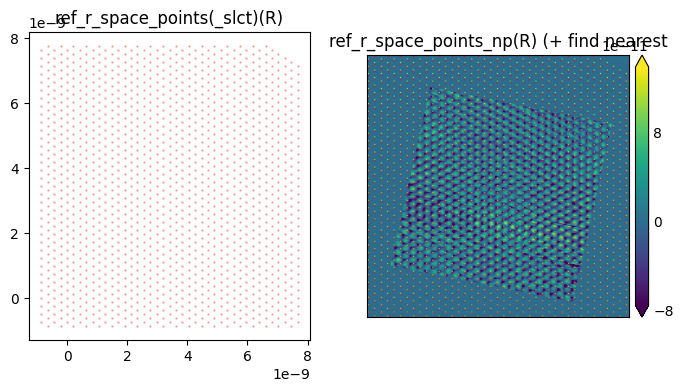

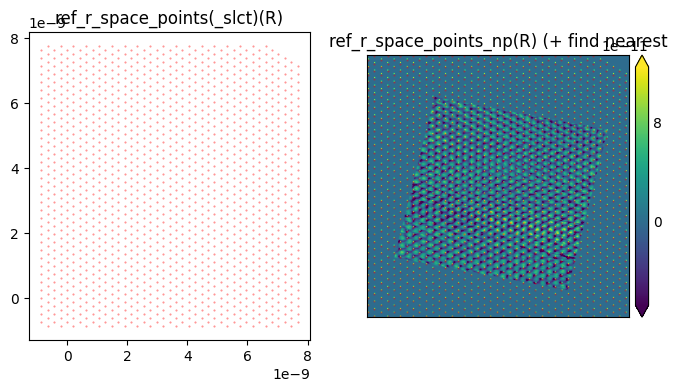

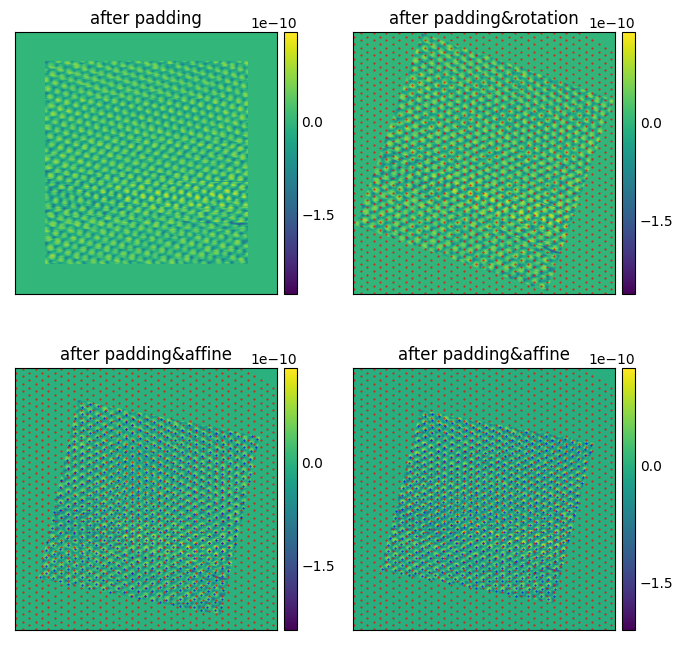

In [ ]:
#########################
# lattice ref map찾기 
##########################

z_LIX_fNb_xr_pad_aff_r_lattice_map, z_LIX_fNb_xr_pad_aff_r_lattice = \
xr_data_w_ref_lattice_r_space(z_LIX_fNb_xr_pad_aff)
# peak point list 
# z_LIX_fNb_xr_pad_aff_r_lattice  는 cx,ry로 나옴
z_LIX_fNb_xr_pad_aff_aff_r_lattice_map, z_LIX_fNb_xr_pad_aff_aff_r_lattice = \
xr_data_w_ref_lattice_r_space(z_LIX_fNb_xr_pad_aff_aff)

#########################
# local max lattice  찾기  함수 
#########################
 
def find_local_max_point_2d (xr_data, ref_lattice_a0 = 0.246E-9):
    xr_data_gaussian  = gaussian_filter(xr_data.z_fwd_df, sigma=2)
    xr_data_lcl_pks_rycx = peak_local_max(xr_data_gaussian,
                                          min_distance = int(
                                              0.25*ref_lattice_a0//xr_data.X_spacing
                                              ),
                                                exclude_border=0,
                                                threshold_rel = 0.25)
    # 대략 원자간의 거리 의 pixel 수 의 1/4
    # threshold_rel = 0.25 으로 바깥쪽 0 를 제외함 
    # 결과값이 ry,cx 순서라서 다시 바꿔줌 
    xr_data_lcl_pks = xr_data_lcl_pks_rycx[:,::-1]
    # 결과가 cx, ry 순서로 나오도록 
    return xr_data_lcl_pks

z_LIX_fNb_xr_pad_aff_lcl_pks = find_local_max_point_2d(z_LIX_fNb_xr_pad_aff)
z_LIX_fNb_xr_pad_aff_aff_lcl_pks = find_local_max_point_2d(z_LIX_fNb_xr_pad_aff_aff)


###############################
fig, axes = plt.subplots(2, 2, figsize=(8,8), sharex=True, sharey=True)
axs = axes.ravel()
isns.imshow(z_LIX_fNb_xr_pad.z_fwd_df, origin  ="lower",  ax = axs[0] )
axs[0].set_title('after padding')
isns.imshow(z_LIX_fNb_xr_pad_rot.z_fwd_df, origin  ="lower",  ax = axs[1] )
axs[1].set_title('after padding&rotation')
axs[1].scatter(z_LIX_fNb_xr_pad_aff_r_lattice[:,0],
               z_LIX_fNb_xr_pad_aff_r_lattice[:,1],
               s=0.2,
               c='r')
isns.imshow(z_LIX_fNb_xr_pad_aff.z_fwd_df, origin  ="lower",  ax = axs[2] )
axs[2].scatter(z_LIX_fNb_xr_pad_aff_r_lattice[:,0],
               z_LIX_fNb_xr_pad_aff_r_lattice[:,1],
               s=0.2,
               c='r')
axs[2].scatter(z_LIX_fNb_xr_pad_aff_lcl_pks[:,0],
            z_LIX_fNb_xr_pad_aff_lcl_pks[:,1],
            s=0.2,
            c='b')
axs[2].set_title('after padding&affine')
isns.imshow(z_LIX_fNb_xr_pad_aff_aff.z_fwd_df, origin  ="lower",  ax = axs[3] )
axs[3].scatter(z_LIX_fNb_xr_pad_aff_aff_r_lattice[:,0],
               z_LIX_fNb_xr_pad_aff_aff_r_lattice[:,1],
               s=0.2,
               c='r')
axs[3].scatter(z_LIX_fNb_xr_pad_aff_aff_lcl_pks[:,0],
            z_LIX_fNb_xr_pad_aff_aff_lcl_pks[:,1],
            s=0.2,
            c='b')
axs[3].set_title('after padding&affine')

plt.show()

# Overlap이 있는 부분 고르기 





r_pts.shape:  (1449, 2)
p_pts.shape:  (630, 2)
mid_distance: 20
r_pts_slct.shape:  (2541, 2)


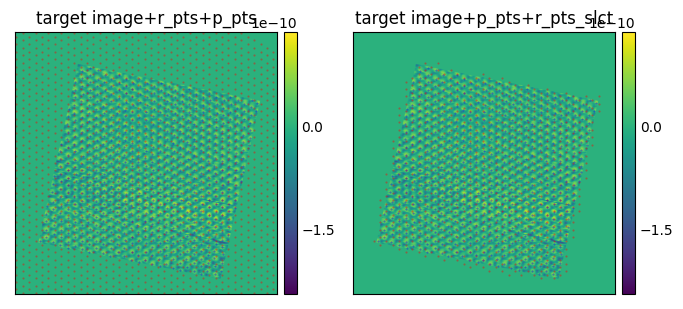

In [ ]:
#  z_LIX_fNb_xr_pad_aff 기준 
# z_LIX_fNb_xr_pad_aff_r_lattice # reference points 
# z_LIX_fNb_xr_pad_aff_lcl_pks # local peaks 

ref_lattice_a0 = 0.246E-9
r_pts = z_LIX_fNb_xr_pad_aff_r_lattice
p_pts = z_LIX_fNb_xr_pad_aff_lcl_pks
#affine 한번한결과. 
xr_data = z_LIX_fNb_xr_pad_aff

min_distance = 1*int(
     ref_lattice_a0//xr_data.X_spacing
     )

r_pts_slct = np.array ([r_pt for p_pt in p_pts
                        for r_pt in r_pts
                        if distance.euclidean(r_pt, p_pt) < min_distance ] )

r_pts_slct_df = pd.DataFrame(r_pts_slct,
                             columns = ["cx", "ry"]).drop_duplicates()
# drop duplicate!
print ("r_pts.shape: ", r_pts.shape )
print ("p_pts.shape: ", p_pts.shape )
print ("mid_distance:", min_distance)
print ("r_pts_slct.shape: ", r_pts_slct.shape )


###############################
fig, axes = plt.subplots(1, 2, figsize=(8,4), sharex=True, sharey=True)
axs = axes.ravel()
isns.imshow(xr_data.z_fwd_df, origin  ="lower",  ax = axs[0] )
axs[0].set_title('target image+r_pts+p_pts')
axs[0].scatter(r_pts[:,0],
               r_pts[:,1],
               s=0.2,
               c='r', 
               alpha = 0.5)
axs[0].scatter(p_pts[:,0],
               p_pts[:,1],
               s=0.2,
               c='b', 
               alpha = 0.5)
isns.imshow(xr_data.z_fwd_df, origin  ="lower",  ax = axs[1] )
axs[1].set_title('target image+p_pts+r_pts_slct')
axs[1].scatter(r_pts_slct_df.cx,
               r_pts_slct_df.ry,
               s=0.2,
               c='r', 
               alpha = 0.5)
axs[1].scatter(p_pts[:,0],
               p_pts[:,1],
               s=0.2,
               c='b', 
               alpha = 0.5)
plt.show()
###############################

## column by column ref points reading $\rightarrow$ column1 point set $\rightarrow$ c select area $\rightarrow$ load peak points in selected area $\rightarrow$ 1-to-1 corresponding & find ref_pts & peak_points set $\rightarrow$  remove the selected peak points form peak list (to avoid double selection) 


r_pts 와 p_pts 를 dataframe으로 불러옴. 

1. r_pts  에서  cx  중 가장 작은 값 불러옴 
2. 같은 cx 를 갖는 r_pts 불러옴 
3. convex hull이나 dialation 보다 draw.rectangle 이더 효과적임. 

4. targe area 내부에 존재하는 p_pts 불러옴 
5. 각각의 r_pts 에 해당하는(가장가까운) p_pts 를 지정 
6. 짝이 지워진 p_pts를 원래 set에서 지움 (두번 찾지 않도록) 
7. 다음번 cx를 불러옴. 

In [ ]:
from sklearn.metrics.pairwise import paired_distances
from sklearn.metrics.pairwise import pairwise_distances_argmin
#r_pts_slct_df
#p_pts_df_slct_cx_set
sklearn.metrics.pairwise_distances_argmin
p_t = p_pts_df_slct_cx_set.to_numpy()
r_t = r_pts_slct_df_cx_set.to_numpy()
## sklearn 사용하기 위해서 np 로 변환 


pairwise_distances(r_t,p_t)
print (pairwise_distances(r_t,p_t).shape)
## 각 점의 set 에 대해서 distance pair를 구하는 법 
sklearn.metrics.pairwise_distances_argmin(r_t,p_t)
## 각 점에 대해서 distance min을 갖는 idx 찾는법. 

p_t_slct = p_t[pairwise_distances_argmin(r_t,p_t)]
## 각 r_pt 점에 대한 distance min 을 찾은 결과 

#짝이 결정되지 않은 1 r_t 도 함께 남음 


rp_pairs =  np.hstack([r_t,p_t_slct]) 
## ref pt 와 peak point pairs ( 3D data )
rp_pairs =  np.hstack([r_t,p_t_slct]) 
rp_pairs_all = np.append(rp_pairs_all,rp_pairs, axis=0) 
    


(3, 11)


In [ ]:
#r_pts_slct_df + round(p_pts_df.mean() -r_pts_slct_df.mean()).astype(int)



,cx,ry
0,443,190
1,426,200
2,443,209
3,426,219
4,361,219
...,...,...
2511,68,237
2515,589,294
2525,394,49
2529,475,40


      cx   ry
1308  55  135
(1, 8)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.7/dist-packages/seaborn_image/_core.py:134: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  norm=self.norm,


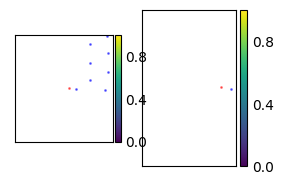

      cx   ry
109   71  144
642   71  163
847   71  201
849   71  220
1149  71  182
1307  71  126
2511  71  238
(7, 22)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


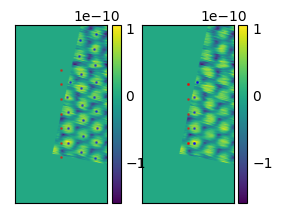

      cx   ry
108   87  135
110   87  154
571   87  210
573   87  229
643   87  173
846   87  191
970   87  248
2167  87  267
2469  87  285
2534  87  304
(10, 29)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


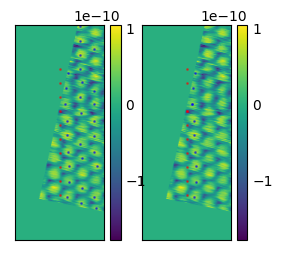

       cx   ry
212   104  314
214   104  332
293   104  351
295   104  370
377   104  163
570   104  201
572   104  220
829   104  257
831   104  276
863   104  182
969   104  238
1311  104  144
1359  104  126
2283  104  389
2329  104  295
(15, 33)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


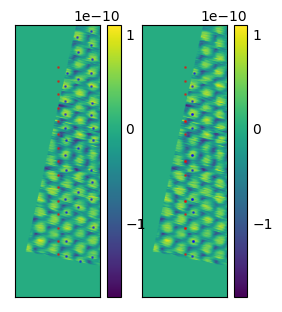

       cx   ry
213   120  323
215   120  342
265   120  361
296   120  379
362   120  285
365   120  304
376   120  154
379   120  173
532   120  436
743   120  229
746   120  248
830   120  267
996   120  191
1123  120  417
1261  120  455
1310  120  135
1607  120  398
1708  120  210
2211  120  116
2476  120  473
(20, 41)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


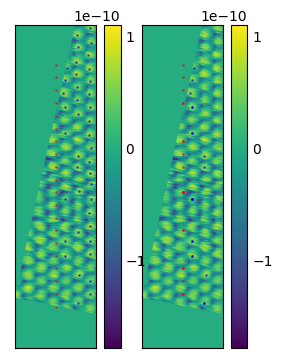

       cx   ry
156   136  464
201   136  370
264   136  351
281   136  314
284   136  332
361   136  276
364   136  295
378   136  163
418   136  201
434   136  389
470   136  520
530   136  182
531   136  426
534   136  445
614   136  539
712   136  483
742   136  220
745   136  238
1015  136  502
1122  136  408
1312  136  144
1578  136  126
1903  136  257
2417  136  107
(24, 42)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


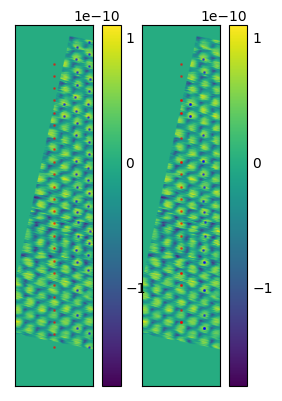

       cx   ry
155   153  455
158   153  473
188   153  492
200   153  361
203   153  379
263   153  342
280   153  304
283   153  323
363   153  285
417   153  191
420   153  210
436   153  398
454   153  154
456   153  173
469   153  511
472   153  530
533   153  436
555   153  549
663   153  417
744   153  229
1373  153  135
1902  153  248
1905  153  267
2295  153  116
(24, 37)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


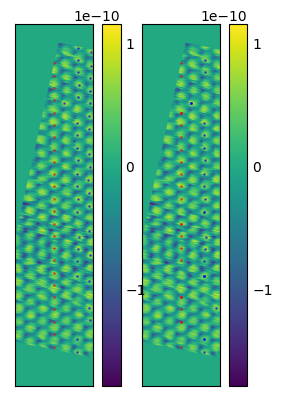

       cx   ry
157   169  464
181   169  483
190   169  502
199   169  351
202   169  370
329   169  332
406   169  295
408   169  314
419   169  201
435   169  389
455   169  163
471   169  520
522   169  408
554   169  539
557   169  558
647   169  426
672   169  220
674   169  238
676   169  182
804   169  445
811   169  257
1164  169  276
1362  169  126
1364  169  144
1690  169  577
1721  169  107
(26, 15)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


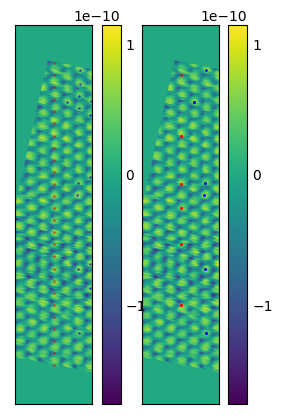

       cx   ry
160   185  455
162   185  473
189   185  492
245   185  342
357   185  267
359   185  285
407   185  304
409   185  323
518   185  379
521   185  398
556   185  549
562   185  361
601   185  248
646   185  417
673   185  229
677   185  191
679   185  210
803   185  436
814   185  511
816   185  530
971   185  154
973   185  173
1062  185  567
1209  185  135
1722  185  116
1749  185   97
2407  185  586
(27, 19)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


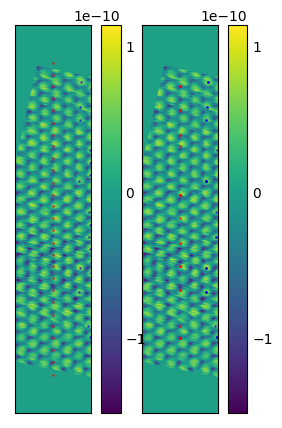

       cx   ry
159   201  445
161   201  464
191   201  182
193   201  201
221   201  370
223   201  389
244   201  332
246   201  351
313   201  483
358   201  276
360   201  295
415   201  257
720   201  539
722   201  558
730   201  220
732   201  238
738   201  314
786   201  577
813   201  502
815   201  520
825   201  408
827   201  426
899   201  163
1102  201  107
1104  201  126
1143  201  144
(26, 6)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


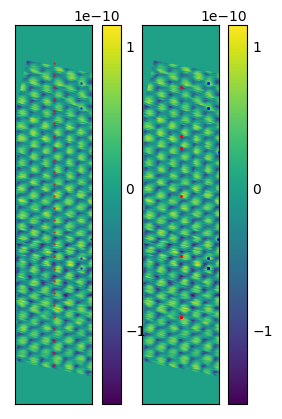

       cx   ry
106   218  267
192   218  191
194   218  210
220   218  361
222   218  379
337   218  473
339   218  492
352   218  398
391   218  549
393   218  567
414   218  248
535   218  342
548   218  436
550   218  455
681   218   97
683   218  116
719   218  530
731   218  229
739   218  323
770   218  285
787   218  586
826   218  417
900   218  173
1084  218  135
1086  218  154
1303  218  304
1736  218  511
(27, 7)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


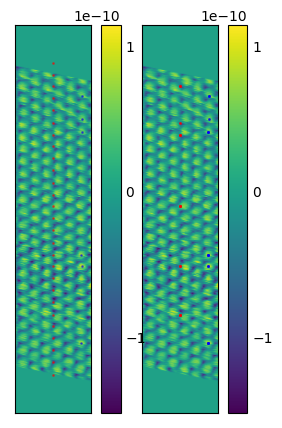

       cx   ry
105   234  257
107   234  276
336   234  464
338   234  483
349   234  370
351   234  389
390   234  539
392   234  558
451   234  201
453   234  220
547   234  426
549   234  445
575   234  295
617   234  238
680   234   88
682   234  107
751   234  351
882   234  408
903   234  126
905   234  144
959   234  182
1046  234  332
1087  234  163
1253  234  520
1314  234  314
1327  234  502
(26, 7)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


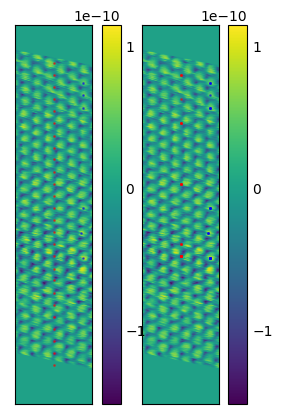

       cx   ry
99    250  267
286   250  248
298   250  285
323   250  135
325   250  154
395   250  342
411   250  361
413   250  379
458   250  210
576   250  304
854   250  436
881   250  398
883   250  417
919   250  549
922   250  567
939   250  455
941   250  473
960   250  191
1045  250  323
1154  250  173
1188  250  116
1252  250  511
1254  250  530
1322  250  229
1326  250  492
1554  250   97
(26, 9)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


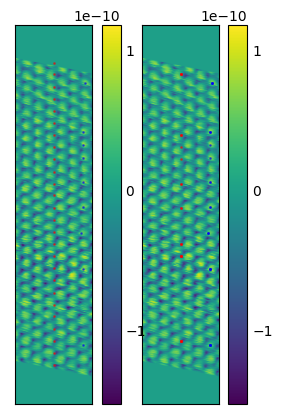

       cx   ry
40    267  238
88    267  257
101   267  276
300   267  295
324   267  144
327   267  163
394   267  332
396   267  351
457   267  201
459   267  220
506   267  370
567   267  426
855   267  445
918   267  539
921   267  558
979   267  182
999   267  314
1007  267  389
1009  267  408
1077  267  464
1298  267  126
1435  267  502
1438  267  520
1480  267  483
1555  267  107
2437  267   88
(26, 4)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


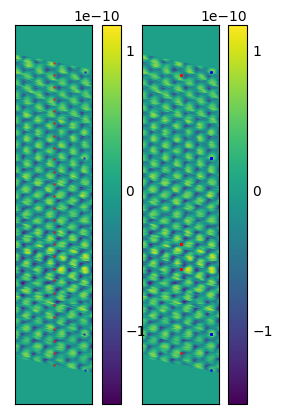

       cx   ry
39    283  229
42    283  248
90    283  267
299   283  285
326   283  154
403   283  210
566   283  417
569   283  436
627   283  304
805   283  361
808   283  379
920   283  549
980   283  191
1001  283  323
1002  283   97
1004  283  116
1041  283  530
1052  283  342
1069  283  455
1079  283  473
1269  283  398
1279  283   78
1299  283  135
1412  283  173
1437  283  511
1482  283  492
(26, 7)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


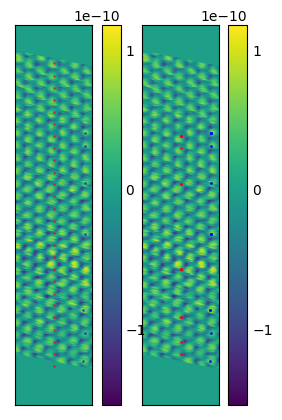

       cx   ry
33    299  238
59    299  257
174   299  351
207   299  276
251   299  220
340   299  163
342   299  182
402   299  201
428   299  295
568   299  426
710   299  445
807   299  370
880   299  389
1000  299  314
1003  299  107
1006  299  126
1043  299  539
1071  299  464
1108  299  144
1126  299  408
1278  299   69
1280  299   88
1566  299  332
1612  299  483
1665  299  502
1668  299  520
(26, 12)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


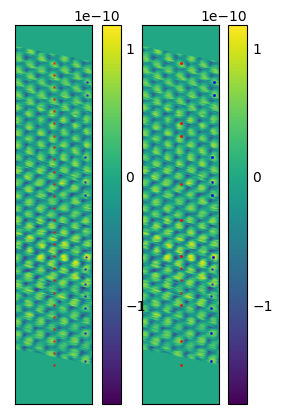

       cx   ry
32    315  229
35    315  248
61    315  267
84    315  210
173   315  342
176   315  361
292   315  285
341   315  173
344   315  191
430   315  379
709   315  436
799   315  455
964   315  398
1005  315  116
1010  315  304
1013  315  323
1107  315  135
1110  315  154
1128  315  417
1389  315  530
1392  315  549
1589  315   78
1592  315   97
1614  315  511
1638  315  473
1640  315  492
(26, 7)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


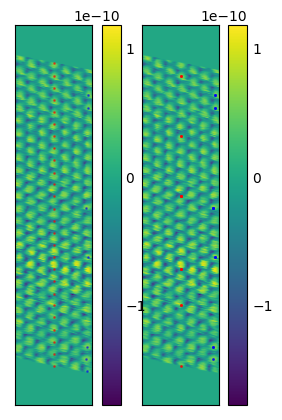

       cx   ry
34    332  238
36    332  220
60    332  257
83    332  201
175   332  351
275   332  276
343   332  182
429   332  370
432   332  389
473   332  163
597   332   69
605   332  332
629   332  295
798   332  445
850   332  314
966   332  408
1063  332  426
1106  332  126
1109  332  144
1145  332  107
1391  332  539
1393  332  558
1591  332   88
1615  332  520
1639  332  483
1641  332  502
1682  332  464
(27, 6)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


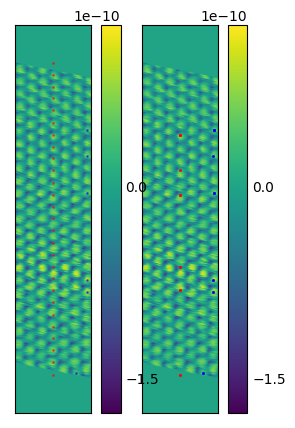

       cx   ry
16    348  229
18    348  248
85    348  210
164   348  191
274   348  267
382   348  173
431   348  379
491   348  342
494   348  361
500   348  398
502   348  417
596   348   60
599   348   78
628   348  285
631   348  304
851   348  323
1065  348  436
1067  348  455
1144  348   97
1146  348  116
1415  348  511
1417  348  530
1598  348  473
1600  348  492
1649  348  549
1695  348  135
1845  348  154
(27, 2)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


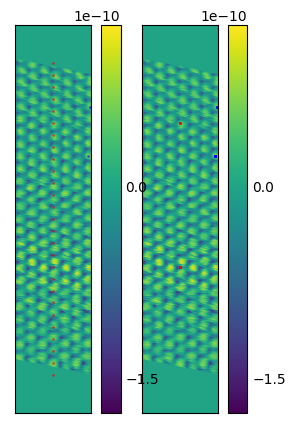

       cx   ry
4     364  220
6     364  238
62    364  201
163   364  182
228   364  332
230   364  351
381   364  163
495   364  370
501   364  408
503   364  426
591   364  389
598   364   69
600   364   88
630   364  295
687   364  257
689   364  276
925   364  445
1111  364  314
1172  364  107
1174  364  126
1223  364  144
1416  364  520
1418  364  539
1599  364  483
1601  364  502
1662  364  464
(26, 2)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


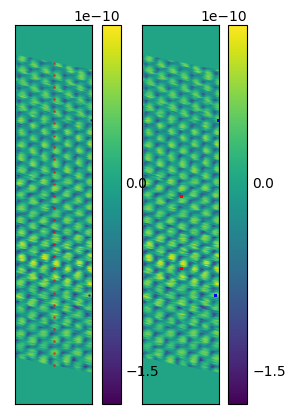

       cx   ry
5     381  229
63    381  210
91    381  191
229   381  342
380   381  154
383   381  173
421   381  361
423   381  379
579   381  248
668   381  304
670   381  323
688   381  267
715   381   60
717   381   78
908   381  116
910   381  135
915   381  285
924   381  436
926   381  455
943   381  417
1171  381   97
1195  381  398
1250  381  530
1603  381  511
1812  381  473
1941  381  492
2146  381  549
(27, 6)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


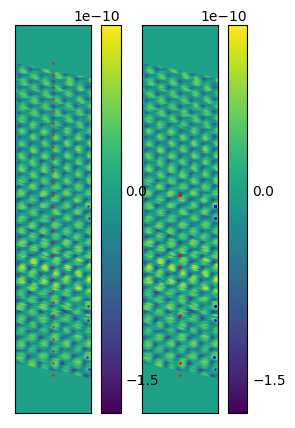

       cx   ry
51    397  220
53    397  238
92    397  201
422   397  370
424   397  389
488   397  257
490   397  276
539   397  332
541   397  351
582   397  107
584   397  126
669   397  314
685   397  520
697   397  408
699   397  426
716   397   69
718   397   88
916   397  295
946   397  445
1251  397  539
1295  397  163
1297  397  182
1650  397  144
1887  397  464
1940  397  483
1942  397  502
2525  397   50
(27, 5)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.7/dist-packages/seaborn_image/_core.py:134: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  norm=self.norm,


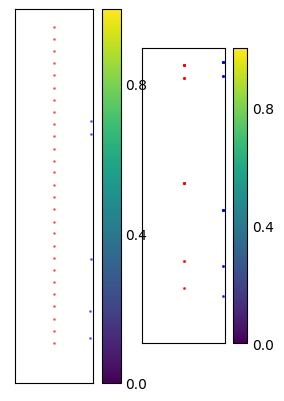

       cx   ry
48    413  191
50    413  210
52    413  229
124   413  248
307   413  398
309   413  417
374   413  267
540   413  342
542   413  361
581   413   97
583   413  116
684   413  511
686   413  530
700   413  436
792   413  323
1081  413   78
1088  413  304
1170  413  135
1180  413  285
1184  413  379
1238  413  173
1294  413  154
1703  413  455
1747  413  492
1888  413  473
2489  413   60
(26, 9)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


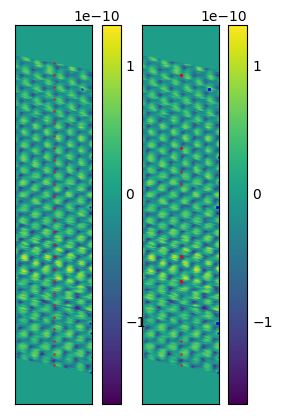

       cx   ry
1     429  201
3     429  220
47    429  182
123   429  238
125   429  257
259   429  314
261   429  332
308   429  408
310   429  426
346   429  107
348   429  126
375   429  276
621   429  163
748   429   88
778   429  445
795   429  351
821   429  520
913   429  370
1080  429   69
1181  429  295
1274  429  389
1509  429  464
1704  429  502
1746  429  483
2197  429  144
2488  429   50
(26, 2)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.7/dist-packages/seaborn_image/_core.py:134: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  norm=self.norm,


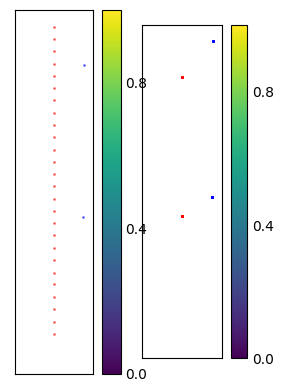

       cx   ry
0     446  191
2     446  210
129   446  229
134   446  248
140   446  173
216   446  398
218   446  417
260   446  323
262   446  342
345   446   97
347   446  116
355   446  267
482   446  361
588   446  135
620   446  154
747   446   78
820   446  511
823   446  530
869   446  285
871   446  304
914   446  379
1158  446  436
1508  446  455
1511  446  473
1828  446  492
2327  446   60
(26, 1)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


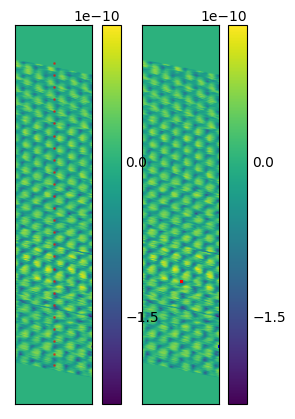

       cx   ry
12    462  201
14    462  220
67    462  238
94    462  182
217   462  408
219   462  426
235   462  163
243   462  257
256   462  144
276   462  314
278   462  332
356   462  276
481   462  351
483   462  370
552   462   88
585   462  107
587   462  126
656   462  389
822   462  520
870   462  295
1159  462  445
1291  462   69
1510  462  464
1731  462  502
1827  462  483
2326  462   50
(26, 4)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.7/dist-packages/seaborn_image/_core.py:134: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  norm=self.norm,


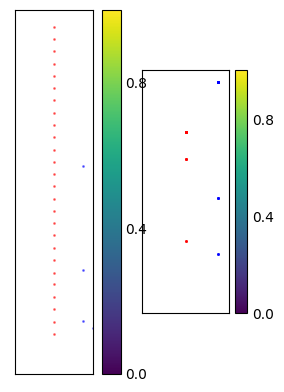

       cx   ry
8     478  191
10    478  210
15    478  229
44    478  173
68    478  248
255   478  135
257   478  154
268   478  342
270   478  361
277   478  323
367   478  304
389   478  267
512   478  417
551   478   78
553   478   97
593   478  436
657   478  398
760   478  379
767   478  285
1396  478  116
1733  478  511
1778  478  492
1832  478   60
1894  478  455
2034  478  473
2529  478   41
(26, 6)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.7/dist-packages/seaborn_image/_core.py:134: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  norm=self.norm,


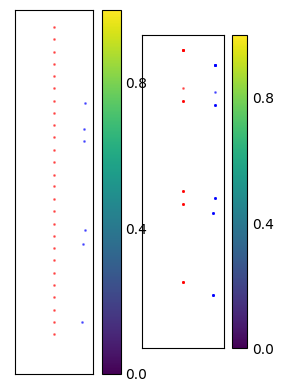

       cx   ry
7     495  182
9     495  201
23    495  220
43    495  163
172   495  238
269   495  351
272   495  370
368   495  314
370   495  332
401   495  257
438   495  408
466   495   88
514   495  426
595   495  445
655   495  276
756   495  389
772   495  107
928   495   50
1265  495  144
1337  495  295
1529  495  126
1654  495   69
1780  495  502
1783  495  483
1896  495  464
2271  495  520
(26, 4)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.7/dist-packages/seaborn_image/_core.py:134: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  norm=self.norm,


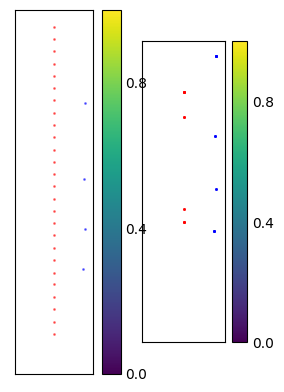

       cx   ry
19    511  191
22    511  210
76    511  173
112   511  229
115   511  248
135   511  154
248   511  417
271   511  361
437   511  398
465   511   78
468   511   97
544   511  135
594   511  436
704   511  267
724   511  304
727   511  323
755   511  379
774   511  116
834   511  342
894   511  285
927   511   41
930   511   60
1782  511  473
1785  511  492
1895  511  455
2222  511  511
(26, 5)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.7/dist-packages/seaborn_image/_core.py:134: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  norm=self.norm,


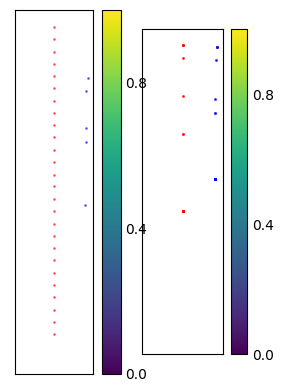

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


       cx   ry
21    527  201
24    527  220
25    527  182
114   527  238
117   527  257
137   527  163
232   527  389
247   527  408
250   527  426
461   527  144
467   527   88
523   527  351
526   527  370
543   527  126
638   527  295
706   527  276
726   527  314
729   527  332
773   527  107
929   527   50
1439  527   69
1784  527  483
1841  527  445
1953  527  502
1973  527  464
(25, 6)


/usr/local/lib/python3.7/dist-packages/seaborn_image/_core.py:134: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  norm=self.norm,


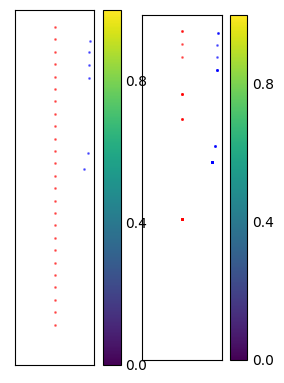

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


       cx   ry
27    543  191
30    543  210
72    543  173
113   543  229
116   543  248
118   543  154
184   543  304
231   543  379
234   543  398
249   543  417
447   543  342
460   543  135
485   543  361
637   543  285
705   543  267
728   543  323
1290  543  436
1441  543   78
1584  543  455
1952  543  492
2071  543  473
2126  543  511
2367  543   60
2379  543   97
2381  543  116
(25, 2)


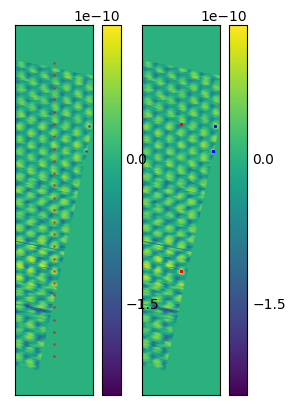

       cx   ry
73    560  182
75    560  201
119   560  163
183   560  295
186   560  314
195   560  220
197   560  238
233   560  389
333   560  276
446   560  332
449   560  351
462   560  144
477   560  483
479   560  502
487   560  370
817   560  426
819   560  445
840   560  257
867   560  408
1463  560  464
(20, 1)


/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


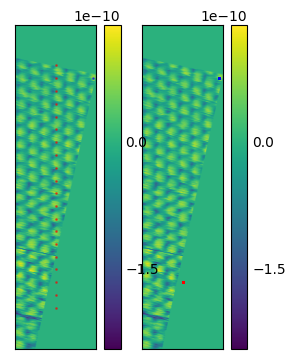

       cx   ry
145   576  379
147   576  398
182   576  285
185   576  304
225   576  361
332   576  267
445   576  323
448   576  342
478   576  492
818   576  436
839   576  248
955   576  229
1032  576  417
1138  576  455
1140  576  473
2239  576  210
       cx   ry
146   592  389
224   592  351
226   592  370
320   592  408
322   592  426
696   592  445
1139  592  464
1365  592  332
1383  592  483
1570  592  314
2474  592  502
2515  592  295
       cx   ry
319   609  398
321   609  417
507   609  473
509   609  492
695   609  436
1353  609  455
2229  609  379
       cx   ry
508   625  483
510   625  502
2387  625  464


In [ ]:
import sklearn
from sklearn.metrics import pairwise_distances

from sklearn.metrics.pairwise import paired_distances
from sklearn.metrics.pairwise import pairwise_distances_argmin

# points 를 골라내서 그릴 ref plane 
ref_plane  = z_LIX_fNb_xr_pad_aff.z_fwd_df

# 앞서 골라낸 peak 과 ref points(selected) 
p_pts_df = pd.DataFrame(p_pts, columns= ["cx","ry"])
r_pts_slct_df
#p_pts_df, r_pts_slct_df 간의 offset이 존재함. 
#사이의 평균거리가 가장 작아지는 r  offset을 찾아야한다. 
r_pts_slct_offset = round(p_pts_df.mean() -r_pts_slct_df.mean()).astype(int)
# point set 간 평균거리를 구하고 
r_pts_slct_df = r_pts_slct_df + r_pts_slct_offset
# 그만큼 ref. popint 이동

atom_distance_idx = int(ref_lattice_a0 // z_LIX_fNb_xr_pad_aff.X_spacing)
#(원자사이 간격_idx), integer

# ref point 들을 cx 기준으로 불러오기위해 
# cx 를 겹치는 부분 빼고 (unique) 하나씩 골라냄. 
r_pts_slct_df_cx = np.sort(r_pts_slct_df.cx.unique())
# 불러온  cx 하나씩 골라서 for 문으로
p_pts_df_slct =  p_pts_df
rp_pairs_all = np.zeros([1,4])  # empty list 하나 만들고,

for cx_i in r_pts_slct_df_cx: 
    # print(cx_i) 기준이 되는 cx 
    cx_group_pts = (r_pts_slct_df.cx == cx_i) 
    print (r_pts_slct_df[cx_group_pts]) # ref points 중 cx== cx_i 인곳들만 불러냄 
    #~~~~~~~~~~~~~~#
    r_pts_slct_df_cx_set =  r_pts_slct_df[cx_group_pts]
    #처음에는 cx 에 해당하는  ref points  list 불러옴. 
    

    #~~~~~~~~~~~~~~#
    # selected group 에 atom_distance_idx 에 대해서 dialation 
    # retangle area 의 start & end point 지정
    start_pt = (r_pts_slct_df_cx_set.cx.min()-3*atom_distance_idx,
                r_pts_slct_df_cx_set.ry.min()-3*atom_distance_idx)
    end_pt = (r_pts_slct_df_cx_set.cx.max()+3*atom_distance_idx,
              r_pts_slct_df_cx_set.ry.max()+3*atom_distance_idx)
    #slicing 할 곳의 start, end (x,y) 형태로 +- atom_distance_idx 
    #isns.imshow(ref_plane[start_pt[1]:end_pt[1],start_pt[0]:end_pt[0]], origin="lower")
    mask_cx_group = (p_pts_df_slct.cx > start_pt[0]
                     ) & (p_pts_df_slct.cx < end_pt[0]
                          ) &(p_pts_df_slct.ry > start_pt[1]
                              ) &  (p_pts_df_slct.ry < end_pt[1]) 
    # masking 을 이용해서 원하는 영역의 ref_plane 을 골라내고, 
    # 그 영역 내부에 존재하는  ref points 와 peak point를 불러온다. 
    p_pts_df_slct_cx_set = p_pts_df_slct[mask_cx_group]
    #선택한 cx 영역 내부에 들어오는 p_pts 를 기본으로 삼고, 
    # 그가운데 선 ref 와 간격을 기준으로 점 선택 
    
    if len(p_pts_df_slct_cx_set) ==0 : 
    # 만일 p 영역이 비어 있다면 아무것도 안하고 넘어감. 
        pass    
    else : 
            
            # 비어있지 않다면, 
        # r - p pair 를 만든다. 

        p_t = p_pts_df_slct_cx_set.to_numpy()
        r_t = r_pts_slct_df_cx_set.to_numpy()
        ## sklearn 사용하기 위해서 np 로 변환 
        print (pairwise_distances(r_t,p_t).shape)
        ## 각 점의 set 에 대해서 distance pair를 구하는 법 
        pairwise_distances_argmin(r_t,p_t)
        ## 각 점에 대해서 distance min을 갖는 idx 찾는법. 
        p_t_slct = p_t[pairwise_distances_argmin(r_t,p_t)]
        ## 각점에 대한 distance min 을 찾은 결과 
        # p_t_slct 를 기준으로 r_t  를다시 한번 골라낸다. 
        r_t_slct = r_t[pairwise_distances_argmin(r_t,p_t_slct)]

        ########################################
        for p_t_slct_pt in p_t_slct: 
            p_t_slct_pt_mask += p_pts_df_slct.isin(p_t_slct_pt) 
        
        p_pts_df_slct = p_pts_df_slct[~p_t_slct_pt_mask]
        # oK 한번쓴 POINT는 DATA FRAME에서 지워냈다. 
        ########################################
        rp_pairs =  np.hstack([r_t_slct,p_t_slct]) 
        ## ref pt 와 peak point pairs ( 3D data )
        #r_pairs = r_t # ref points
        #p_pairs = p_t_slct # peak points 
        rp_pairs_all = np.append(rp_pairs_all,rp_pairs, axis=0) 

        fig, axes = plt.subplots(1, 2, figsize=(3,6))
        isns.imshow(ref_plane[start_pt[1]:end_pt[1],start_pt[0]:end_pt[0]],
                    origin = "lower",
                    ax=axes[0])
        axes[0].scatter(p_pts_df_slct_cx_set.cx - start_pt[0],
                        p_pts_df_slct_cx_set.ry - start_pt[1],
                        s=1,
                        c='b', 
                        alpha = 0.5)
        axes[0].scatter(r_pts_slct_df[cx_group_pts].cx - start_pt[0],
                    r_pts_slct_df[cx_group_pts].ry - start_pt[1],
                    s=1,
                    c='r', 
                    alpha = 0.5)
        # scatter plot 할때 cx point에 따라서 offset 이 있음. start_pt 를 빼줘야함.
        isns.imshow(ref_plane[start_pt[1]:end_pt[1],start_pt[0]:end_pt[0]],
                    origin = "lower",
                    ax=axes[1]) 
        axes[1].scatter(rp_pairs[:,0] - start_pt[0],
                        rp_pairs[:,1] - start_pt[1],
                        s=1,
                        c='r', 
                        alpha = 0.5) 
        axes[1].scatter(rp_pairs[:,2] - start_pt[0],
                        rp_pairs[:,3] - start_pt[1],
                        s=1,
                        c='b', 
                        alpha = 0.5)
        # scatter 는 x,y 순서 
        plt.show()

    #p_pts_df_slct = p_pts_df_slct[~mask_cx_group]
    # 다 끝나면 선택된 부분은 날려버려야함. 
    # offset 선택 다시 해봐야할듯. 
    


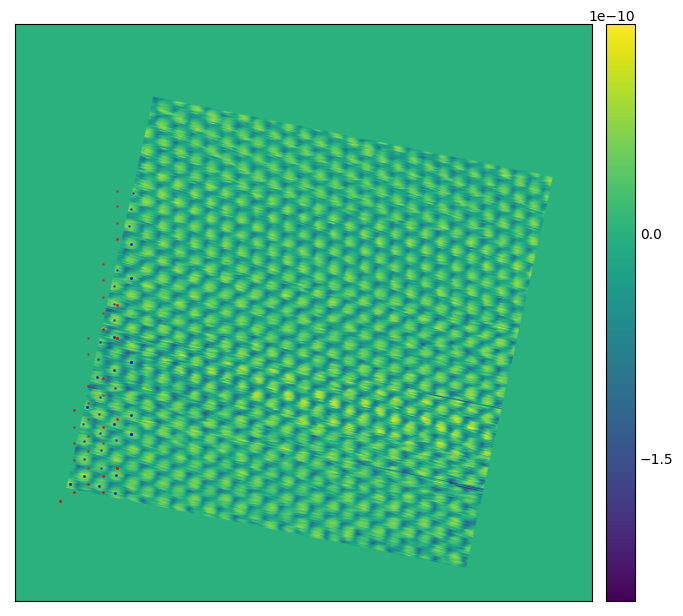

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(8,8))
isns.imshow(ref_plane,
            origin = "lower",
            ax=axes) 
axes.scatter(rp_pairs_all[:,0],
                rp_pairs_all[:,1],
                s=1,
                c='r', 
                alpha = 0.5) 
axes.scatter(rp_pairs_all[:,2],
                rp_pairs_all[:,3],
                s=1,
                c='b', 
                alpha = 0.5)
# scatter 는 x,y 순서 
plt.show()

## find offset !! 


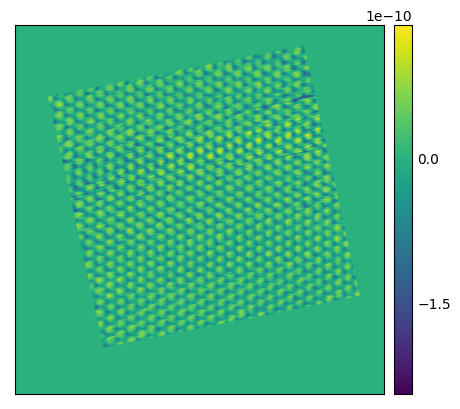

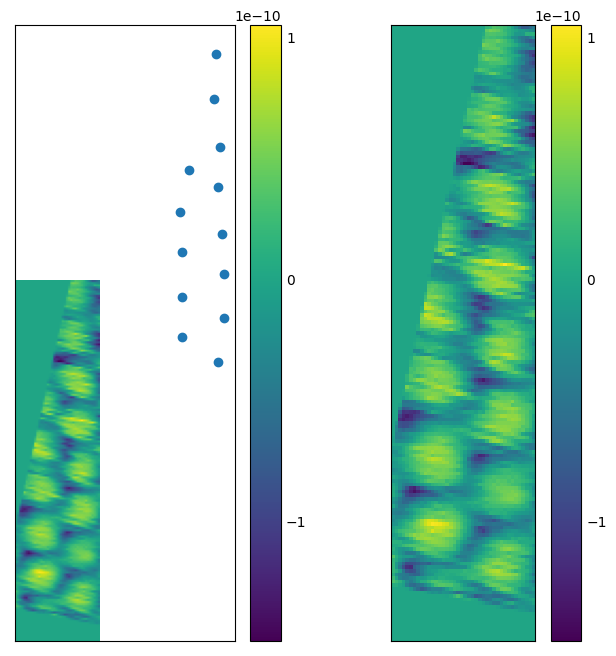

In [ ]:
ref_plane  = z_LIX_fNb_xr_pad_aff.z_fwd_df
isns.imshow(ref_plane)


p_pts_df = pd.DataFrame(p_pts, columns= ["cx","ry"])
r_pts_slct_df = pd.DataFrame(r_pts_slct, columns= ["cx","ry"])

#p_pts_df.sort_values("cx")
r_pts_slct_df.sort_values("cx")
r_pts_slct_df_cx = np.sort(r_pts_slct_df.cx.unique())
# cx 를 겹치는 부분 빼고 (unique) 하나씩 골라냄. 


r_pts_slct_df_cx_1 = r_pts_slct_df[r_pts_slct_df.cx ==r_pts_slct_df_cx[2] ]
# 첫번째 항만 골라내면 


atom_distance_idx = int(ref_lattice_a0 // z_LIX_fNb_xr_pad_aff.X_spacing)
#(원자사이 간격, index로 쓰기위한 정수화)

start_cx1 = (r_pts_slct_df_cx_1.cx.min()-atom_distance_idx, 
             r_pts_slct_df_cx_1.ry.min()-atom_distance_idx)
# x,y
end_cx1 = (r_pts_slct_df_cx_1.cx.max()+atom_distance_idx,
           r_pts_slct_df_cx_1.ry.max()+atom_distance_idx)
# x,y
ref_plane[start_cx1[1]:end_cx1[1], start_cx1[0]:end_cx1[0]] 
# array에 대입할때는 ry,cx 순서로 
p_pts_df_slct =  p_pts_df

mask_cx_group = (p_pts_df_slct.cx > start_cx1[0]
                    ) & (p_pts_df_slct.cx < end_cx1[0]
                        ) &(p_pts_df_slct.ry > start_cx1[1]
                            ) &  (p_pts_df_slct.ry < end_cx1[1]) 
p_pts_df_slct_cx_set = p_pts_df_slct[mask_cx_group]


#ary = distance.cdist(df1.iloc[:,1:], df2.iloc[:,1:], metric='euclidean')


#p_pts_df 가운데  영역 내부에 들어가는 점들 골라냄



fig, axes = plt.subplots(1, 2, figsize=(8,8))
isns.imshow(ref_plane[start_cx1[1]:end_cx1[1],start_cx1[0]:end_cx1[0]],
            origin = "lower",
            ax=axes[0])

#np.array([ref_plane.X [cx]  for cx in p_pts_df_slct_cx_set.cx])
#np.array([ref_plane.Y [ry]  for ry in p_pts_df_slct_cx_set.ry])
# 선택한 지점에  해당하는 X,Y point 
p_pts_df_slct_cx_set
axes[0].scatter(p_pts_df_slct_cx_set.cx,p_pts_df_slct_cx_set.ry)
#axes[0].scatter(r_pts_slct_df_cx_1.cx,r_pts_slct_df_cx_1.ry)
isns.imshow(ref_plane[start_cx1[1]:end_cx1[1],start_cx1[0]:end_cx1[0]],
            origin = "lower",
            ax=axes[1])
plt.show()


#isns.imshow(r_pts_df_cx_1)

#ndimage.binary_dilation(r_pts_df_cx_1,).astype(int)

In [ ]:
mask_cx_group = (p_pts_df_slct.cx > start_cx1[0]
                    ) & (p_pts_df_slct.cx < end_cx1[0]
                        ) &(p_pts_df_slct.ry > start_cx1[1]
                            ) &  (p_pts_df_slct.ry < end_cx1[1]) 

In [ ]:
ref_plane[start_cx1[1]:end_cx1[1],start_cx1[0]:end_cx1[0]]

<xarray.DataArray 'z_fwd_df' (Y: 105, X: 40)>
array([[0.0000000e+00, 0.0000000e+00, 5.2911189e-11, ..., 3.3528302e-11,
        4.1021849e-11, 5.1278690e-11],
       [0.0000000e+00, 0.0000000e+00, 1.6242665e-11, ..., 5.5637026e-11,
        6.4044818e-11, 6.7304537e-11],
       [0.0000000e+00, 0.0000000e+00, 2.5368709e-11, ..., 6.7327866e-11,
        7.3008398e-11, 7.5656197e-11],
       ...,
       [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 6.2417474e-11,
        6.2956113e-11, 6.5059375e-11],
       [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 5.7607061e-11,
        5.9465814e-11, 5.8966436e-11],
       [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 6.0621654e-11,
        5.8428318e-11, 5.5775509e-11]], dtype=float32)
Coordinates:
  * Y        (Y) float64 8.097e-10 8.228e-10 8.359e-10 ... 2.157e-09 2.17e-09
  * X        (X) float64 -1.451e-10 -1.32e-10 -1.189e-10 ... 3.52e-10 3.65e-10

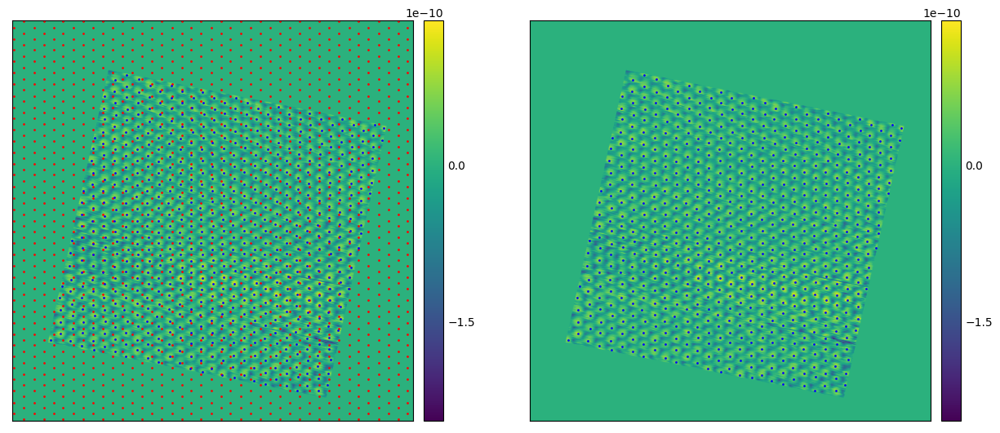

In [ ]:
#xr_data = z_LIX_fNb_xr_pad_aff
ref_lattice_a0 = 0.246E-9
######################################
# non-zero xr-data
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
#xr_data.z_fwd_df.where (~xr_data.z_fwd_df.isin(0))
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
xr_data_gaussian  = gaussian_filter(
    xr_data.z_fwd_df, sigma=2)
xr_data_lcl_pks_rycx = peak_local_max(    xr_data_gaussian,
      min_distance = int(0.25*ref_lattice_a0//xr_data.X_spacing),
      exclude_border=0,
      threshold_rel = 0.25)
# 대략 원자간의 거리 의 pixel 수 의 1/4
# threshold_rel = 0.25 으로 바깥쪽 0 를 제외함 
# 결과값이 ry,cx 순서라서 다시 바꿔줌 
xr_data_lcl_pks = xr_data_lcl_pks_rycx[:,::-1]


fig, axes = plt.subplots(1, 2, figsize=(15,10), sharex=True, sharey=True)
axs = axes.ravel()
isns.imshow(xr_data.z_fwd_df, origin  ="lower",  ax = axs[0] )
axs[0].scatter(z_LIX_fNb_xr_pad_aff_r_lattice[:,1],
               z_LIX_fNb_xr_pad_aff_r_lattice[:,0],
               s=1,
               c='r')
isns.imshow(xr_data.z_fwd_df, origin  ="lower",  ax = axs[1] )
axs[0].scatter(xr_data_lcl_pks[:,0],
            xr_data_lcl_pks[:,1],
            s=1,
            c='b')
axs[1].scatter(xr_data_lcl_pks[:,0],
            xr_data_lcl_pks[:,1],
            s=1,
            c='b')
plt.show()
#

In [ ]:
xr_data_lcl_pks

<xarray.DataArray 'z_fwd_df' (Y: 612, X: 612)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * Y        (Y) float64 -5.859e-10 -5.732e-10 ... 7.159e-09 7.172e-09
  * X        (X) float64 -5.859e-10 -5.732e-10 ... 7.159e-09 7.172e-09

In [ ]:
xr_data.z_fwd_df.where (~xr_data.z_fwd_df.isin(0))




<xarray.DataArray 'z_fwd_df' (Y: 612, X: 612)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * Y        (Y) float64 -5.859e-10 -5.732e-10 ... 7.159e-09 7.172e-09
  * X        (X) float64 -5.859e-10 -5.732e-10 ... 7.159e-09 7.172e-09

In [ ]:
for xr_data_lcl_pk in xr_data_lcl_pks :
    #print (xr_data_lcl_pk)
    #if xr_data.z_fwd_df.where (~xr_data.z_fwd_df.isin(0))[xr_data_lcl_pk]!=0]



# interpolation 이전에 

# ref list 를 기반으로 affine 






In [ ]:
xr_data =z_LIX_fNb_xr

xr_data_lcl_pks = peak_local_max(
    xr_data.z_fwd_df.values,
      min_distance = int(xr_data.X.max() // ref_lattice_a0))
이중  xr_data.z_fwd_df.values = 0  인곳은 제외 ''


In [ ]:
int(0.25*ref_lattice_a0//xr_data.X_spacing)#z_LIX_fNb_xr_pad.z_fwd_df.values


5




## Xarray 의 interpolation method 활용 

* scipy 에도 있다 
    * https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.interp2d.html
* xarray 의 multi-dimensional interpolation이 좀더 다루기 쉽다. 
    * http://xarray.pydata.org/en/stable/user-guide/interpolation.html
    * 또한, remapping에도 활용할수 있다


* pixe-wise data analsis 할때 Gaussain convolution 으로 인한 peak point의 sub-pixel resolution을 다루기위해서 

*2D image data 를 interpolation  

## Xarray Interpolation
* check interp_number (default = 4)
> * adjust **aspect ratio**  of the image during interpoloation 


In [ ]:
###############################
# plane fit before interpolation 
# if there are salt&pepper noise, use median filter as well
##############################

z_LIX_fNb_xr.z_fwd_df.values =  plane_x_fit_df(plane_y_fit_df(z_fwd_df))
z_LIX_fNb_xr.z_bwd_df.values =  plane_x_fit_df(plane_y_fit_df(z_bwd_df))

z_LIX_fNb_xr.LIX_fwd_df.values =  plane_x_fit_df(plane_y_fit_df(LIX_fwd_df))
z_LIX_fNb_xr.LIX_bwd_df.values =  plane_x_fit_df(plane_y_fit_df(LIX_bwd_df))

###############################
# z_LIX_fNb_xr interpolation 
###############################
interp_number = 4

X_interp = np.linspace(
    z_LIX_fNb_xr.X[0], z_LIX_fNb_xr.X[-1], z_LIX_fNb_xr.X.shape[0]*interp_number) 
Y_interp = np.linspace(
    z_LIX_fNb_xr.Y[0], z_LIX_fNb_xr.Y[-1], z_LIX_fNb_xr.Y.shape[0]*interp_number) 
# x, y를 INTERPORLATION
z_LIX_fNb_xr_intrp = z_LIX_fNb_xr.interp(X = X_interp, Y = Y_interp)
# z_LIX_fNb_xr_intrp # 확인 


# 2D FFT after interpolation 
##

* xr interpoloation이후에는 interpolation에의한 효과가 너무 강하게 나옴. 
* 나중에 piecewise affine 이후 결과를 다시 확인해보자. 



## 2D FFT results & ref (3fold symmetry) 6 points 
* ref points :  marking circle (red)
* measured local max : marking circle (blue)
* 6 local peaks : marking circle (black)


FFT image 

* ref: HOPG reference 6 spots 
* point input (3) -> GUI in put으로 받으려 했으나. 
    * gui input은 colab상황에서는 잘 맞지 않음. 
    * https://stackoverflow.com/questions/56129786/cannot-load-backend-qt5agg-which-requires-the-qt5-interactive-framework-as
    * GUI input을 쓰려면 colab 대신 spyder써야한다. 
* ref. point 를 대신 기준으로 근방의 local max point를 고른다. 






# Find Atom Positions After File Loading 


Peak local maximum using Gaussian Filter

# Supplement Information

### HG Kim's ( WSxM과 같은 컬러맵 만들기)
### a.k.a.  Julio in wsxm


In [ ]:
from matplotlib.patches import Circle

#################################
# FFT 그리고 ref.6points 표시하기 
#################################

fig,axes = plt.subplots(2,2, figsize = (6,6))
axs = axes.ravel()
for i,ch_map in enumerate (z_LIX_fNb_xr_fft_colunmns):
    isns_channel = ch_map+'isns'
    print(ch_map)    
    #isns_channel = z_LIX_fNb_xr_fft[ch_map].plot.imshow(ax =axs[i],robust = False)
    # 이유는 알수 없으나 xr의 기본 plot를 사용하면 circle add가 안된다. 
    isns_channel = isns.imshow(z_LIX_fNb_xr_fft[ch_map], ax =axs[i],robust = True)
    axs[i].set_aspect(1)
    # xr.plot.imshow로 그리면 aspect ratio다시 수정 필요함
    #################################
    # Red circle for peak positions
    #################################
    for r_i, ref6points_kspace_idx in  enumerate(ref6points_kspace_idxs):
        ref_circles = Circle(tuple(ref6points_kspace_idx), # center idxs
                                ref6p_radious/2, # radius
                                facecolor = 'none', 
                                edgecolor = 'red',
                                linewidth = 1,
                                alpha = 0.5)
        axs[i].annotate(str(r_i),ref6points_kspace_idx, color='w', size =8) #번호넣기
        axs[i].add_patch(ref_circles)
        
    #################################
    # BLUE circle for peak positions
    #################################
    local_peaks_in_ch = skimage.feature.peak_local_max(
        z_LIX_fNb_xr_fft[ch_map].values, 
        min_distance=int(ref6p_radious/2),
        threshold_rel = 0.2 )
         # channel image 별로loca peak 가운데 상위 20 % 찾음.
    #################
    for local_peak in  local_peaks_in_ch:
        peak_bumps= Circle(tuple(local_peak),
                             ref6p_radious/2, # radius
                             facecolor = 'none', 
                             edgecolor = 'blue',
                             linewidth = 1,
                             alpha = 0.5) 
        axs[i].add_patch(peak_bumps)
        
    ###################################################
    # 측정한 local peak 가운데서 ref 와 가까운 peak들만 골라냄. 
    ###################################################   
    peak6points_kspace_idxs = np.empty_like(ref6points_kspace_idxs)
    # channel 마다 측정한 6locl peak이 들어갈 장소
    #print (peak6points_kspace_idxs)
    for j, ref6points_kspace_idx in enumerate (ref6points_kspace_idxs):
        # ref6point  하나씩 불러와서 
        peak6points_kspace_idx= np.array(
            [ distance.euclidean(ref6points_kspace_idx,local_peak)
                for local_peak in local_peaks_in_ch]
                ).argmin()
        # list comprehension으로 
        #local peaks list에 있는 점들과 거리 비교하는 np.array를 만들고 
        # 그중 arg min 으로 거리가 가장 가까운 점의 index를 찾는다. 
        #print(ref6points_kspace_idx)
        #print(local_peaks_in_ch[peak6points_kspace_idx])
        peak6points_kspace_idxs[j] = local_peaks_in_ch[peak6points_kspace_idx]
    print(peak6points_kspace_idxs)
        #local_peaks_in_ch_corresponding
    #################
    for p_j, peak6points_kspace_idx in enumerate(peak6points_kspace_idxs):
        peak_6points = Circle(tuple(peak6points_kspace_idx),
                            ref6p_radious/2, # radius
                            facecolor = 'none', 
                            edgecolor = 'black',
                            linewidth = 1,
                            alpha = 0.5) 
        axs[i].annotate(str(p_j),
                        tuple(peak6points_kspace_idx)
                        , color='r',
                        size =8) #번호넣기
        axs[i].add_patch(peak_6points)

plt.show()


print ('6 reference spots')
print (ref6points_kspace_idxs)
print ('6 measured peaks')
print (peak6points_kspace_idxs)

#math.atan2(targetY-gunY, targetX-gunX)

In [ ]:

# 구간 정의
step = 32

# 컬러 RGB 중간 변수 입력
r = np.array([7, 119, 160, 199, 221, 240, 249, 249, 249]) / 256
g = np.array([0, 10, 43, 83, 128, 176, 216, 242, 240]) / 256
b = np.array([0, 0, 0, 11, 44, 76, 149, 217, 240]) / 256

# 빈 리스트 정의
R = []
G = []
B = []

# 사이값 배열 만들기
for i in np.arange(0,8,1):
    
    # 레드
    R0 = np.linspace(r[i], r[i+1], step + 1)
    R0 = np.delete(R0, step, axis = 0)
    R.append(R0)
    
    # 그린
    G0 = np.linspace(g[i], g[i+1], step + 1)
    G0 = np.delete(G0, step)
    G.append(G0)
    
    # 블루
    B0 = np.linspace(b[i], b[i+1], step + 1)
    B0 = np.delete(B0, step)
    B.append(B0)

# 리스트 배열로 만들기
R = np.array(list(itertools.chain.from_iterable(R)))
G = np.array(list(itertools.chain.from_iterable(G)))
B = np.array(list(itertools.chain.from_iterable(B)))

# 2차원 배열 만들기
wsxm_color_map_array = np.ones((256, 4))
wsxm_color_map_array[:, 0] = R
wsxm_color_map_array[:, 1] = G
wsxm_color_map_array[:, 2] = B

# 컬러맵으로 변수 저장
wsxm_cmap = ListedColormap(wsxm_color_map_array)

# 그래프로 확인해보기
fig, ax = plt.subplots(1, 2, figsize = (12, 6))

isns.imshow(z_fwd_df_plane, ax = ax[0], robust = True, cmap = wsxm_cmap)
ax[0].set_title('FWD')
isns.imshow(z_bwd_df_plane, ax = ax[1], robust = True, cmap = wsxm_cmap)
ax[1].set_title('BWD')

plt.show()